# Capture traces for 07.12

#### Try-out

In [ ]:
!pip install ipython ipympl ipywidgets -Uq
!pip install --upgrade ipython -Uq

In [ ]:
import matplotlib.pylab as plt

In [ ]:
%matplotlib ipympl
import matplotlib.pylab as plt
    
plt.plot([1,2,2,4,5], 'r')
plt.plot([3,1,5,5,7], 'g')
plt.show()

#### Agregates

In [1]:
import matplotlib.pyplot as plt

In [2]:
%run "./File_Uploader.ipynb"


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip
C:\Users\Samuel\AppData\Local\Temp\ipykernel_2804\4114886631.py:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  import pkg_resources


In [3]:
%run "./ANN_Observer.ipynb"

✔️ The Setuper class succesfuly imported.
✔️ The ANN_Observer class succesfuly imported.


In [45]:
%run "./Analyser.ipynb"

[ 8  2  6  4  4  6 10  6]
[256, 258, 4550, 1666, 2245, 6546, 7888, 6788]
[  512   516  9100  3332  4490 13092 15776 13576]
[ 256  258 4550 1666 2245 6546 7888 6788]
256
258
4550
1666
2245
6546
7888
6788
✔️ The Analyser succesfuly runned.


#### Definitions

In [5]:
scope : cw.scope = None
target: cw.target = None
cw_setuper: CW_Setuper
def setup(makedir):
    global scope
    global target
    global cw_setuper
    make_dir = makedir
    re_init_config = {"MAKEDIR" : f'./{make_dir}/'}
    cw_setuper = CW_Setuper(firmware_reinit = True, re_init_dict  = re_init_config)
    scope = cw_setuper.scope
    target = cw_setuper.target
    return scope, target, cw_setuper

In [6]:
def calc_corr(waves, rand_inputs, _func, _name, epochs, trace_len):
    ncorr_all1 = _func(rand_inputs, np.array(waves)[:,:], n_traces = epochs, trace_len = trace_len, ith_weight = 0, calc_p_value=False)
    np.save(f"E:/DP_database/database/corrs_{_name}.npy", np.array(ncorr_all1))
    plot_mult(np.array(ncorr_all1)[:,:], _type = "tmp", ylim=[-1,1])
    return ncorr_all1

In [55]:
def capture_target(scope, epochs_list = [3000], ncorr_all1 = None, ncorr_all2 = None, decimate = 1, reverse = False, runName="_722_BasicMLP",trace_len_mult:int=1):
    for i in trange(len(epochs_list), desc='Capturing and Analysing the traces:'):
        global epochs
        epochs = epochs_list[i]
        cmd = 'p'
        if reverse:
            cmd = 'o'
        name = f"{runName}_Dec{decimate}-ntg{decimate}-{epochs}" #ntg no-target-reset
     
        scope_setup(samples=24429*trace_len_mult, decimate=decimate)    
        traces, rand_inputs = measure_traces(cmd=cmd)
        waves = []
        out_data = []
        for i in traces:
            waves.append(i[0])
            out_data.append(i[2])
        plot_mult(np.array(waves[0]), _type = name, mult=False)
        files = save_data(waves, rand_inputs, out_data[0], path="E:/DP_database/database", name_extended = name)
        #upload_file_to_gdrive(files,  dir_path = "E:/DP_database/database/")
        #Analysis
        print(out_data[0])
        ith_weight = 0
        start = ith_weight*epochs
        #rand_inputs = np.array(rand_inputs)
        #ncorr_all1 = calc_corr(waves=np.array(waves)[:,4000:10000], rand_inputs= np.array(rand_inputs), _func=V2_ANN_CPA_OTS, _name="tmp_corr", epochs=epochs, trace_len=6000)
        #ncorr_all2 = calc_corr(waves=np.array(waves)[:,4000:10000], rand_inputs= np.array(rand_inputs), _func=oldV2_ANN_CPA_OTS, _name="tmp_corr", epochs=epochs, trace_len=6000)
        #ncorr_all3 = calc_corr(waves=np.array(waves)[:,4000:10000], rand_inputs= np.array(rand_inputs), _func=ancientV2_ANN_CPA_OTS, _name="tmp_corr", epochs=epochs, trace_len=6000)
        
        #ncorr_all1 = calc_corr(waves=waves, rand_inputs= np.array(rand_inputs), _func=V2_ANN_CPA_OTS, _name="tmp_corr", epochs=epochs, trace_len=24000)
        #ncorr_all2 = calc_corr(waves=waves, rand_inputs= np.array(rand_inputs), _func=oldV2_ANN_CPA_OTS, _name="tmp_corr", epochs=epochs, trace_len=24000)
        #ncorr_all3 = calc_corr(waves=waves, rand_inputs= np.array(rand_inputs), _func=ancientV2_ANN_CPA_OTS, _name="tmp_corr", epochs=epochs, trace_len=24000)
        #ncorr_all4 = calc_corr(waves=waves, rand_inputs= np.array(rand_inputs), _func=originV2_ANN_CPA_OTS, _name="tmp_corr", epochs=epochs, trace_len=24000)
        
        diff_avg, avg_wave, var, ____ = createDiffWave(waves, runName)
    cw_setuper._scope_disc_()
    scope : cw.scope = None
    target: cw.target = None
    return rand_inputs, waves, out_data[0]

In [7]:
def capture_correlate(scope, epochs_list = [3000], ncorr_all1 = None, ncorr_all2 = None, decimate = 1, reverse = False, runName="_722_BasicMLP"):
    for i in trange(len(epochs_list), desc='Capturing and Analysing the traces:'):
        global epochs
        epochs = epochs_list[i]
        cmd = 'p'
        if reverse:
            cmd = 'o'
        name = f"{runName}_Dec{decimate}-ntg{decimate}-{epochs}" #ntg no-target-reset
     
        scope_setup(samples=24429, decimate=decimate)    
        traces, rand_inputs = measure_traces(cmd=cmd)
        waves = []
        out_data = []
        for i in traces:
            waves.append(i[0])
            out_data.append(i[2])
        plot_mult(np.array(waves[0]), _type = name, mult=False)
        files = save_data(waves, rand_inputs, out_data[0], path="E:/DP_database/database", name_extended = name)
        #upload_file_to_gdrive(files,  dir_path = "E:/DP_database/database/")
        #Analysis
        print(out_data[0])
        ith_weight = 0
        start = ith_weight*epochs
        #rand_inputs = np.array(rand_inputs)
        #ncorr_all1 = calc_corr(waves=np.array(waves)[:,4000:10000], rand_inputs= np.array(rand_inputs), _func=V2_ANN_CPA_OTS, _name="tmp_corr", epochs=epochs, trace_len=6000)
        #ncorr_all2 = calc_corr(waves=np.array(waves)[:,4000:10000], rand_inputs= np.array(rand_inputs), _func=oldV2_ANN_CPA_OTS, _name="tmp_corr", epochs=epochs, trace_len=6000)
        #ncorr_all3 = calc_corr(waves=np.array(waves)[:,4000:10000], rand_inputs= np.array(rand_inputs), _func=ancientV2_ANN_CPA_OTS, _name="tmp_corr", epochs=epochs, trace_len=6000)
        
        ncorr_all1 = calc_corr(waves=waves, rand_inputs= np.array(rand_inputs), _func=V2_ANN_CPA_OTS, _name="tmp_corr", epochs=epochs, trace_len=24000)
        ncorr_all2 = calc_corr(waves=waves, rand_inputs= np.array(rand_inputs), _func=oldV2_ANN_CPA_OTS, _name="tmp_corr", epochs=epochs, trace_len=24000)
        ncorr_all3 = calc_corr(waves=waves, rand_inputs= np.array(rand_inputs), _func=ancientV2_ANN_CPA_OTS, _name="tmp_corr", epochs=epochs, trace_len=24000)
        ncorr_all4 = calc_corr(waves=waves, rand_inputs= np.array(rand_inputs), _func=originV2_ANN_CPA_OTS, _name="tmp_corr", epochs=epochs, trace_len=24000)
        
    cw_setuper._scope_disc_()
    scope : cw.scope = None
    target: cw.target = None
    return ncorr_all1, ncorr_all2, ncorr_all3, ncorr_all4, rand_inputs, waves, out_data[0]

In [8]:
def analyse_corr(corr_map: np.ndarray, weights: list[int], stop_num = 5, maxims_map = None, _index = 0, peak_range = 0.3, show_info=True, mountain_half_dist = 5, level = 3):
    index = _index
    for secret in weights:
        
        print(f"Hello {secret}")
        secret_value, time_sample, correlation, localMax_vector, colmn_maxVector, nextIndex, maxims_map = get_weight(correlation_matrix=corr_map,
                                                                                                                     peak_range=peak_range,
                                                                                                                     show_info=True,
                                                                                                                     lastIndex=index,
                                                                                                                     map_2dgrMaxs=maxims_map,
                                                                                                                     mountain_half_dist=mountain_half_dist,
                                                                                                                     level=level)
    
        index = nextIndex
        figure, axis = plt.subplots(1, 2)
        # Comparison to real correlation
        axis[0].plot(colmn_maxVector, color='b', label='agregate_of_maxs_corrs', linewidth=0.5)
        axis[0].plot(corr_map[secret], color='g', label=f'secret_val_corr = {secret}', linewidth=0.5)
        #axis[0].legend(loc='upper right')
        axis[0].legend(bbox_to_anchor=(0.75, 1.15), ncol=2)
        axis[0].set_title("All - Real")
        plt.xlabel("Time Sample")
        plt.ylabel("Correlation")
        plt.axvline(x = index, color = 'orange')
    
        # Comparison to found correlation
        axis[1].plot(colmn_maxVector, color='b', label='agregate_of_maxs_corrs', linewidth=0.5)
        axis[1].plot(corr_map[secret_value], color='r', label=f'found_corr = {secret_value}', linewidth=0.5)
        #axis[1].legend(loc='upper right')
        axis[1].legend(bbox_to_anchor=(0.75, -0.5), ncol=2)
        axis[1].set_title("All - Found")
        plt.axvline(x = index, color = 'orange')
    
        #figure.savefig(f'{name}_correlation.png')
    
        stop_num -= 1
        if stop_num == 0:
            break
        plt.show()
        last_found_indx = time_sample

## Capture Traces

## Zkonstatovanie: 

-  HW(int) ma problem s urcenim Parnych vah

### QUANTIZATED_Basic ANN CPA, and turned off optimalization while building, 1000 traces

In [9]:
scope, target, cw_setuper = setup("makefile_dir_2-akt")
time.sleep(10)

⚠️ Changed, firmware config!!!
✔️ Firmware maked, with command cd %s | make CRYPTO_TARGET=%s PLATFORM=%s FIRMWAREPATH=%s SS_VER=%s TARGET=%s> output.txt 2>warnings_new.txt.
INFO: Found ChipWhisperer😍
✔️ INFO: Scope and Target, are set😍
❤️ Target hex: ./makefile_dir_2-akt/simpleserial-target-CWLITEARM.hex
Detected known STMF32: STM32F302xB(C)/303xB(C)
Extended erase (0x44), this can take ten seconds or more
Attempting to program 17083 bytes at 0x8000000
STM32F Programming flash...
STM32F Reading flash...
Verified flash OK, 17083 bytes
✔️ Setuper initiated.


Capturing and Analysing the traces::   0%|          | 0/1 [00:00<?, ?it/s]

⚠️ Generating rand_input..


                                Capturing traces:   0%|          | 0/1000 [00:00<?, ?it/s]

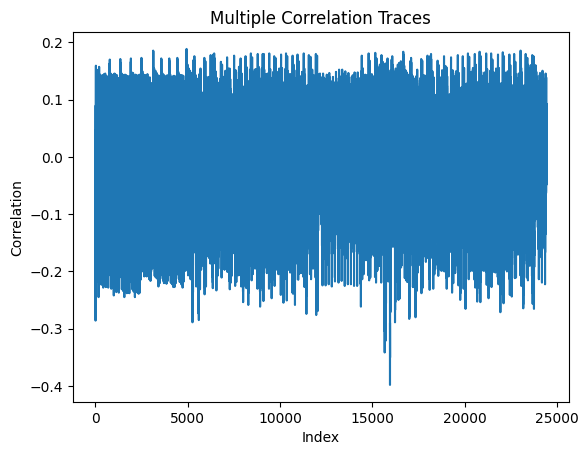

✔️ Saving Rand_input succesfull.
🌍 Saving Secret_weights succesfull.
CWbytearray(b'00 72 2b 2d cf 46 29 04 00 b4 78 d8 68 a7 00 ff 3f 2b f1 fc 00 d9 7a 96 09 2c 00 a5 57 74 64 c4 00 af 15 28 a4 e9 00 57 db 5e 20 fb 00 00 cd 00')


Calculating Correlations for the Secret-Key:   0%|          | 0/256 [00:00<?, ?it/s]

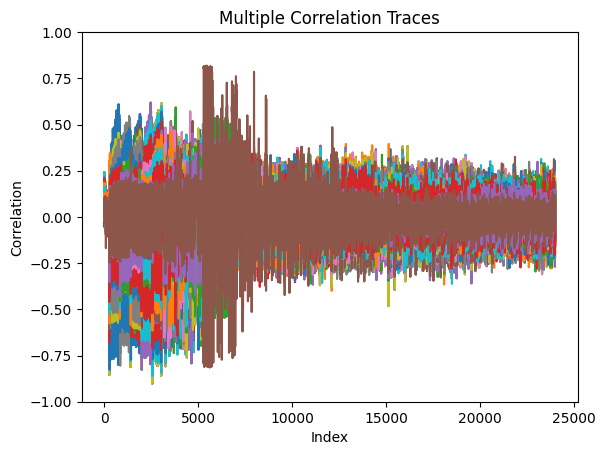

Calculating Correlations for the Secret-Key:   0%|          | 0/256 [00:00<?, ?it/s]

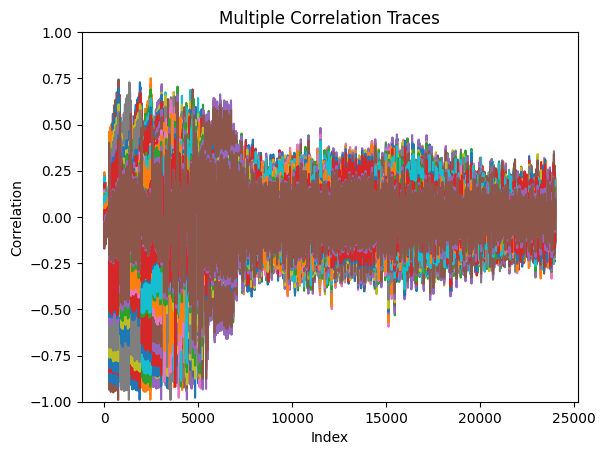

Calculating Correlations for the Secret-Key:   0%|          | 0/256 [00:00<?, ?it/s]

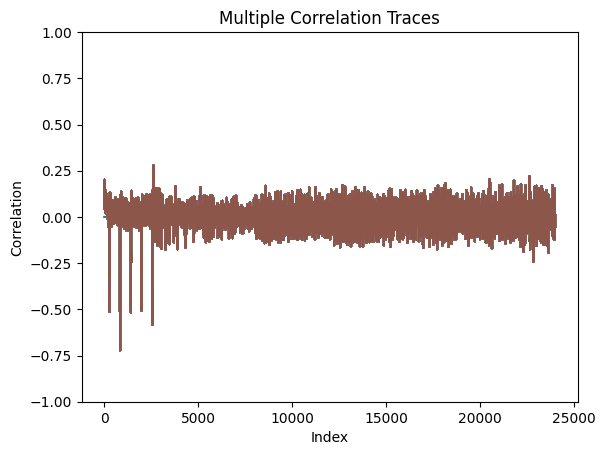

Calculating Correlations for the Secret-Key:   0%|          | 0/256 [00:00<?, ?it/s]

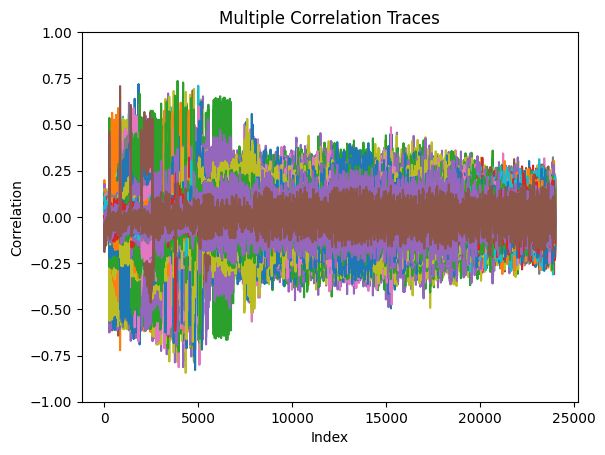

✔️ Scope disconnected.
✔️ Firmware disconnected.


In [10]:
corr1_1000, corr2_1000, corr3_1000, corr4_1000, rand_input, waves, out = capture_correlate(scope, epochs_list = [1000], ncorr_all1 = None, ncorr_all2 = None, decimate = 1, reverse = False, runName="_722_BasicMLP")

#### SPA

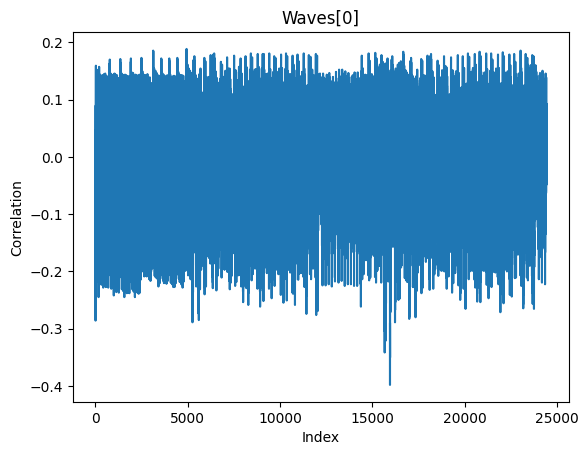

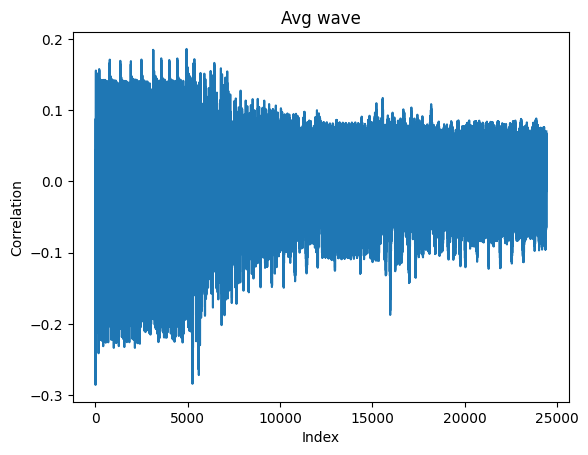

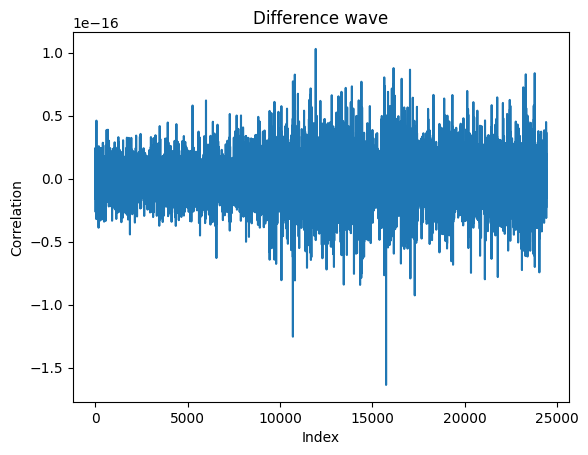

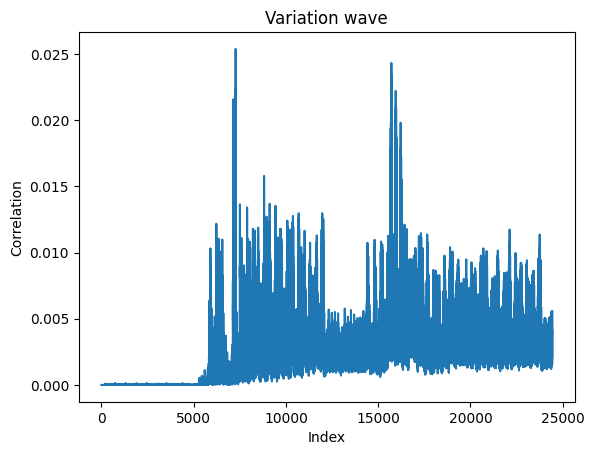

In [12]:
diff_avg, avg_wave, var, ____ = createDiffWave(waves, "1000_722")

#### Additional analysis (CPA get weight)

##### HW(int)

In [13]:
np.array(out)[3:-4]

array([ 45, 207,  70,  41,   4,   0, 180, 120, 216, 104, 167,   0, 255,
        63,  43, 241, 252,   0, 217, 122, 150,   9,  44,   0, 165,  87,
       116, 100, 196,   0, 175,  21,  40, 164, 233,   0,  87, 219,  94,
        32, 251], dtype=uint8)

Hello 45
5647
 Index of global max: 2561 and global_max_val: 0.9010439649414532


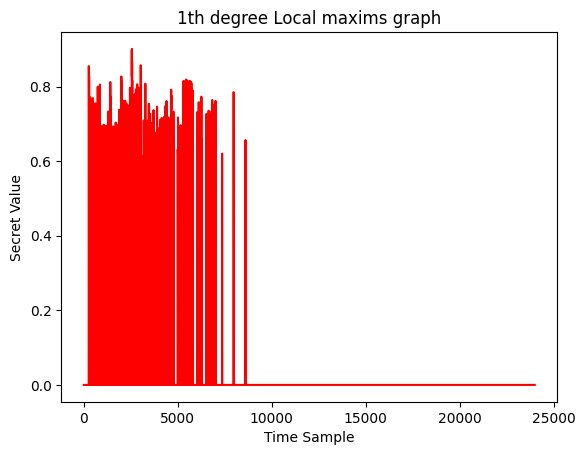

Number of uniques: 25
Number of local maxims: 818
Uniquess: [1, 45, 129, 207, 35, 41, 59, 55, 113, 177, 101, 23, 91, 161, 155, 39, 65, 57, 7, 31, 15, 53, 245, 117, 255]
Local maxims: [1, 1, 1, 1, 1, 1, 1, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 1, 1, 129, 1, 1, 1, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 1, 1, 1, 1, 1, 1, 1, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 1, 1, 1, 1, 1, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 

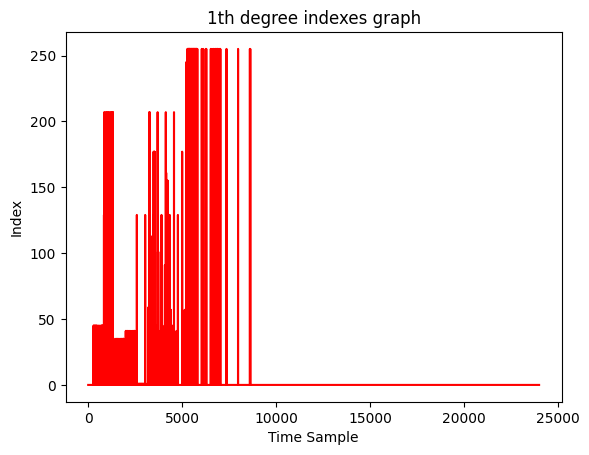

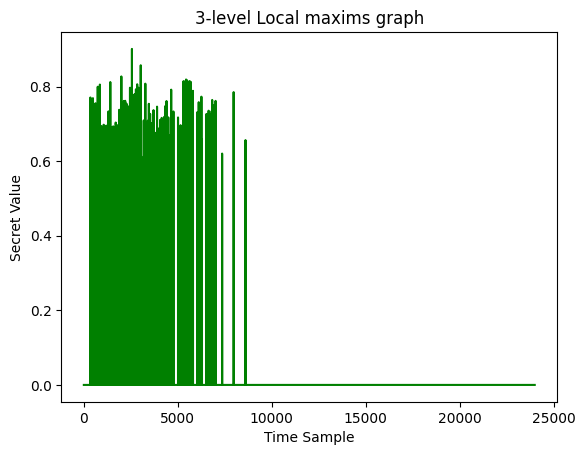

Number of uniques: 21
Number of local maxims: 98
Uniquess: [45, 207, 1, 35, 41, 59, 55, 113, 129, 177, 101, 161, 155, 39, 57, 7, 31, 15, 53, 245, 255]
Local maxims: [45, 45, 45, 45, 45, 45, 45, 45, 207, 207, 207, 207, 207, 207, 207, 207, 1, 35, 35, 35, 35, 35, 35, 35, 41, 41, 41, 41, 41, 41, 41, 41, 1, 1, 1, 1, 1, 1, 1, 1, 1, 45, 59, 207, 1, 55, 113, 129, 177, 45, 101, 35, 41, 129, 1, 45, 161, 155, 39, 129, 57, 45, 207, 7, 41, 31, 129, 15, 53, 245, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255]


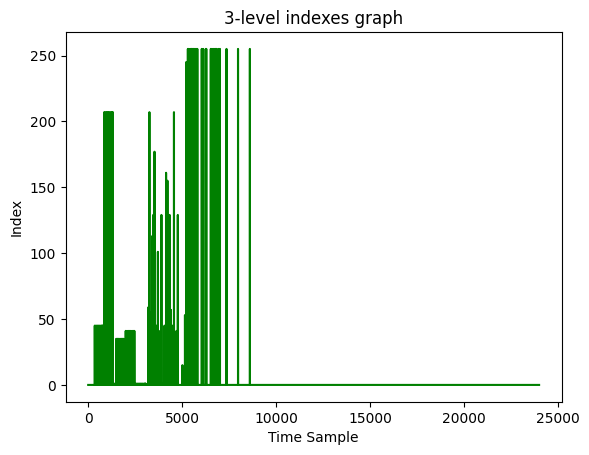

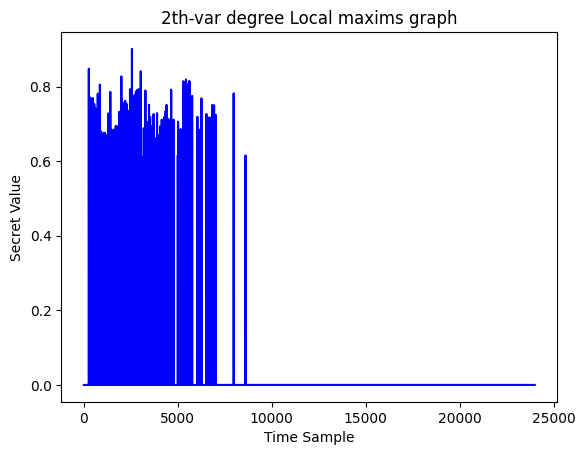

Number of uniques: 22
Number of local maxims: 118
Uniquess: [1, 45, 207, 35, 41, 55, 113, 129, 177, 101, 91, 161, 155, 39, 57, 23, 7, 31, 15, 53, 245, 255]
Local maxims: [1, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 207, 207, 207, 207, 207, 207, 207, 207, 207, 1, 35, 35, 35, 35, 35, 35, 35, 35, 1, 41, 41, 41, 41, 41, 41, 41, 41, 41, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 45, 207, 1, 35, 55, 41, 113, 129, 177, 177, 45, 207, 101, 35, 41, 129, 1, 1, 1, 45, 91, 207, 161, 35, 155, 41, 39, 129, 57, 57, 57, 45, 23, 207, 35, 7, 41, 31, 129, 177, 15, 1, 57, 53, 245, 245, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255]


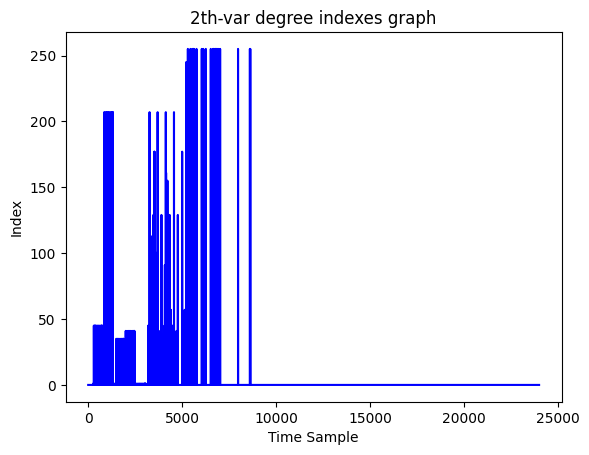

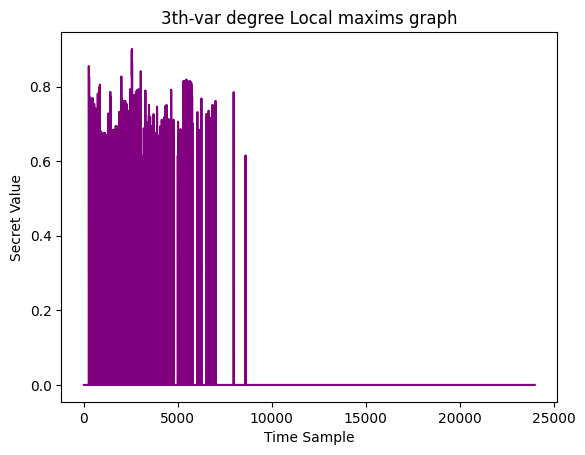

Number of uniques: 23
Number of local maxims: 542
Uniquess: [1, 45, 207, 35, 41, 129, 55, 113, 177, 101, 91, 161, 155, 39, 57, 23, 7, 31, 15, 53, 245, 117, 255]
Local maxims: [1, 1, 1, 1, 1, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 1, 1, 1, 1, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 1, 1, 1, 1, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 1, 1, 1, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 129, 1, 45, 45, 45, 207, 207, 1, 1, 1, 35, 35, 55, 55, 55, 41, 113, 113, 113, 129, 129, 129, 177, 177, 177, 17

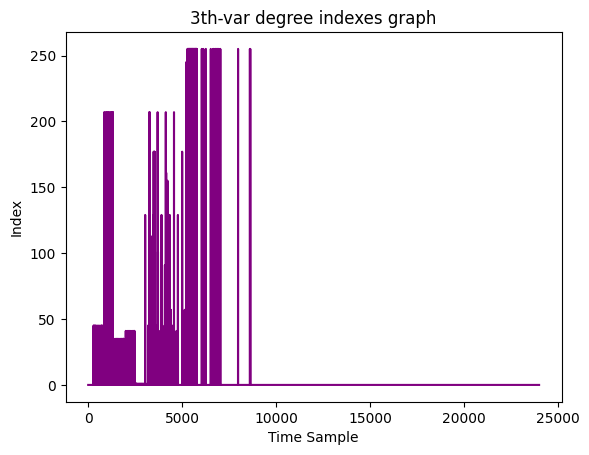

In range 0 - 24000
 Found the soonest secret value is 1, at the time sample 266, with correlation secret_corr = 0.848


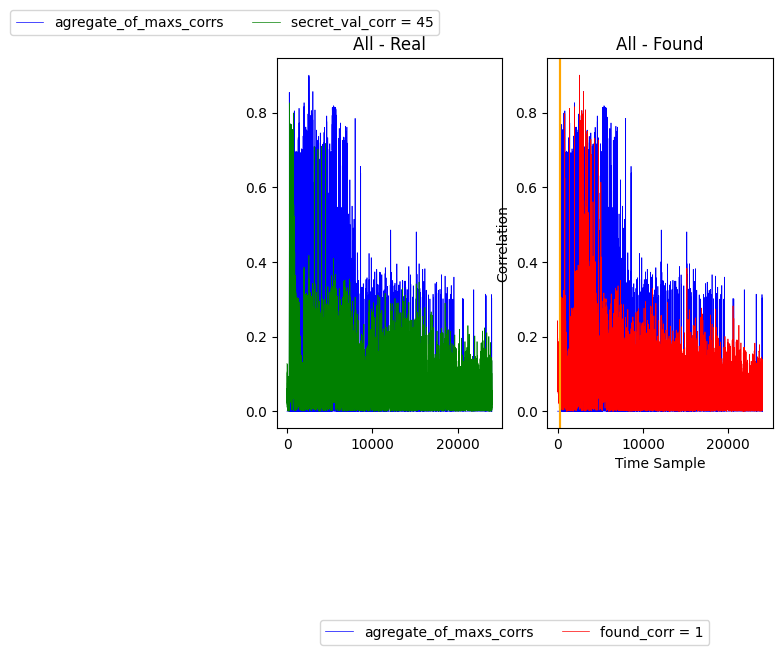

Hello 207
In range 283 - 24000
 Found the soonest secret value is 45, at the time sample 301, with correlation secret_corr = 0.648


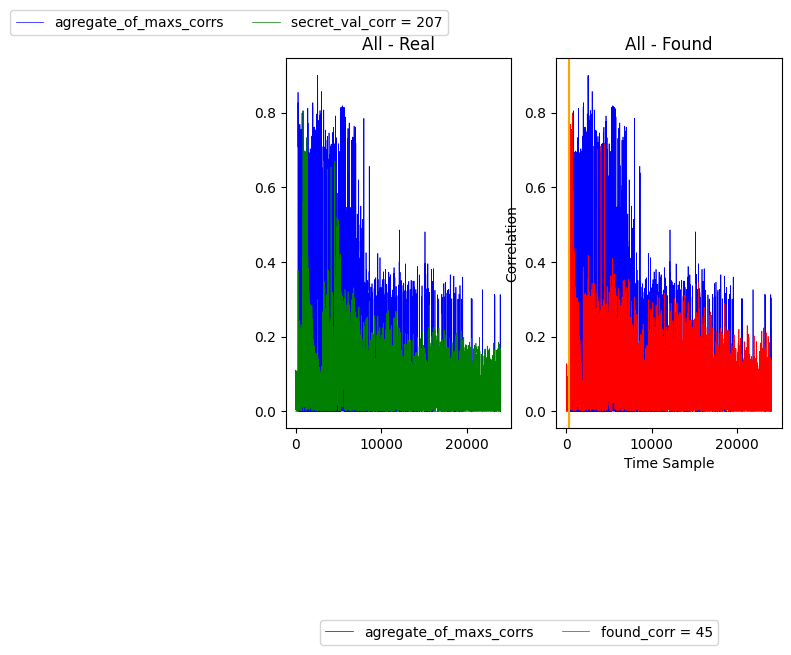

Hello 70
In range 326 - 24000
 Found the soonest secret value is 45, at the time sample 350, with correlation secret_corr = 0.771


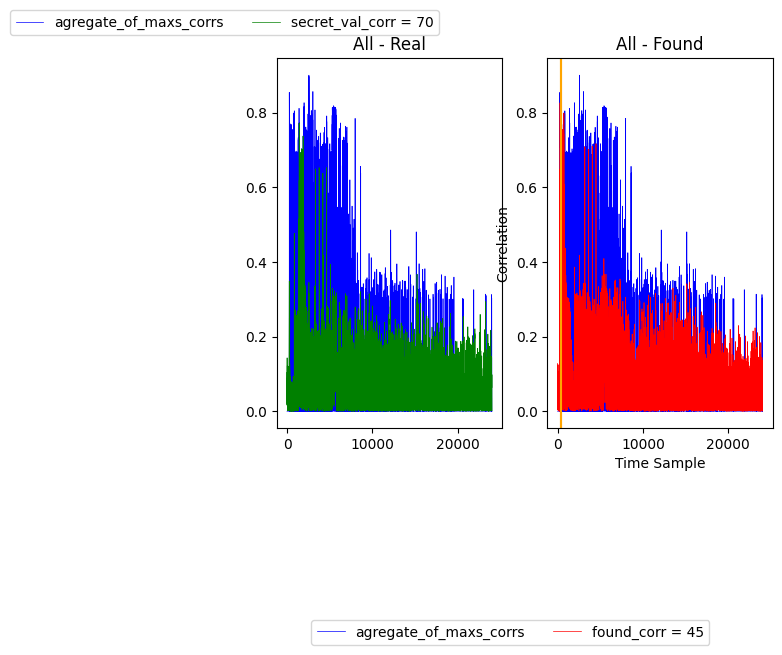

Hello 41
In range 360 - 24000
 Found the soonest secret value is 45, at the time sample 370, with correlation secret_corr = 0.608


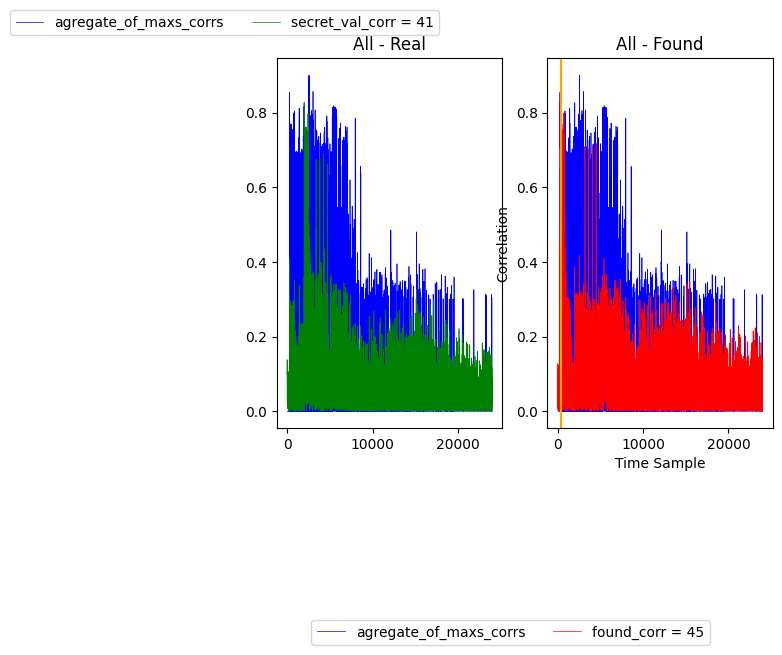

Hello 4
In range 394 - 24000
 Found the soonest secret value is 45, at the time sample 418, with correlation secret_corr = 0.760


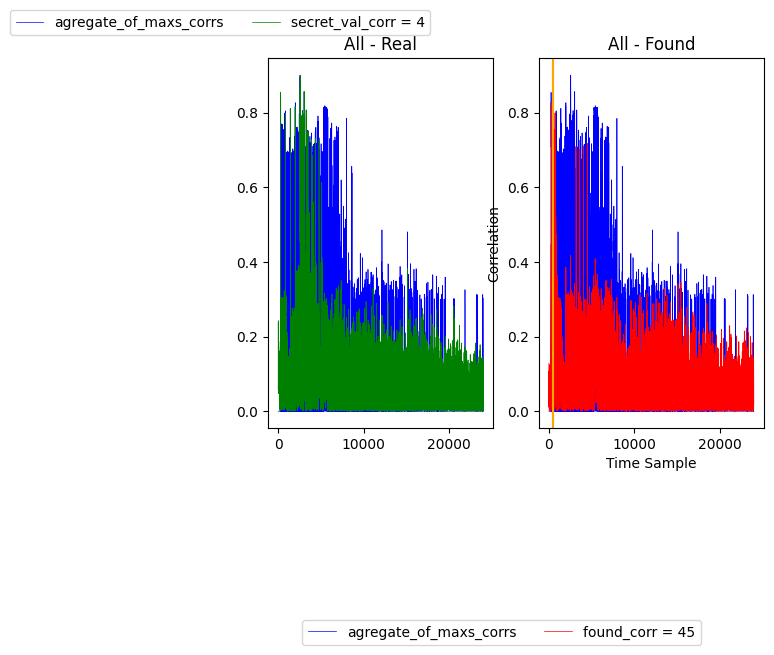

In [14]:
corr_map = abs(np.array(corr1_1000)[:,:])
analyse_corr(corr_map=corr_map, weights=np.array(out)[3:-4], stop_num = 5, maxims_map = None,
                 _index = 0, peak_range = 0.3, show_info=True, mountain_half_dist = 5, level = 3)

##### HW(char)

In [15]:
np.array(out)[3:-4]

array([ 45, 207,  70,  41,   4,   0, 180, 120, 216, 104, 167,   0, 255,
        63,  43, 241, 252,   0, 217, 122, 150,   9,  44,   0, 165,  87,
       116, 100, 196,   0, 175,  21,  40, 164, 233,   0,  87, 219,  94,
        32, 251], dtype=uint8)

Hello 45
7603
 Index of global max: 741 and global_max_val: 0.9905374740300941


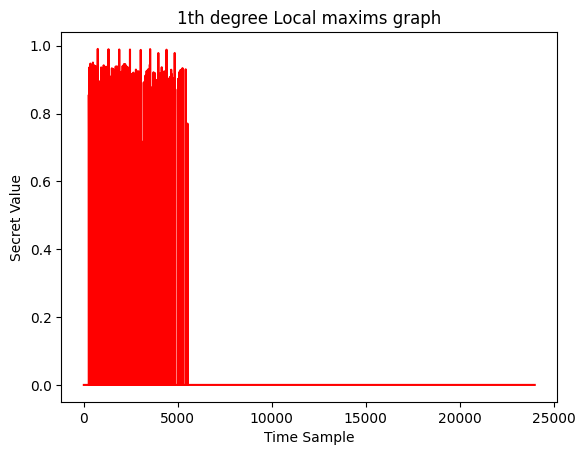

Number of uniques: 32
Number of local maxims: 716
Uniquess: [1, 45, 90, 207, 70, 41, 4, 216, 220, 113, 177, 136, 158, 101, 253, 184, 252, 16, 182, 161, 155, 78, 8, 114, 46, 14, 124, 240, 30, 126, 106, 234]
Local maxims: [1, 1, 1, 1, 1, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 90, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 1, 1, 1, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 1, 1, 1, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70

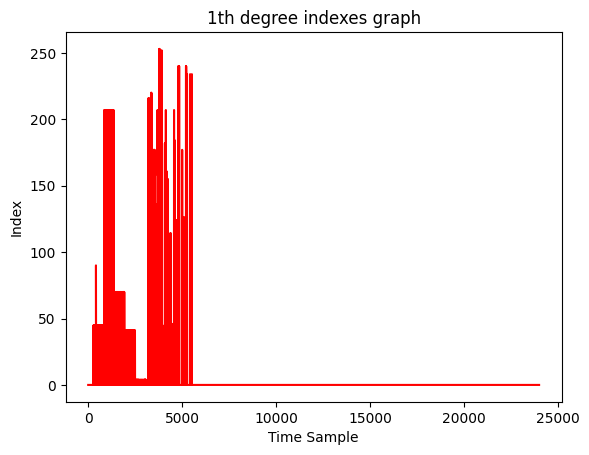

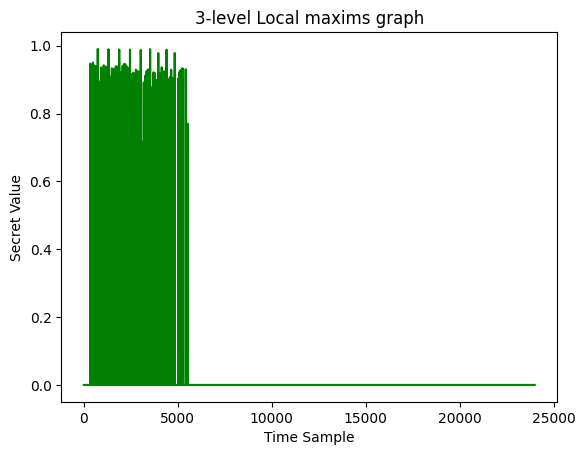

Number of uniques: 26
Number of local maxims: 78
Uniquess: [45, 207, 70, 41, 4, 220, 113, 177, 136, 101, 253, 184, 16, 182, 161, 155, 78, 114, 46, 14, 124, 240, 30, 126, 106, 234]
Local maxims: [45, 45, 45, 45, 45, 45, 45, 45, 207, 207, 207, 207, 207, 207, 207, 207, 207, 70, 70, 70, 70, 70, 70, 70, 70, 41, 41, 41, 41, 41, 41, 41, 41, 41, 4, 4, 4, 4, 4, 4, 4, 4, 4, 45, 207, 4, 220, 41, 113, 177, 177, 45, 136, 101, 70, 253, 184, 16, 16, 182, 161, 155, 78, 114, 114, 46, 184, 14, 124, 240, 240, 30, 126, 106, 234, 234, 234, 234]


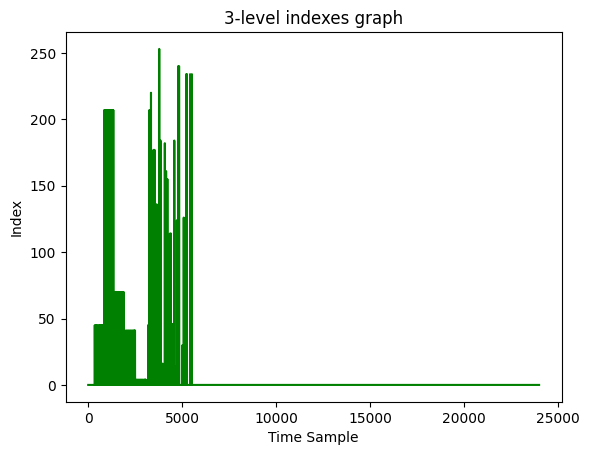

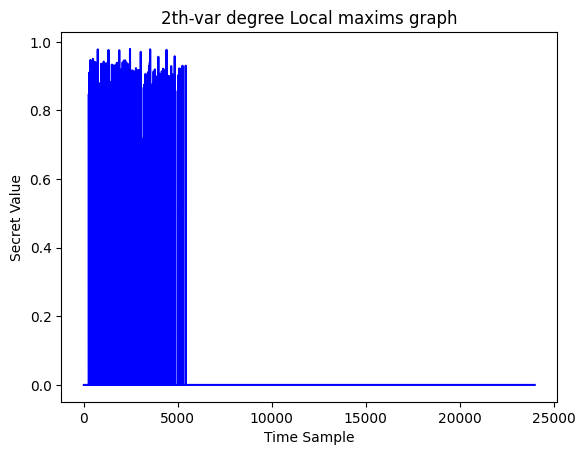

Number of uniques: 29
Number of local maxims: 133
Uniquess: [1, 45, 207, 70, 41, 4, 216, 220, 113, 177, 136, 101, 253, 184, 16, 182, 161, 155, 78, 8, 114, 46, 14, 124, 240, 30, 126, 106, 234]
Local maxims: [1, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 1, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 1, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 1, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 45, 216, 216, 207, 4, 70, 220, 220, 41, 113, 113, 177, 177, 177, 136, 207, 101, 101, 70, 253, 253, 41, 184, 4, 16, 16, 16, 45, 182, 182, 207, 161, 161, 70, 155, 155, 41, 78, 78, 8, 114, 114, 114, 114, 45, 46, 46, 207, 184, 14, 41, 124, 4, 240, 240, 240, 177, 30, 30, 30, 16, 126, 126, 126, 114, 106, 106, 106, 240, 234, 234, 234]


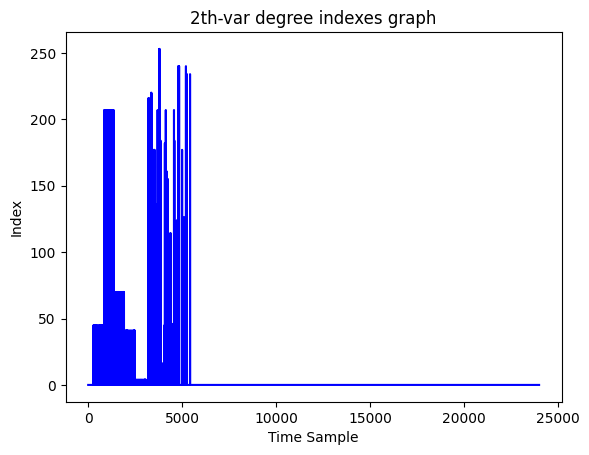

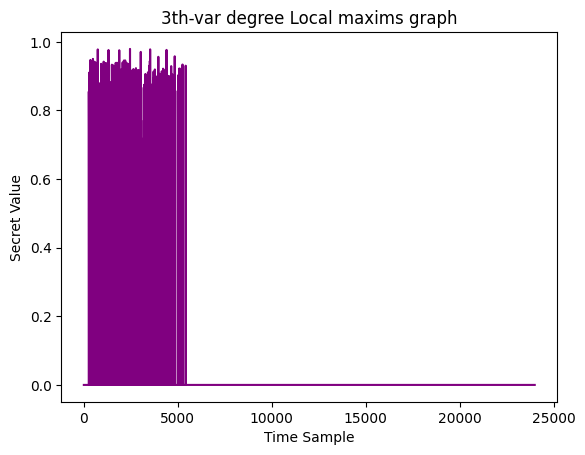

Number of uniques: 32
Number of local maxims: 462
Uniquess: [1, 45, 207, 70, 41, 4, 216, 220, 113, 177, 90, 136, 158, 101, 253, 184, 252, 16, 182, 161, 155, 78, 8, 114, 46, 14, 124, 240, 30, 126, 106, 234]
Local maxims: [1, 1, 1, 1, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 1, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 1, 1, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 70, 1, 1, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 41, 

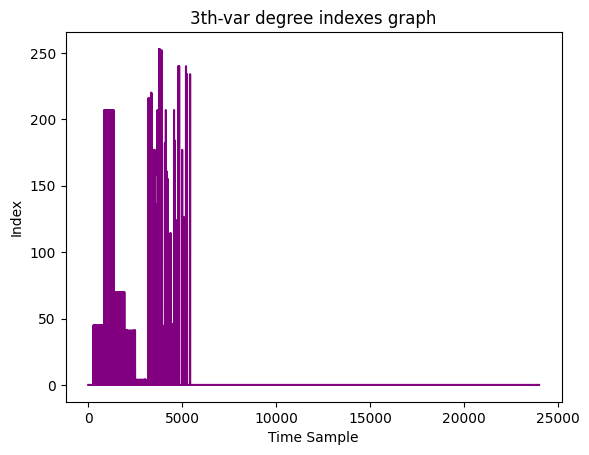

In range 0 - 24000
 Found the soonest secret value is 1, at the time sample 266, with correlation secret_corr = 0.848


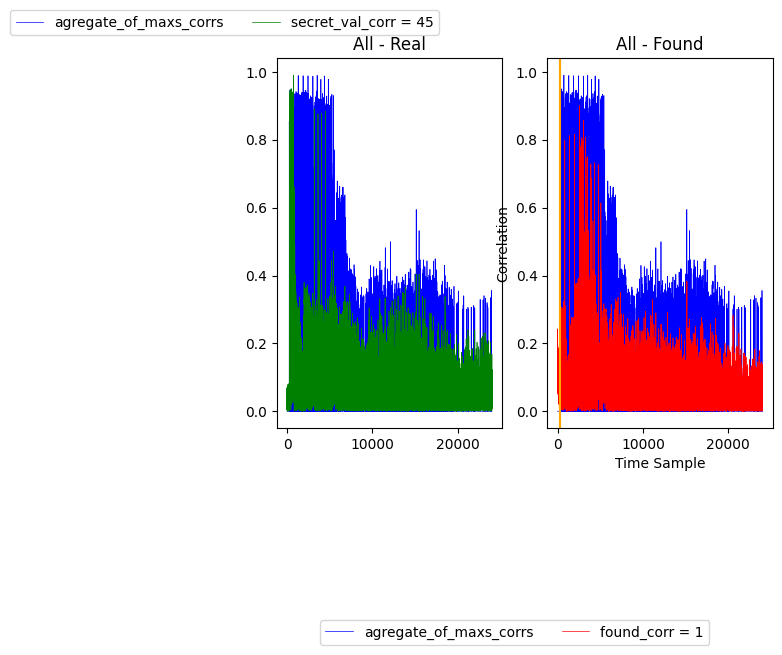

Hello 207
In range 275 - 24000
 Found the soonest secret value is 45, at the time sample 285, with correlation secret_corr = 0.910


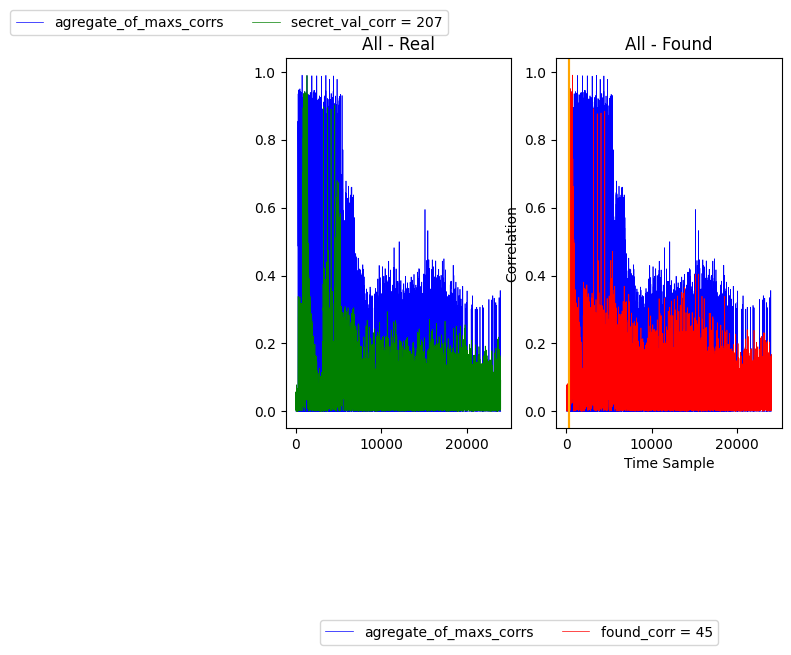

Hello 70
In range 293 - 24000
 Found the soonest secret value is 45, at the time sample 301, with correlation secret_corr = 0.836


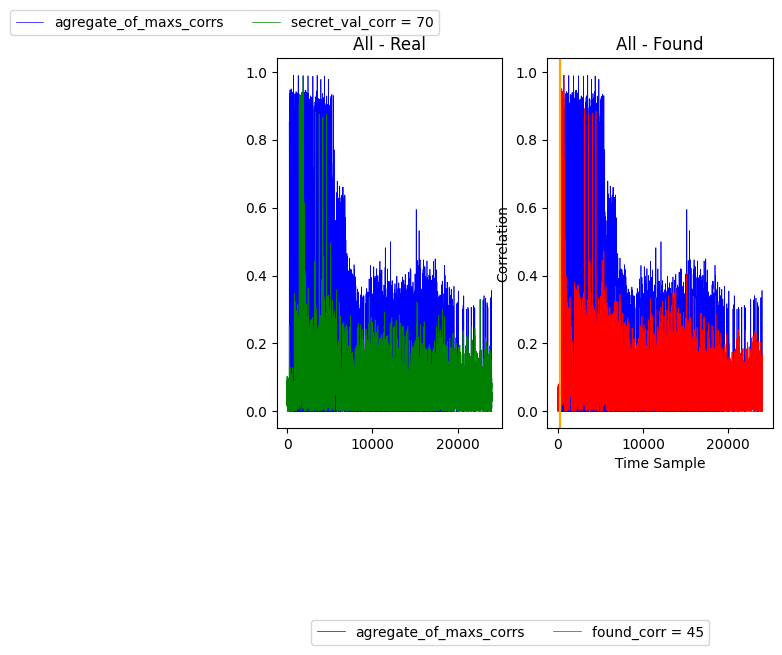

Hello 41
In range 326 - 24000
 Found the soonest secret value is 45, at the time sample 350, with correlation secret_corr = 0.947


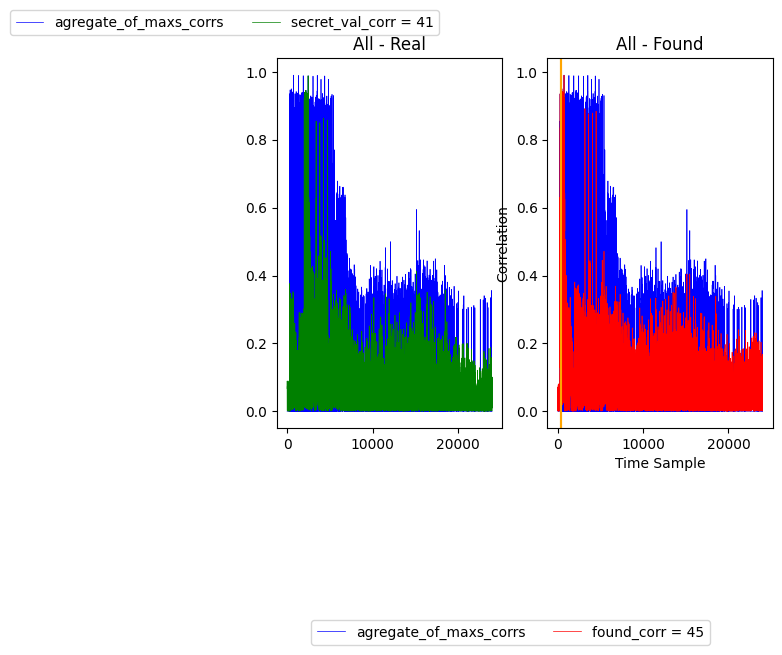

Hello 4
In range 359 - 24000
 Found the soonest secret value is 45, at the time sample 369, with correlation secret_corr = 0.795


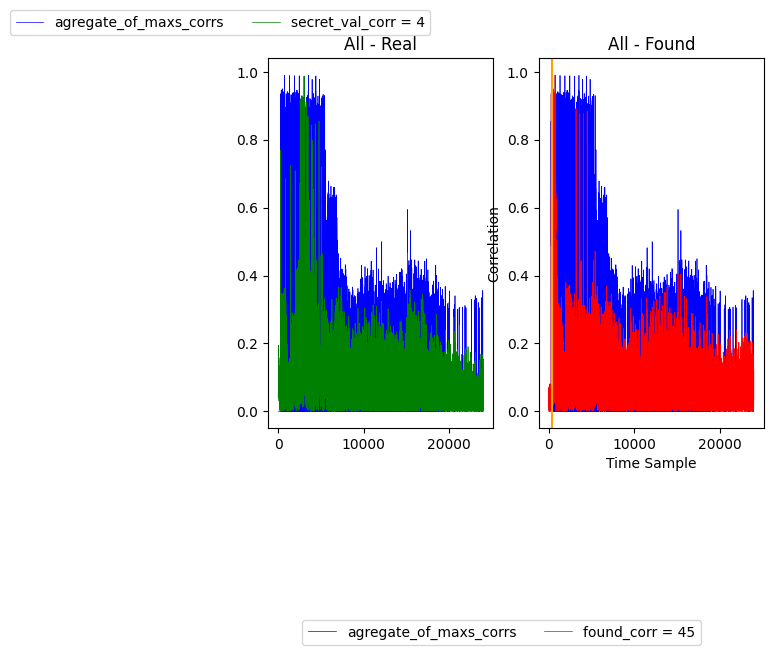

In [16]:
corr_map = abs(np.array(corr2_1000)[:,:])
analyse_corr(corr_map=corr_map, weights=np.array(out)[3:-4], stop_num = 5, maxims_map = None,
                 _index = 0, peak_range = 0.3, show_info=True, mountain_half_dist = 5, level = 3)

##### Abs int

In [17]:
np.array(out)[3:-4]

array([ 45, 207,  70,  41,   4,   0, 180, 120, 216, 104, 167,   0, 255,
        63,  43, 241, 252,   0, 217, 122, 150,   9,  44,   0, 165,  87,
       116, 100, 196,   0, 175,  21,  40, 164, 233,   0,  87, 219,  94,
        32, 251], dtype=uint8)

Hello 45
70
 Index of global max: 845 and global_max_val: 0.7212536293997215


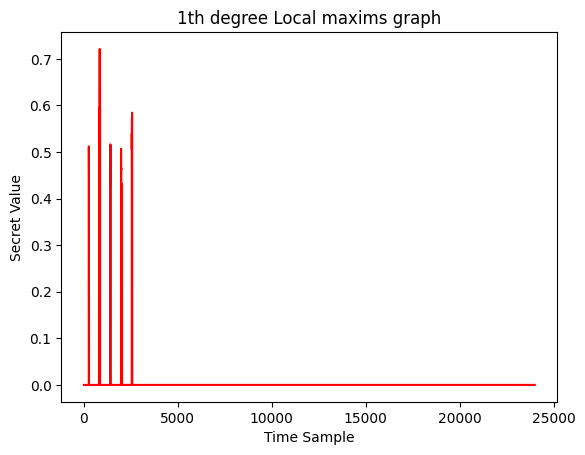

Number of uniques: 21
Number of local maxims: 44
Uniquess: [21, 105, 17, 47, 19, 5, 75, 87, 181, 13, 11, 15, 67, 139, 69, 25, 225, 79, 23, 9, 1]
Local maxims: [21, 105, 17, 47, 19, 5, 75, 5, 5, 87, 181, 13, 11, 15, 5, 5, 5, 47, 11, 5, 67, 19, 139, 69, 25, 5, 19, 47, 5, 225, 79, 17, 23, 5, 47, 9, 69, 5, 5, 5, 1, 13, 13, 17]


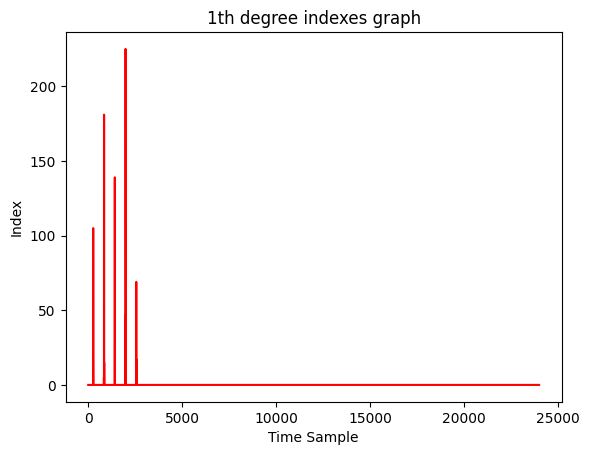

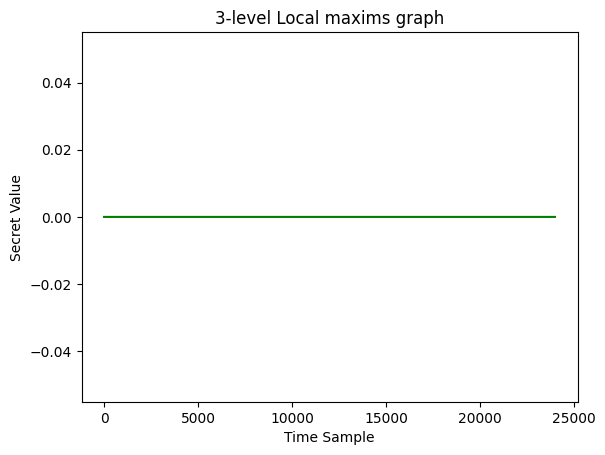

Number of uniques: 0
Number of local maxims: 0
Uniquess: []
Local maxims: []


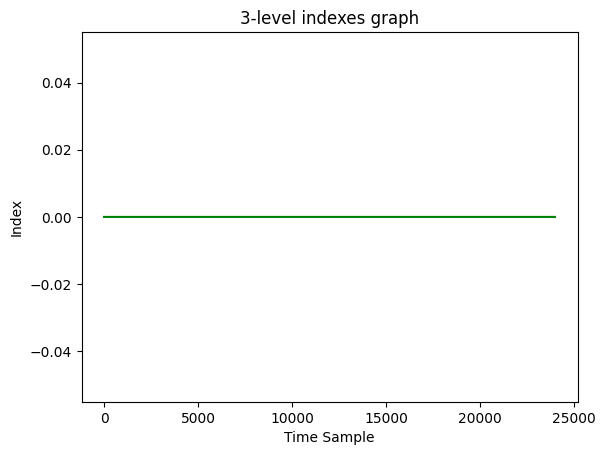

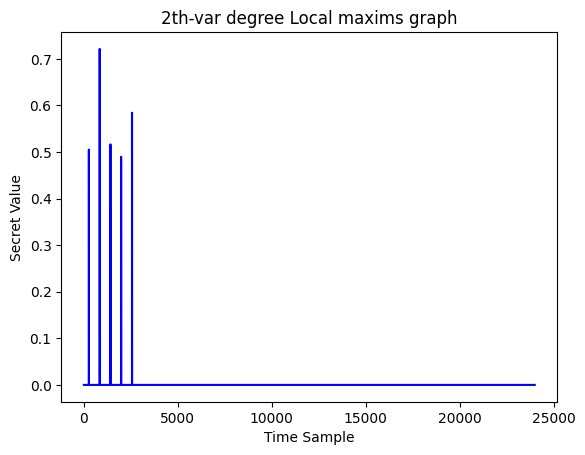

Number of uniques: 5
Number of local maxims: 5
Uniquess: [17, 181, 139, 47, 1]
Local maxims: [17, 181, 139, 47, 1]


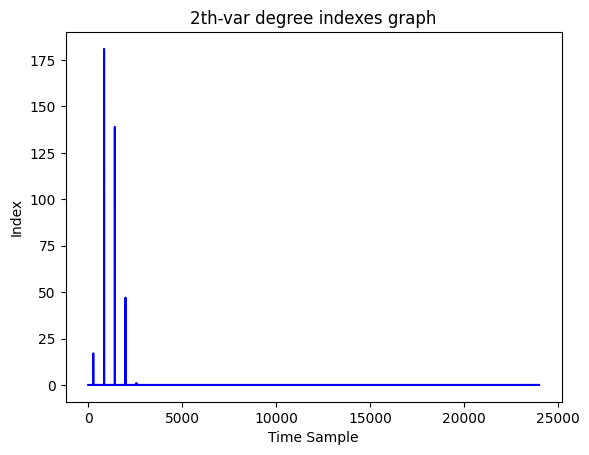

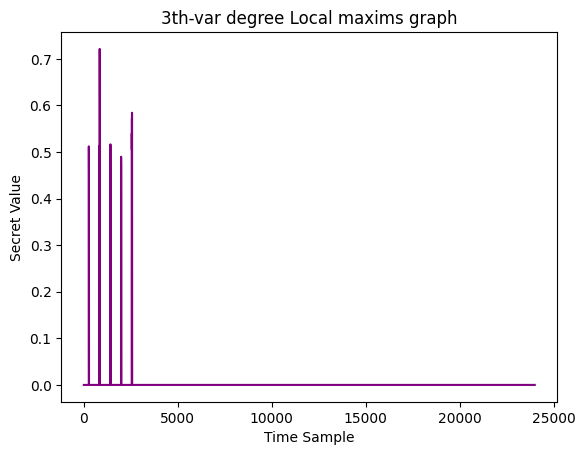

Number of uniques: 19
Number of local maxims: 30
Uniquess: [21, 17, 47, 19, 75, 5, 181, 13, 11, 15, 67, 139, 69, 25, 225, 79, 23, 9, 1]
Local maxims: [21, 17, 47, 19, 75, 5, 181, 13, 11, 15, 5, 5, 5, 5, 67, 139, 69, 25, 47, 225, 79, 23, 47, 9, 5, 5, 1, 13, 13, 17]


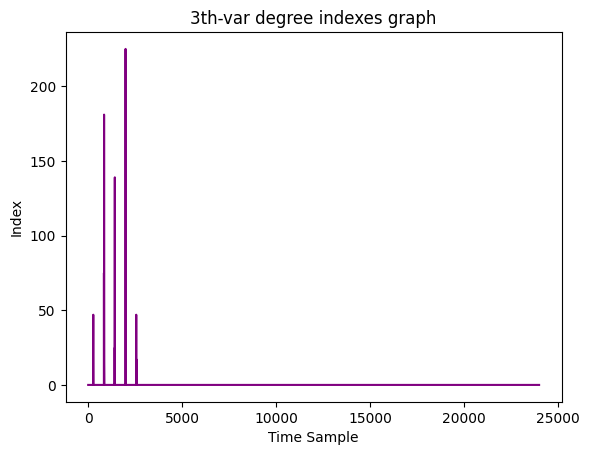

In range 0 - 24000
 Found the soonest secret value is 17, at the time sample 269, with correlation secret_corr = 0.505


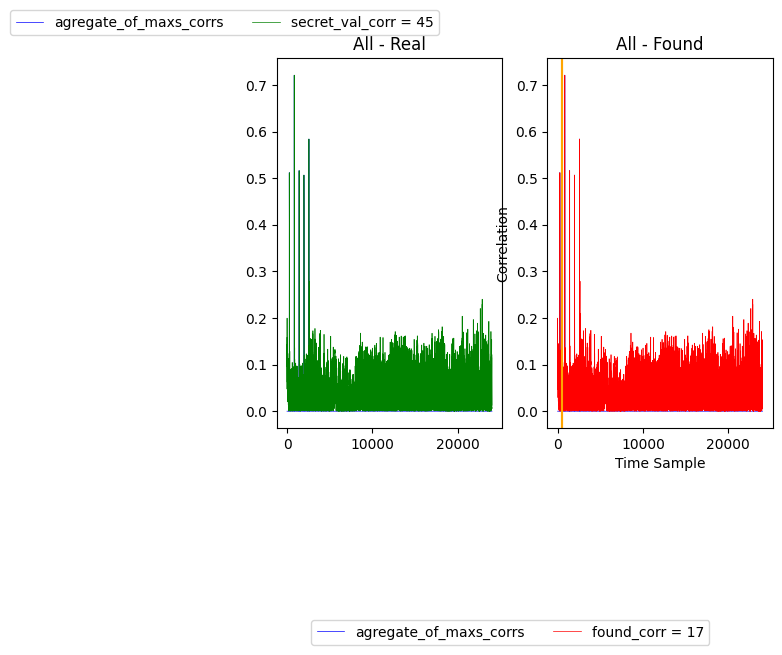

Hello 207
In range 557 - 24000
 Found the soonest secret value is 181, at the time sample 845, with correlation secret_corr = 0.721


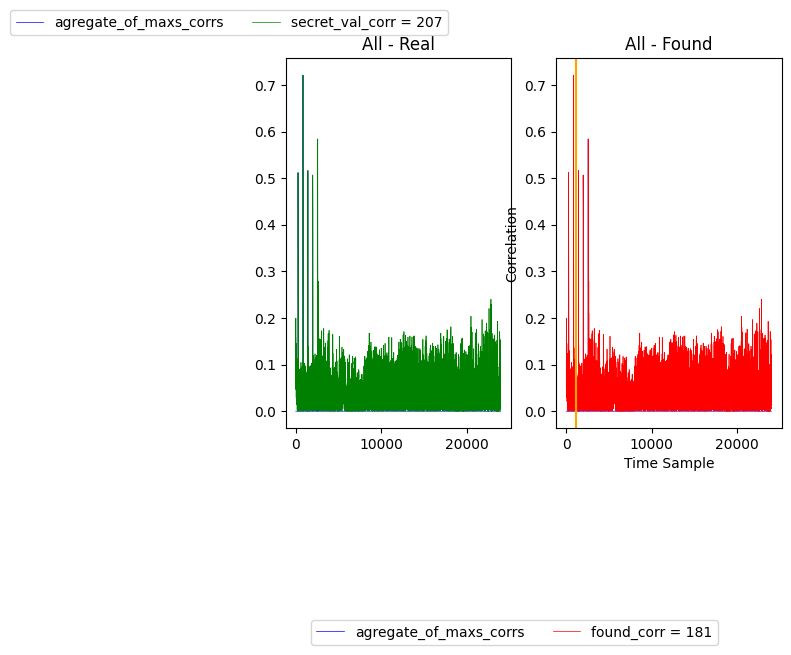

Hello 70
In range 1131 - 24000
 Found the soonest secret value is 139, at the time sample 1417, with correlation secret_corr = 0.516


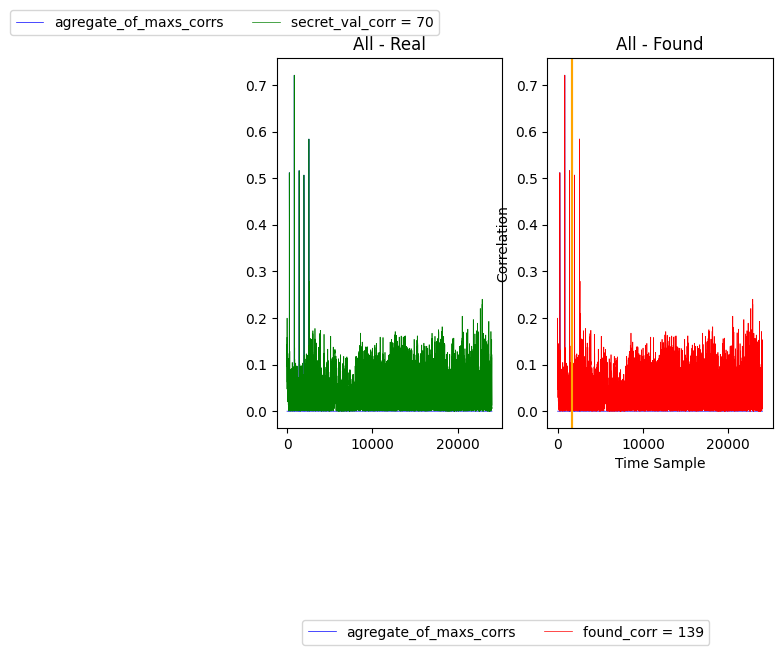

Hello 41
In range 1701 - 24000
 Found the soonest secret value is 47, at the time sample 1985, with correlation secret_corr = 0.490


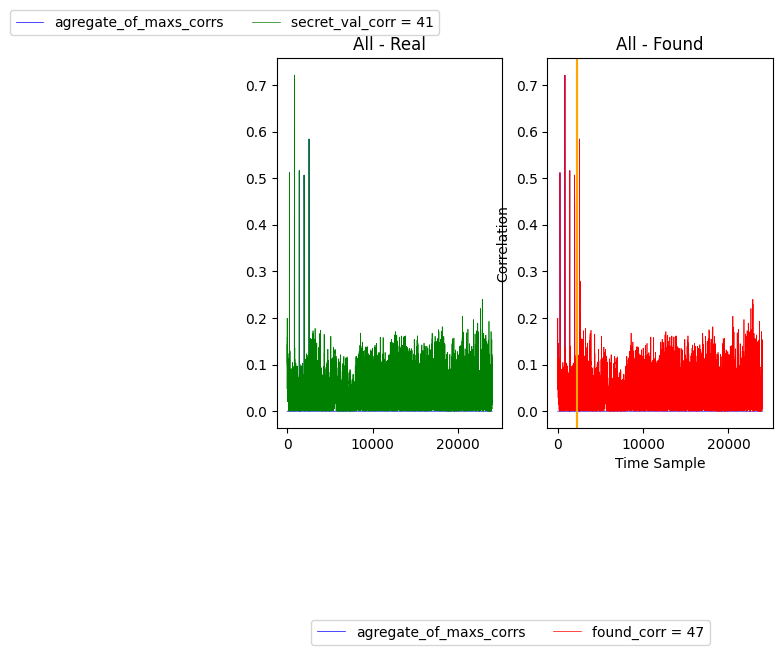

Hello 4
In range 2275 - 24000
 Found the soonest secret value is 1, at the time sample 2565, with correlation secret_corr = 0.584


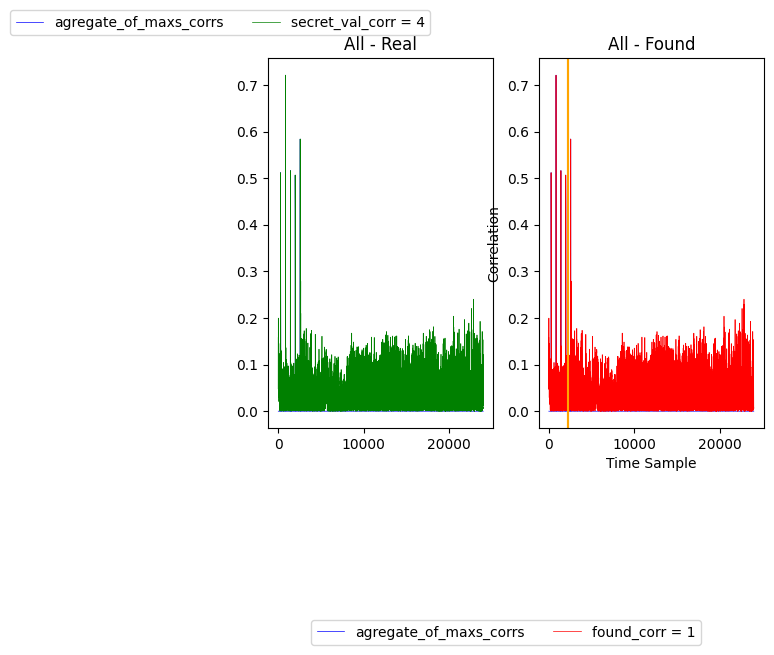

In [18]:
corr_map = abs(np.array(corr3_1000)[:,:])
analyse_corr(corr_map=corr_map, weights=np.array(out)[3:-4], stop_num = 5, maxims_map = None,
                 _index = 0, peak_range = 0.3, show_info=True, mountain_half_dist = 5, level = 3)

##### Abs char

In [19]:
np.array(out)[3:-4]

array([ 45, 207,  70,  41,   4,   0, 180, 120, 216, 104, 167,   0, 255,
        63,  43, 241, 252,   0, 217, 122, 150,   9,  44,   0, 165,  87,
       116, 100, 196,   0, 175,  21,  40, 164, 233,   0,  87, 219,  94,
        32, 251], dtype=uint8)

Hello 45
8248
 Index of global max: 4337 and global_max_val: 0.8440165660072018


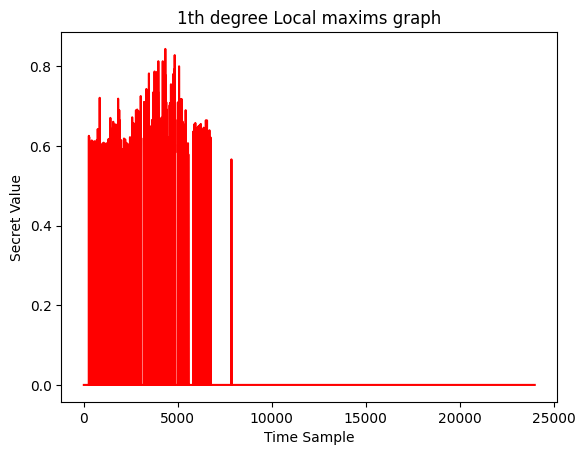

Number of uniques: 76
Number of local maxims: 889
Uniquess: [4, 104, 45, 90, 160, 180, 1, 120, 158, 207, 60, 224, 255, 140, 24, 70, 48, 192, 72, 41, 164, 82, 32, 2, 8, 16, 216, 176, 112, 220, 113, 196, 177, 98, 128, 136, 148, 202, 101, 253, 244, 6, 215, 184, 252, 211, 182, 108, 161, 132, 66, 232, 54, 56, 156, 228, 114, 200, 64, 46, 49, 14, 28, 248, 240, 124, 79, 30, 126, 168, 212, 106, 80, 234, 44, 22]
Local maxims: [4, 4, 104, 104, 104, 104, 45, 45, 90, 90, 104, 104, 45, 160, 104, 104, 104, 45, 45, 180, 45, 180, 180, 180, 90, 180, 45, 45, 104, 104, 104, 104, 104, 104, 104, 45, 45, 45, 45, 45, 4, 4, 1, 1, 1, 1, 1, 120, 158, 120, 120, 158, 158, 120, 120, 120, 158, 158, 158, 158, 158, 207, 158, 60, 60, 60, 158, 158, 158, 158, 158, 120, 120, 120, 120, 158, 158, 60, 158, 207, 207, 207, 224, 224, 4, 4, 4, 255, 255, 140, 140, 24, 70, 70, 70, 70, 70, 70, 70, 70, 70, 48, 70, 70, 70, 70, 70, 70, 24, 24, 24, 24, 70, 24, 24, 24, 24, 24, 24, 24, 70, 24, 70, 70, 70, 48, 48, 24, 24, 24, 140, 24, 70,

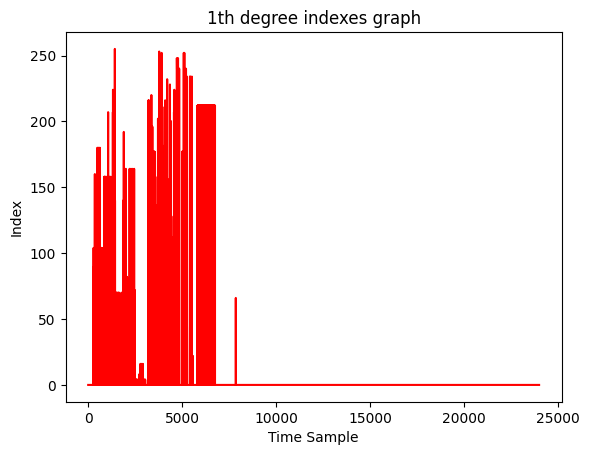

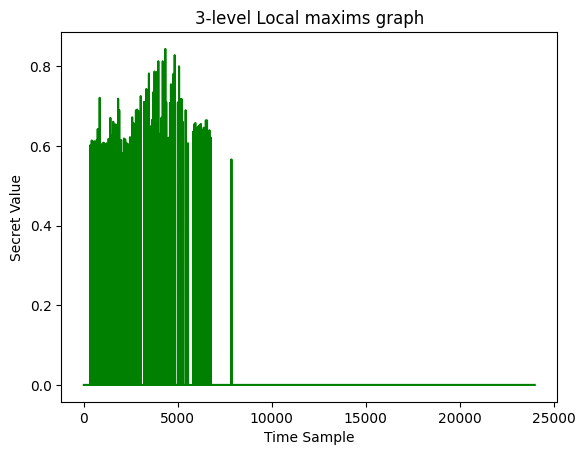

Number of uniques: 33
Number of local maxims: 92
Uniquess: [104, 45, 180, 1, 158, 60, 120, 224, 4, 70, 24, 82, 41, 164, 72, 8, 216, 177, 128, 6, 112, 16, 182, 56, 200, 46, 240, 79, 228, 234, 22, 212, 66]
Local maxims: [104, 45, 180, 180, 45, 104, 45, 1, 158, 158, 158, 60, 158, 120, 224, 4, 70, 70, 24, 24, 24, 70, 70, 4, 82, 41, 82, 164, 82, 72, 41, 72, 4, 4, 4, 8, 8, 8, 4, 4, 216, 158, 24, 82, 8, 177, 128, 158, 24, 6, 112, 8, 16, 182, 158, 24, 56, 8, 200, 128, 46, 112, 24, 41, 8, 240, 79, 16, 228, 240, 234, 234, 234, 22, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 212, 66]


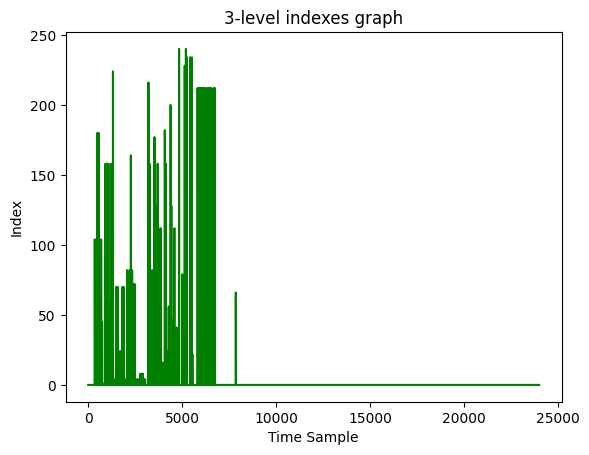

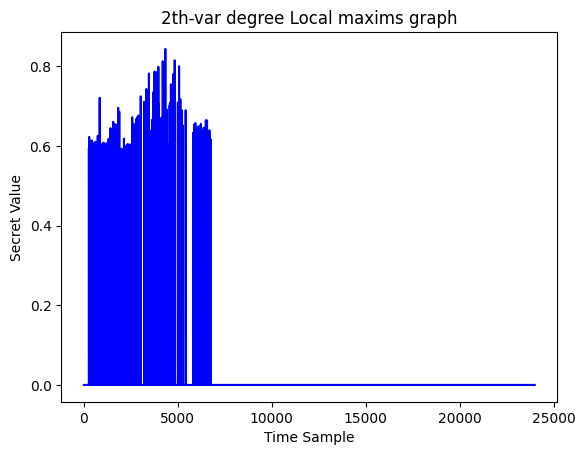

Number of uniques: 49
Number of local maxims: 149
Uniquess: [4, 104, 45, 180, 1, 120, 158, 60, 224, 24, 70, 140, 164, 82, 41, 72, 16, 8, 216, 112, 220, 113, 177, 98, 128, 148, 202, 101, 244, 211, 108, 66, 132, 54, 56, 200, 46, 14, 28, 124, 240, 79, 30, 126, 228, 212, 106, 44, 234]
Local maxims: [4, 104, 45, 104, 45, 45, 180, 45, 104, 104, 45, 1, 120, 158, 158, 60, 158, 120, 158, 224, 4, 24, 70, 70, 70, 24, 24, 70, 70, 140, 70, 4, 164, 82, 41, 164, 164, 82, 72, 164, 41, 72, 4, 4, 4, 16, 16, 8, 4, 4, 4, 216, 216, 158, 24, 112, 220, 82, 113, 8, 177, 98, 177, 128, 16, 128, 158, 148, 202, 101, 24, 244, 164, 112, 112, 8, 16, 16, 211, 108, 216, 158, 66, 132, 24, 54, 41, 56, 8, 200, 200, 200, 45, 112, 46, 158, 112, 24, 14, 28, 41, 124, 8, 240, 240, 79, 30, 30, 16, 126, 126, 228, 212, 212, 106, 224, 44, 234, 212, 212, 212, 212, 212, 212, 44, 212, 44, 212, 44, 212, 212, 44, 212, 212, 212, 212, 212, 212, 212, 212, 212, 44, 212, 212, 212, 212, 212, 212, 212]


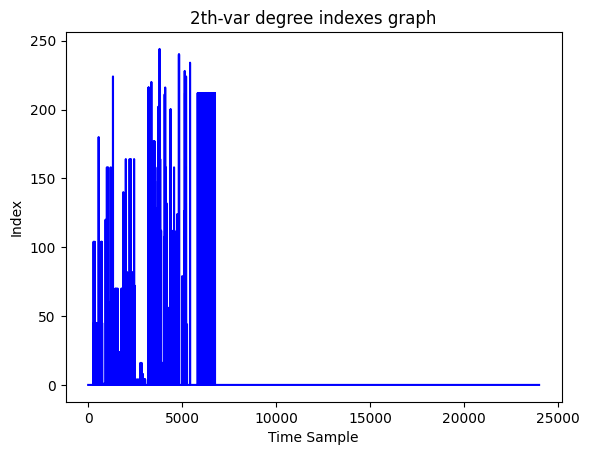

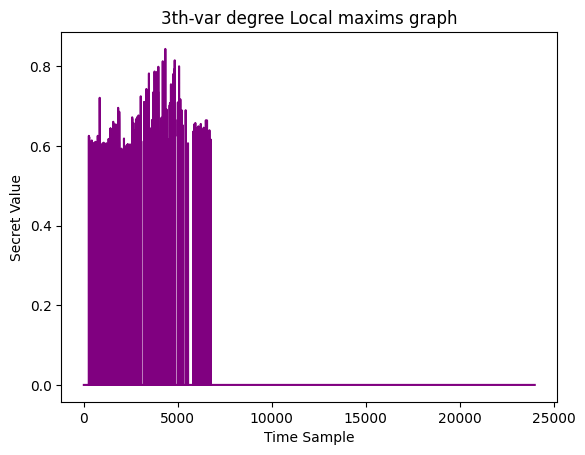

Number of uniques: 70
Number of local maxims: 575
Uniquess: [4, 104, 45, 90, 160, 180, 1, 120, 158, 207, 60, 224, 255, 24, 70, 48, 140, 192, 164, 82, 41, 72, 32, 2, 8, 16, 216, 176, 112, 220, 113, 196, 177, 98, 128, 148, 202, 101, 253, 244, 184, 252, 211, 108, 66, 132, 161, 232, 54, 56, 114, 200, 64, 46, 49, 14, 28, 248, 240, 124, 79, 30, 126, 228, 212, 106, 80, 44, 234, 22]
Local maxims: [4, 4, 104, 104, 45, 90, 104, 104, 45, 160, 104, 45, 45, 45, 180, 180, 45, 45, 104, 104, 104, 104, 45, 45, 45, 45, 1, 1, 1, 1, 120, 120, 120, 158, 120, 158, 158, 158, 158, 207, 60, 60, 158, 158, 158, 120, 120, 158, 158, 207, 224, 224, 4, 4, 255, 255, 24, 70, 70, 70, 70, 70, 70, 70, 70, 70, 24, 24, 24, 24, 70, 24, 24, 24, 70, 24, 70, 70, 48, 48, 24, 24, 140, 24, 70, 70, 70, 70, 192, 192, 192, 192, 4, 164, 82, 82, 41, 41, 72, 41, 41, 164, 41, 41, 164, 164, 82, 164, 82, 72, 32, 164, 164, 41, 41, 41, 72, 4, 2, 4, 4, 4, 4, 4, 4, 4, 4, 8, 16, 16, 16, 8, 16, 16, 8, 8, 8, 4, 4, 4, 4, 4, 45, 45, 104, 216, 176,

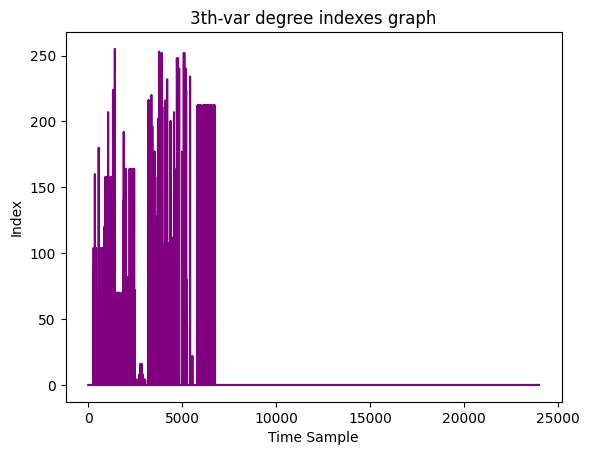

In range 0 - 24000
 Found the soonest secret value is 4, at the time sample 270, with correlation secret_corr = 0.594


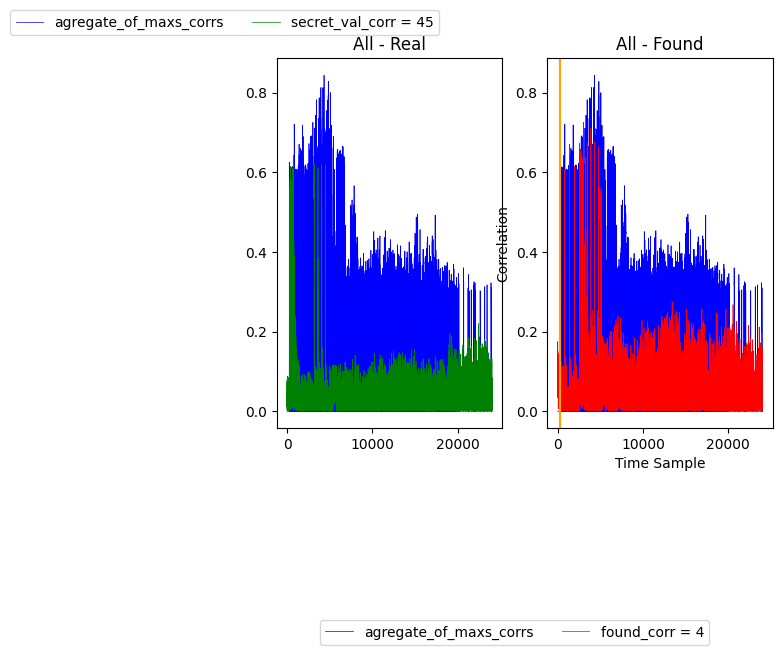

Hello 207
In range 278 - 24000
 Found the soonest secret value is 104, at the time sample 286, with correlation secret_corr = 0.623


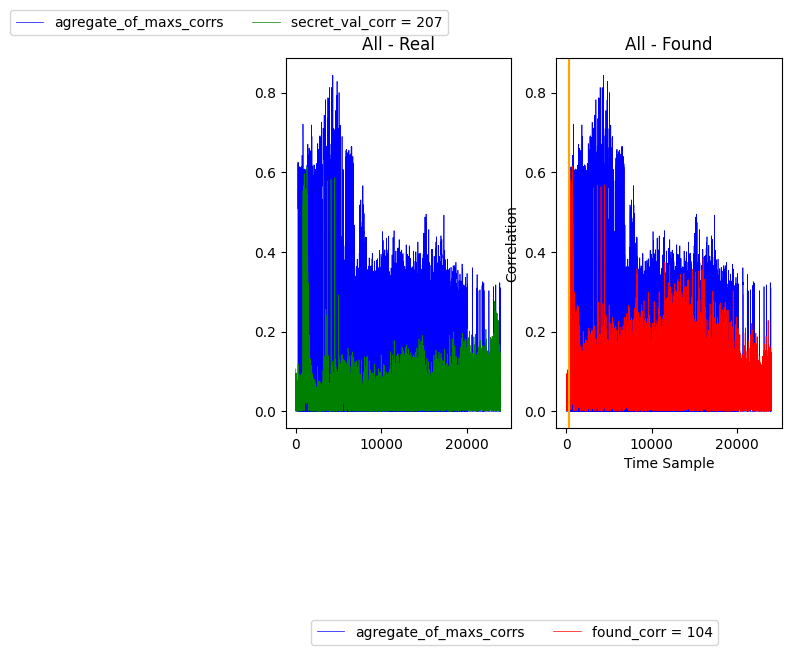

Hello 70
In range 293 - 24000
 Found the soonest secret value is 45, at the time sample 301, with correlation secret_corr = 0.558


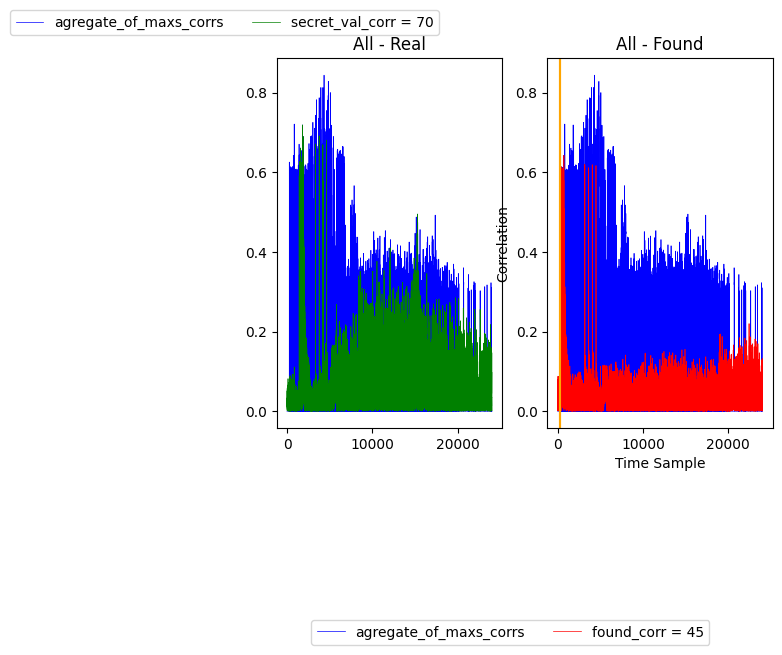

Hello 41
In range 326 - 24000
 Found the soonest secret value is 104, at the time sample 350, with correlation secret_corr = 0.603


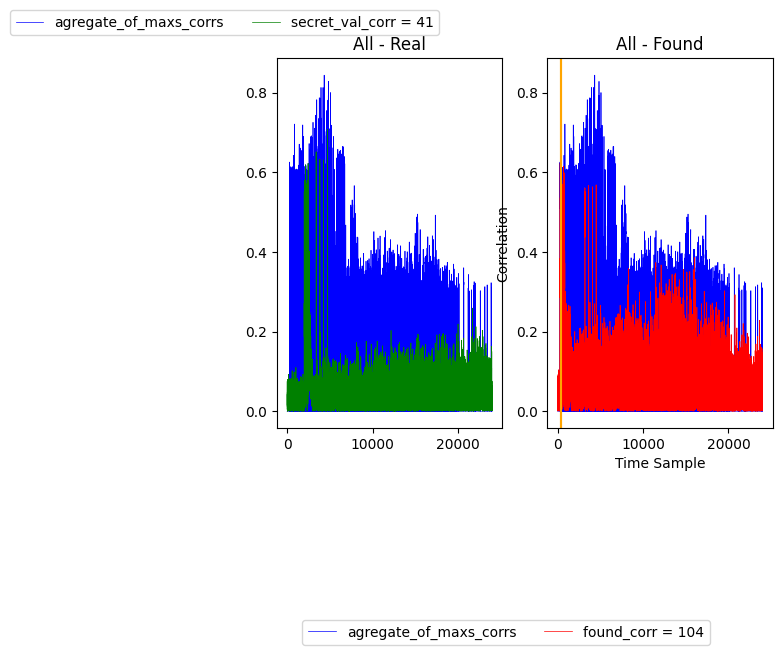

Hello 4
In range 386 - 24000
 Found the soonest secret value is 45, at the time sample 422, with correlation secret_corr = 0.614


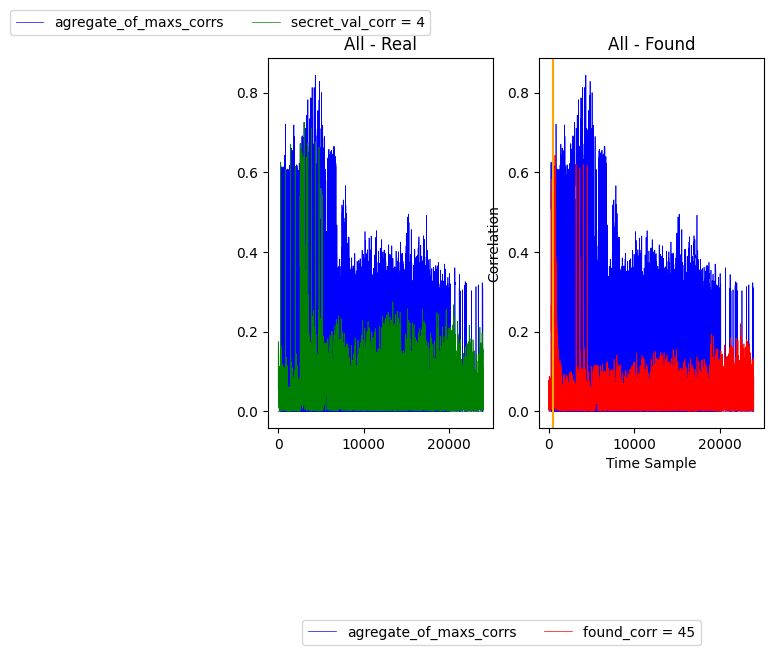

In [20]:
corr_map = abs(np.array(corr4_1000)[:,:])
analyse_corr(corr_map=corr_map, weights=np.array(out)[3:-4], stop_num = 5, maxims_map = None,
                 _index = 0, peak_range = 0.3, show_info=True, mountain_half_dist = 5, level = 3)

### QUANTIZATED_Basic ANN CPA, and turned off optimalization while building, 1000 traces

In [21]:
scope, target, cw_setuper = setup("makefile_dir_basic_quantized2_MLP-NO_OPT-Rand")
time.sleep(10)

⚠️ Changed, firmware config!!!
✔️ Firmware maked, with command cd %s | make CRYPTO_TARGET=%s PLATFORM=%s FIRMWAREPATH=%s SS_VER=%s TARGET=%s> output.txt 2>warnings_new.txt.
INFO: Found ChipWhisperer😍
✔️ INFO: Scope and Target, are set😍
❤️ Target hex: ./makefile_dir_basic_quantized2_MLP-NO_OPT-Rand/simpleserial-target-CWLITEARM.hex
Detected known STMF32: STM32F302xB(C)/303xB(C)
Extended erase (0x44), this can take ten seconds or more
Attempting to program 22715 bytes at 0x8000000
STM32F Programming flash...
STM32F Reading flash...
Verified flash OK, 22715 bytes
✔️ Setuper initiated.


Capturing and Analysing the traces::   0%|          | 0/1 [00:00<?, ?it/s]

⚠️ Generating rand_input..


                                Capturing traces:   0%|          | 0/1000 [00:00<?, ?it/s]

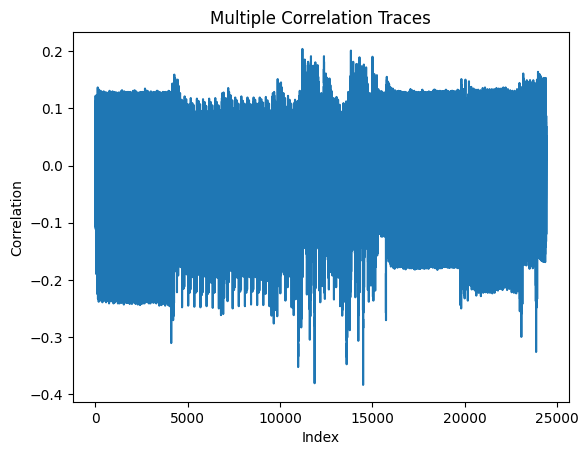

✔️ Saving Rand_input succesfull.
🌍 Saving Secret_weights succesfull.
CWbytearray(b'00 72 16 2d 46 04 78 68 ff 2b 00 cf 29 b4 d8 a7 3f f1 00 00 00 00 00 f0 00 ba 00')


Calculating Correlations for the Secret-Key:   0%|          | 0/256 [00:00<?, ?it/s]

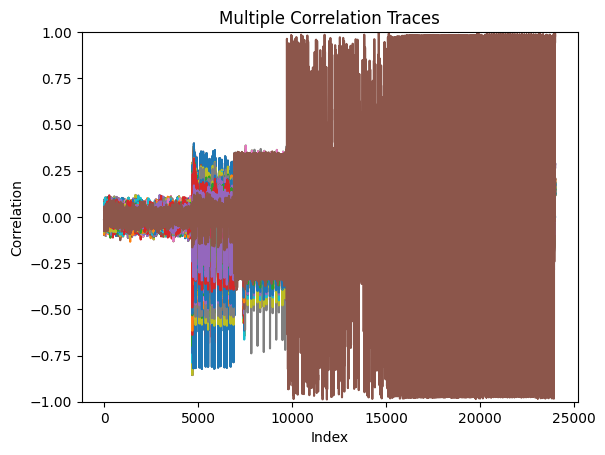

Calculating Correlations for the Secret-Key:   0%|          | 0/256 [00:00<?, ?it/s]

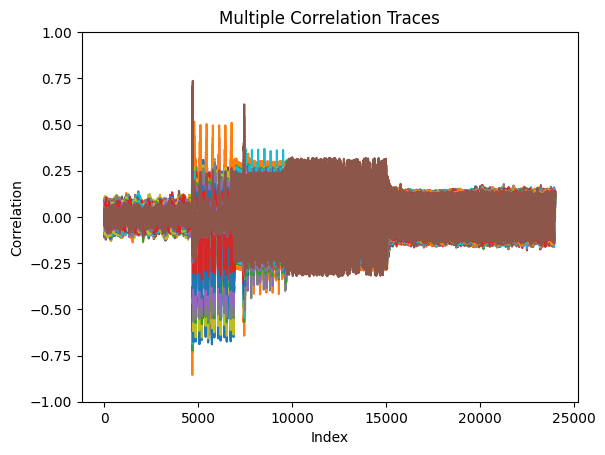

Calculating Correlations for the Secret-Key:   0%|          | 0/256 [00:00<?, ?it/s]

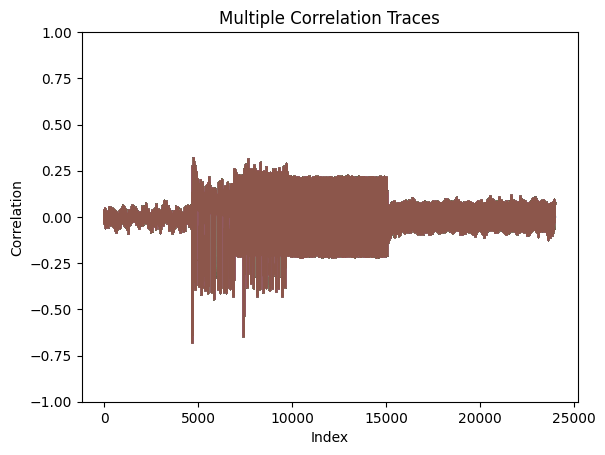

Calculating Correlations for the Secret-Key:   0%|          | 0/256 [00:00<?, ?it/s]

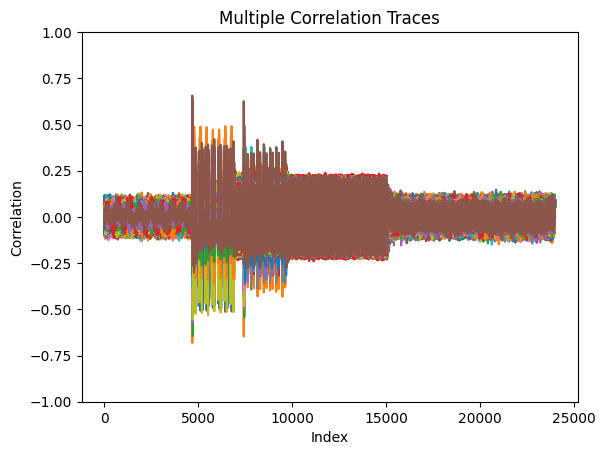

✔️ Scope disconnected.
✔️ Firmware disconnected.


In [22]:
corr1_1000, corr2_1000, corr3_1000, corr4_1000, rand_input, waves, out = capture_correlate(scope, epochs_list = [1000], ncorr_all1 = None, ncorr_all2 = None, decimate = 1, reverse = False, runName="_722_BasicMLP")

#### SPA

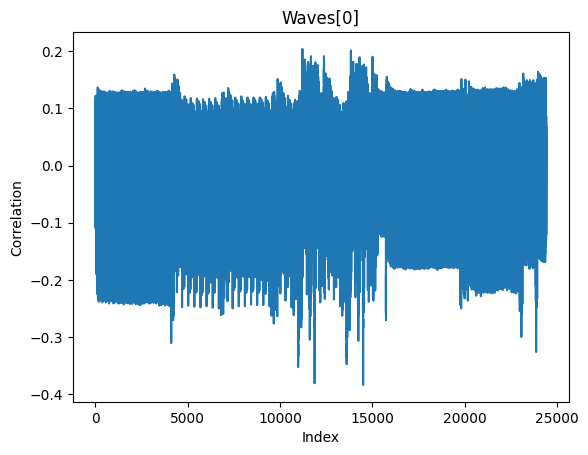

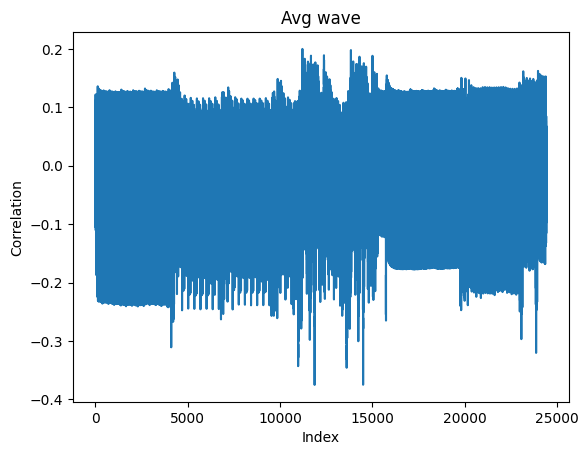

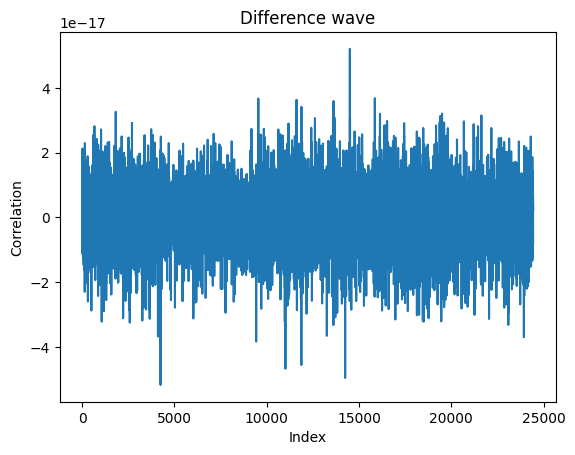

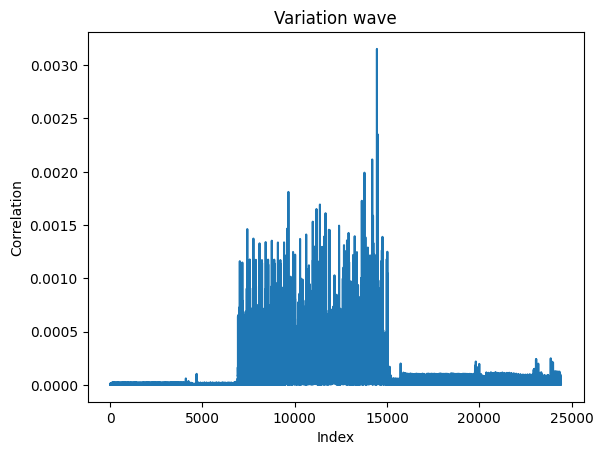

In [23]:
diff_avg, avg_wave, var, ____ = createDiffWave(waves, "1000_722")

#### Additional analysis (CPA get weight)

##### HW(int)

In [30]:
np.array(out)[3:-4]

array([ 45,  70,   4, 120, 104, 255,  43,   0, 207,  41, 180, 216, 167,
        63, 241,   0,   0,   0,   0,   0], dtype=uint8)

Hello 45
14100
 Index of global max: 14613 and global_max_val: 0.9966668252655273


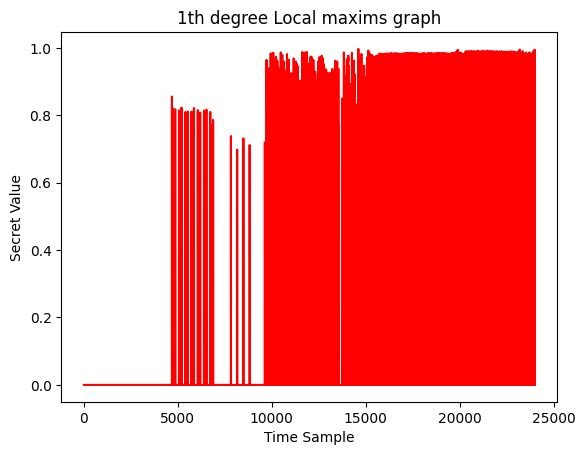

Number of uniques: 5
Number of local maxims: 4466
Uniquess: [1, 129, 45, 207, 255]
Local maxims: [1, 1, 129, 129, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 207, 207, 207, 207, 207, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,

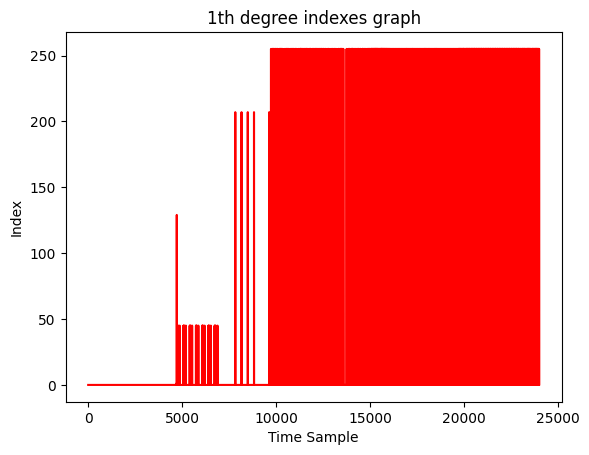

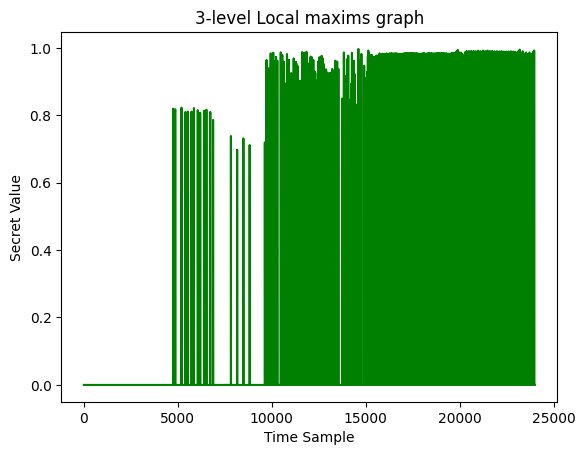

Number of uniques: 3
Number of local maxims: 312
Uniquess: [45, 207, 255]
Local maxims: [45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 207, 207, 207, 207, 207, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 

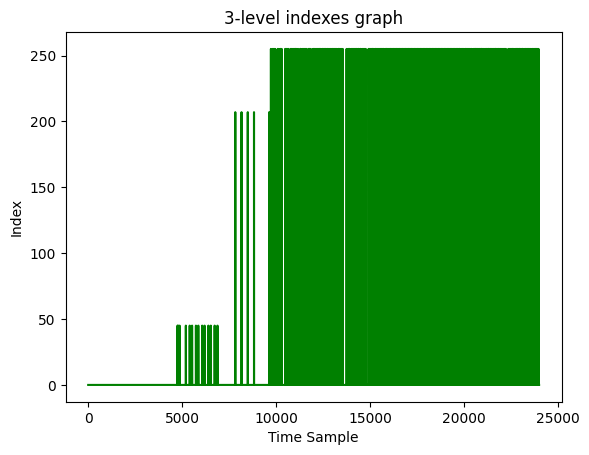

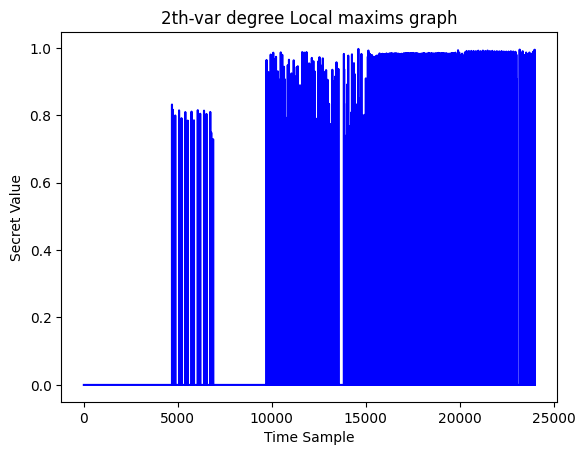

Number of uniques: 4
Number of local maxims: 515
Uniquess: [1, 129, 45, 255]
Local maxims: [1, 129, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255

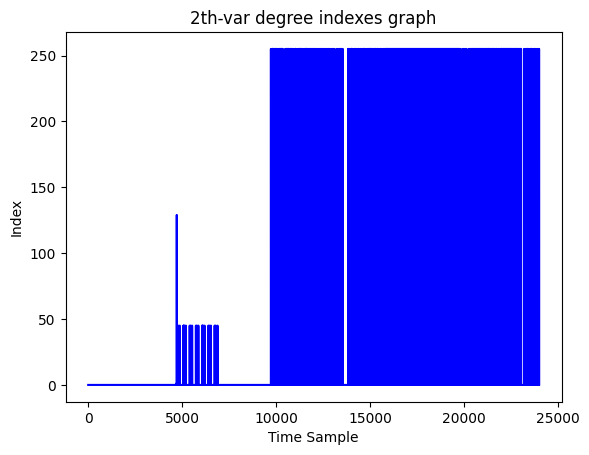

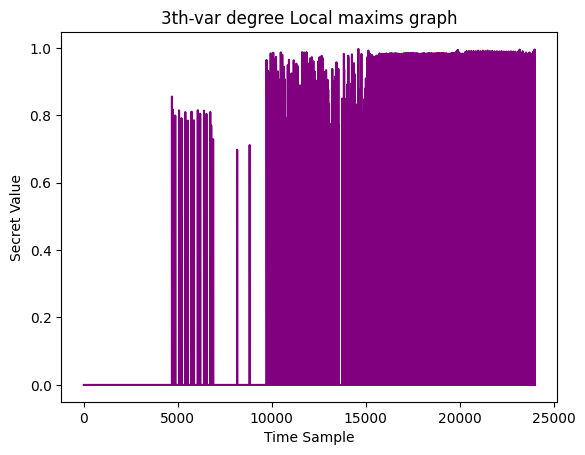

Number of uniques: 5
Number of local maxims: 3123
Uniquess: [1, 129, 45, 207, 255]
Local maxims: [1, 1, 129, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 207, 207, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 2

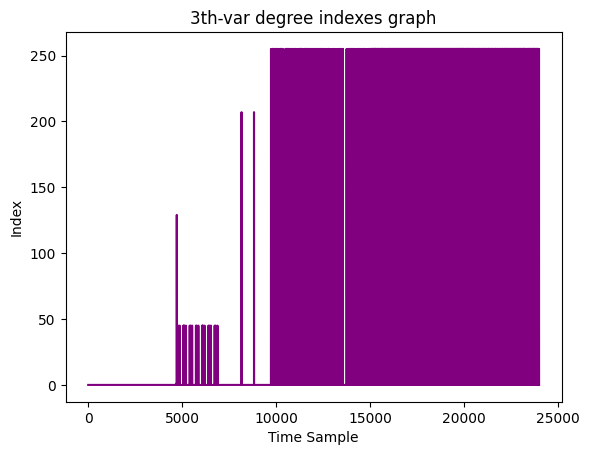

In range 0 - 24000
 Found the soonest secret value is 1, at the time sample 4692, with correlation secret_corr = 0.832


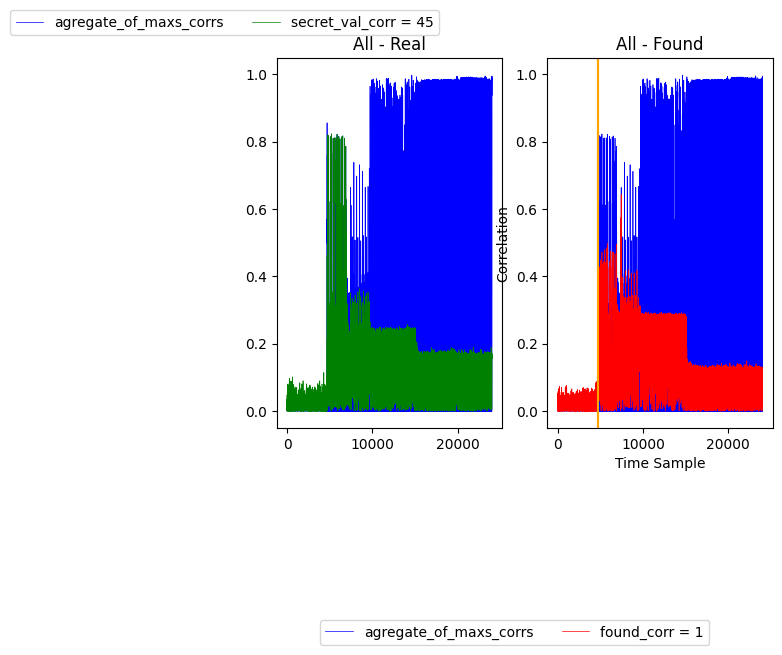

Hello 70
In range 4703 - 24000
 Found the soonest secret value is 129, at the time sample 4714, with correlation secret_corr = 0.748


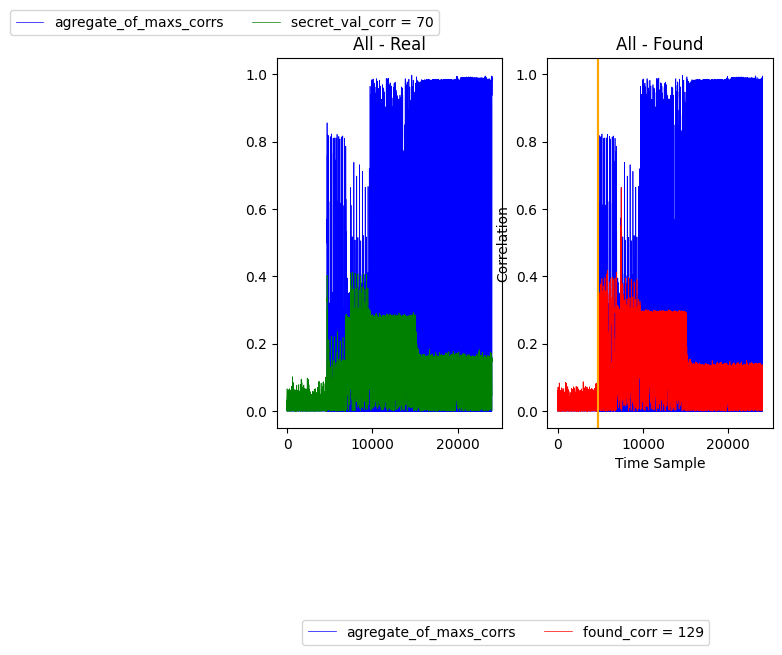

Hello 4
In range 4725 - 24000
 Found the soonest secret value is 45, at the time sample 4737, with correlation secret_corr = 0.816


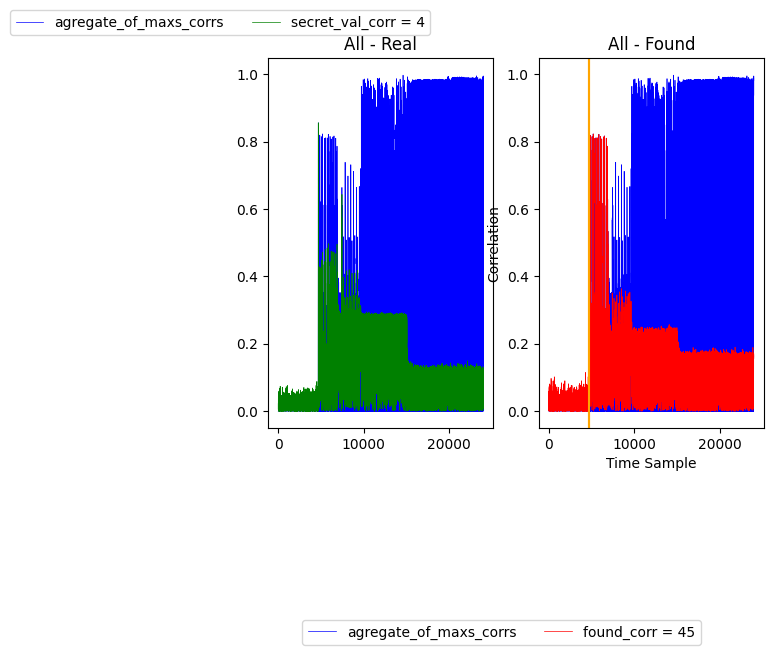

Hello 120
In range 4764 - 24000
 Found the soonest secret value is 45, at the time sample 4790, with correlation secret_corr = 0.726


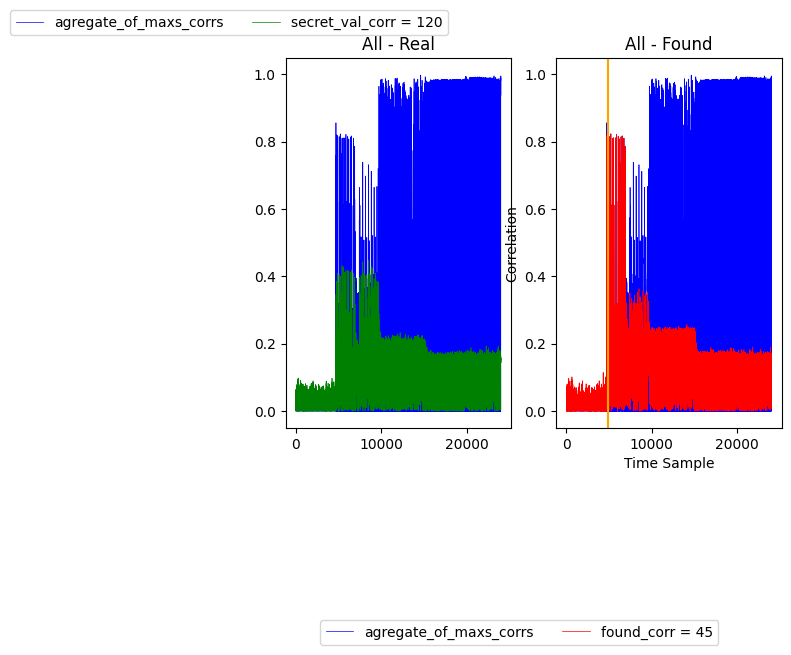

Hello 104
In range 4828 - 24000
 Found the soonest secret value is 45, at the time sample 4866, with correlation secret_corr = 0.799


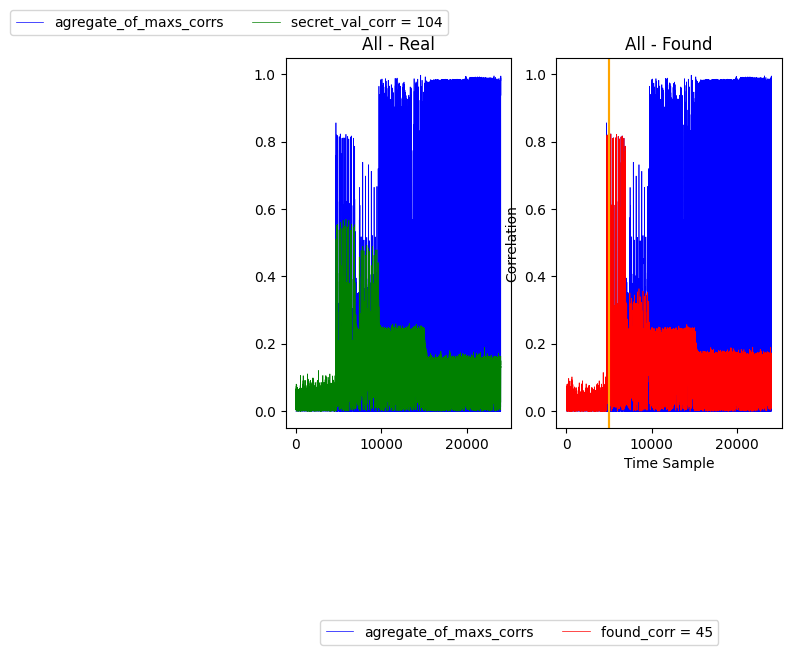

In [31]:
corr_map = abs(np.array(corr1_1000)[:,:])
analyse_corr(corr_map=corr_map, weights=np.array(out)[3:-4], stop_num = 5, maxims_map = None,
                 _index = 0, peak_range = 0.3, show_info=True, mountain_half_dist = 5, level = 3)

##### HW(unsigned char)

In [28]:
np.array(out)[3:-4]

array([ 45,  70,   4, 120, 104, 255,  43,   0, 207,  41, 180, 216, 167,
        63, 241,   0,   0,   0,   0,   0], dtype=uint8)

Hello 45
Peak range: 0.6
24000
 Index of global max: 4690 and global_max_val: 0.8509640762240381


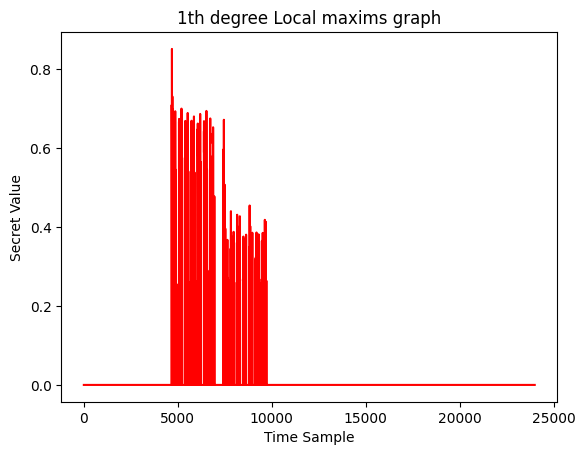

Number of uniques: 21
Number of local maxims: 524
Uniquess: [255, 1, 127, 104, 180, 90, 45, 211, 208, 160, 173, 128, 244, 3, 158, 252, 207, 49, 240, 60, 224]
Local maxims: [255, 255, 255, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 255, 255, 255, 255, 127, 104, 104, 180, 180, 180, 90, 90, 45, 90, 45, 180, 180, 45, 45, 45, 211, 45, 45, 45, 45, 45, 45, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 211, 211, 211, 211, 211, 211, 211, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 208, 208, 208, 180, 90, 90, 90, 180, 180, 1, 160, 160, 160, 160, 45, 208, 208, 180, 180, 90, 90, 90, 90, 90, 180, 180, 180, 45, 45, 45, 45, 45, 45, 45, 45, 45, 211, 211, 211, 211, 211, 211, 208, 208, 208, 180, 90, 90, 180, 90, 160, 160, 160, 160, 160, 208, 208, 208, 180, 180, 90, 180, 90, 90, 90, 180, 180, 180, 45, 211, 45, 45, 45, 45, 45, 45, 45, 211, 211, 211, 211, 211, 211, 45, 208, 208, 180, 90, 90, 180, 90, 90, 160, 160, 160, 160, 160, 160, 45, 208, 208, 208, 180, 180, 90, 90, 90, 90, 90, 90, 180, 90, 180, 45, 

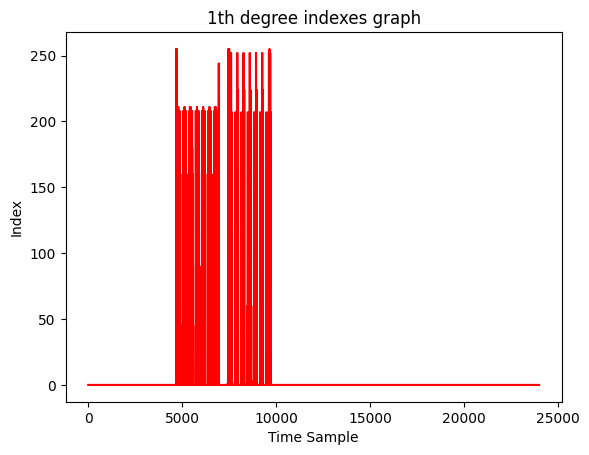

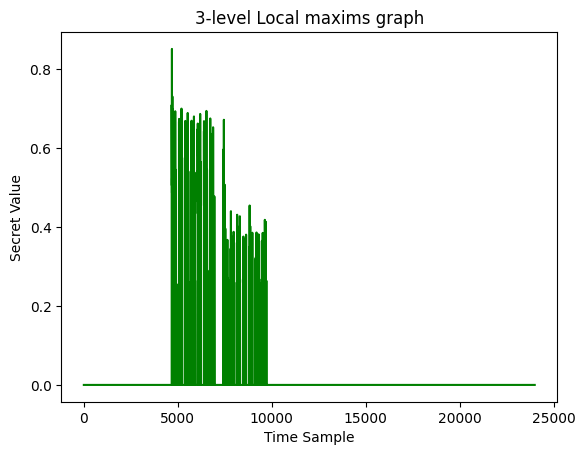

Number of uniques: 22
Number of local maxims: 662
Uniquess: [255, 1, 127, 104, 180, 90, 45, 211, 208, 160, 173, 128, 244, 3, 158, 252, 207, 49, 240, 60, 224, 13]
Local maxims: [255, 255, 255, 255, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 255, 255, 255, 255, 255, 127, 104, 104, 104, 104, 180, 180, 180, 180, 180, 90, 90, 90, 45, 90, 45, 180, 180, 45, 45, 45, 211, 45, 45, 45, 45, 45, 45, 45, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 211, 211, 211, 211, 211, 211, 211, 211, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 208, 208, 208, 208, 180, 90, 90, 90, 180, 180, 1, 1, 160, 160, 160, 160, 160, 160, 45, 208, 208, 208, 208, 180, 180, 180, 180, 90, 90, 90, 90, 90, 90, 90, 90, 180, 180, 180, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 211, 211, 211, 211, 211, 211, 211, 208, 208, 208, 208, 180, 90, 90, 90, 180, 90, 160, 160, 160, 160, 160, 160, 208, 208, 208, 208, 180, 180, 180, 180, 90, 90, 180, 90, 90, 90, 90, 90, 180, 180, 180, 45, 

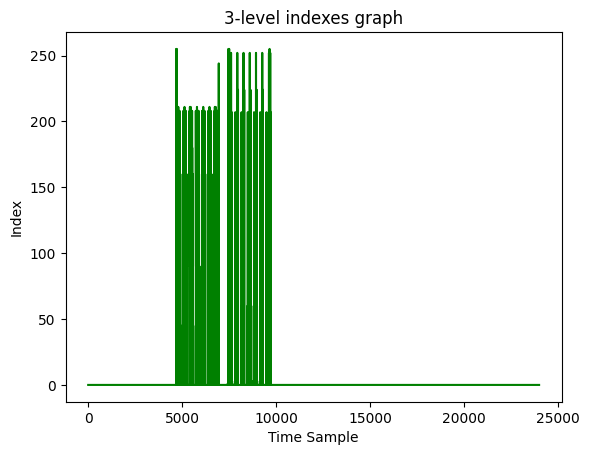

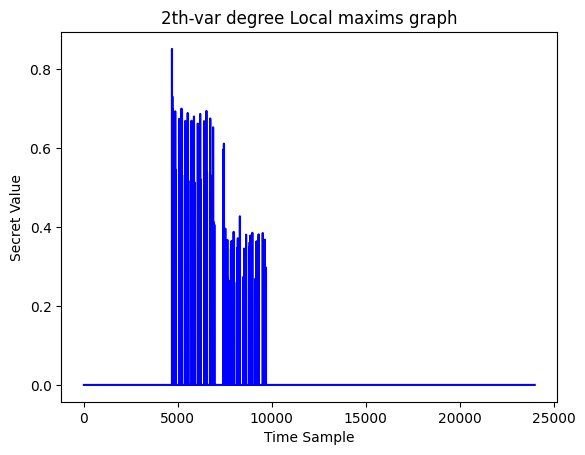

Number of uniques: 15
Number of local maxims: 68
Uniquess: [1, 180, 160, 90, 211, 45, 208, 255, 252, 207, 49, 3, 224, 60, 240]
Local maxims: [1, 1, 180, 180, 160, 90, 211, 180, 160, 90, 211, 180, 160, 90, 211, 180, 160, 90, 211, 45, 180, 160, 180, 211, 180, 160, 90, 211, 180, 90, 1, 208, 1, 255, 252, 207, 49, 207, 207, 1, 3, 207, 49, 207, 224, 3, 207, 49, 207, 224, 1, 207, 49, 207, 224, 60, 207, 49, 207, 224, 1, 49, 207, 224, 49, 252, 207, 240]


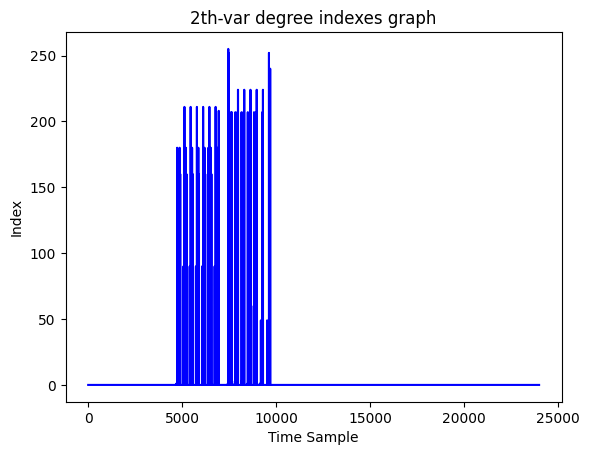

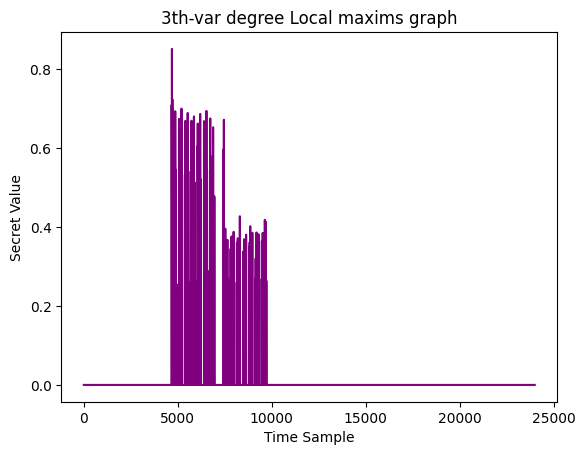

Number of uniques: 21
Number of local maxims: 426
Uniquess: [255, 1, 127, 104, 180, 90, 45, 211, 208, 160, 173, 128, 244, 3, 158, 252, 207, 49, 240, 60, 224]
Local maxims: [255, 255, 1, 1, 1, 1, 1, 1, 1, 1, 255, 255, 255, 255, 127, 104, 180, 180, 90, 90, 45, 90, 180, 180, 45, 45, 211, 45, 45, 45, 45, 45, 1, 1, 1, 1, 1, 1, 1, 1, 211, 211, 211, 211, 211, 211, 211, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 208, 208, 180, 90, 90, 90, 180, 180, 160, 160, 160, 160, 45, 208, 180, 90, 90, 90, 90, 180, 180, 45, 45, 45, 45, 45, 45, 45, 211, 211, 211, 211, 211, 208, 180, 90, 90, 180, 90, 160, 160, 160, 160, 208, 180, 90, 90, 90, 180, 180, 45, 45, 45, 45, 45, 45, 45, 211, 211, 211, 211, 211, 211, 208, 180, 90, 90, 180, 90, 90, 160, 160, 160, 160, 160, 160, 45, 208, 208, 180, 90, 90, 90, 90, 90, 180, 90, 45, 45, 45, 45, 45, 45, 45, 211, 211, 211, 211, 211, 208, 208, 180, 90, 180, 180, 208, 160, 160, 160, 160, 90, 208, 180, 90, 180, 90, 90, 180, 180, 45, 45, 45, 45, 45, 45, 45, 45, 45

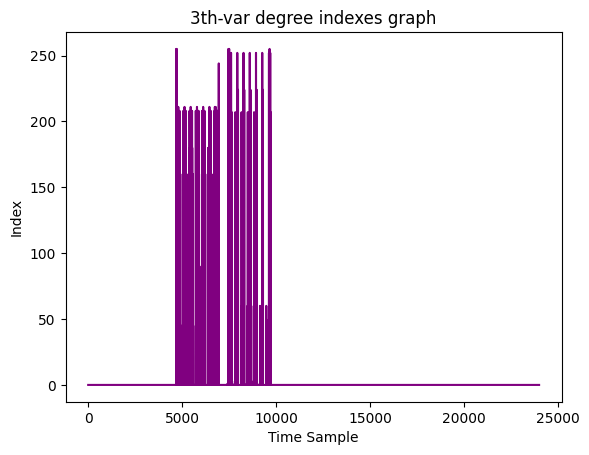

In range 0 - 24000
 Found the soonest secret value is 1, at the time sample 4690, with correlation secret_corr = 0.851


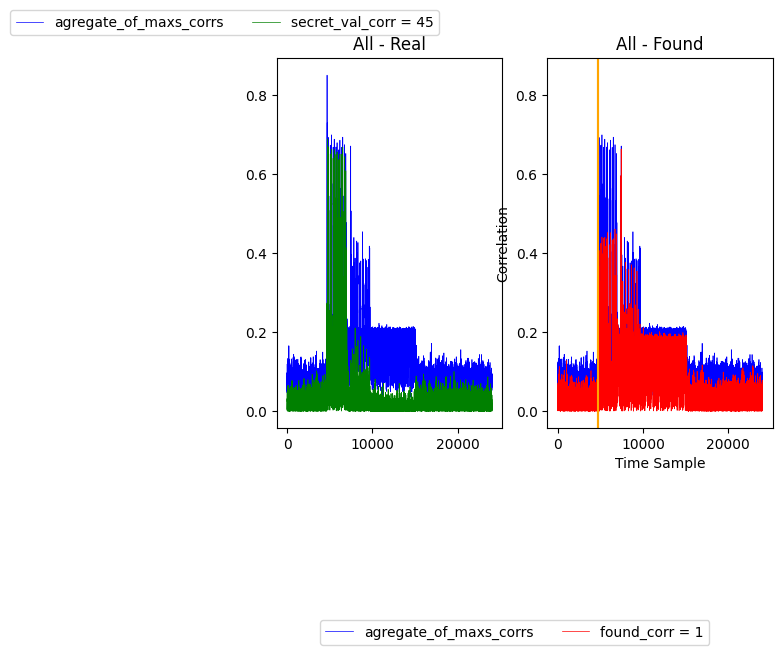

Hello 70
In range 4701 - 24000
 Found the soonest secret value is 1, at the time sample 4713, with correlation secret_corr = 0.731


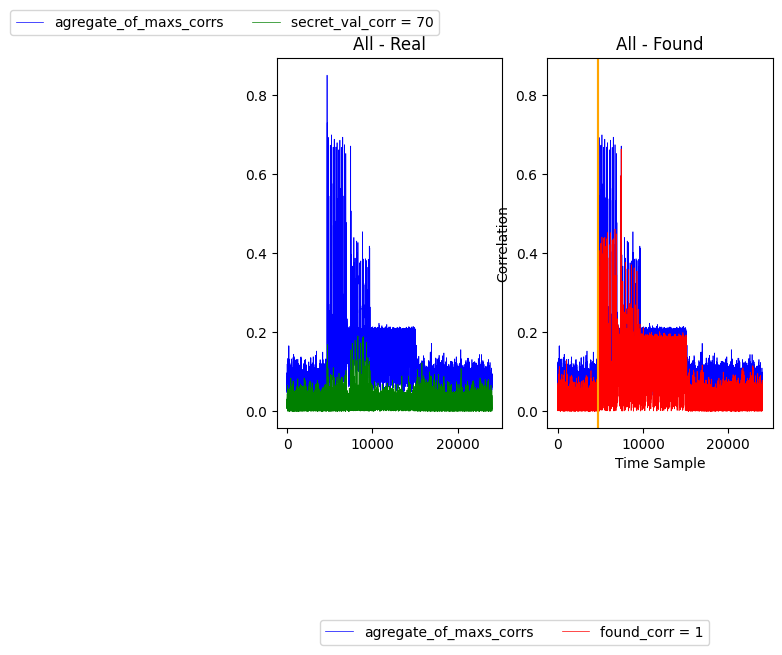

Hello 4
In range 4724 - 24000
 Found the soonest secret value is 180, at the time sample 4734, with correlation secret_corr = 0.698


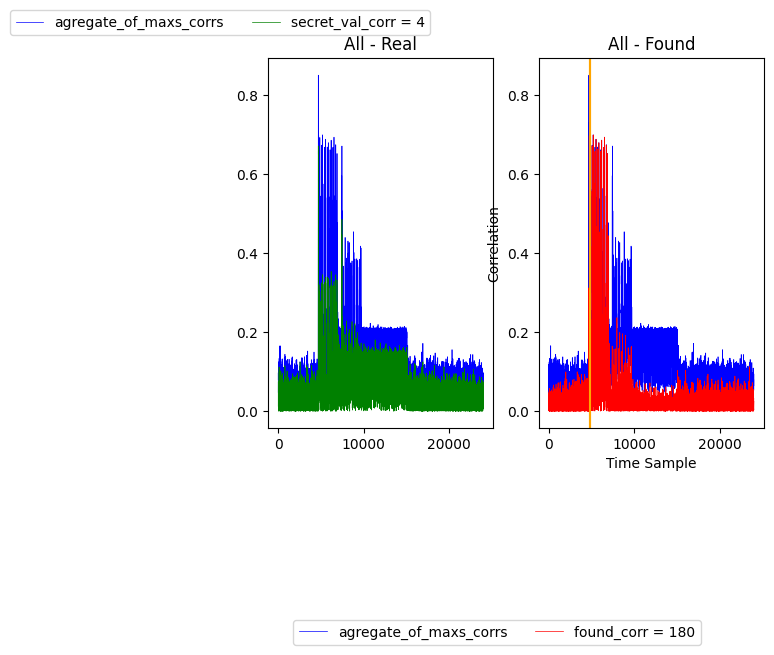

Hello 120
In range 4799 - 24000
 Found the soonest secret value is 180, at the time sample 4865, with correlation secret_corr = 0.693


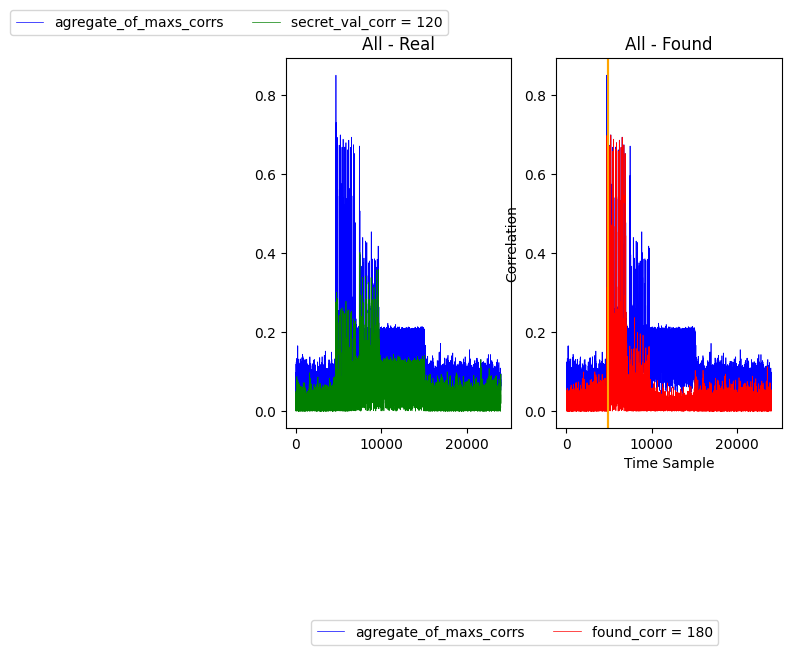

Hello 104
In range 4882 - 24000
 Found the soonest secret value is 160, at the time sample 4898, with correlation secret_corr = 0.545


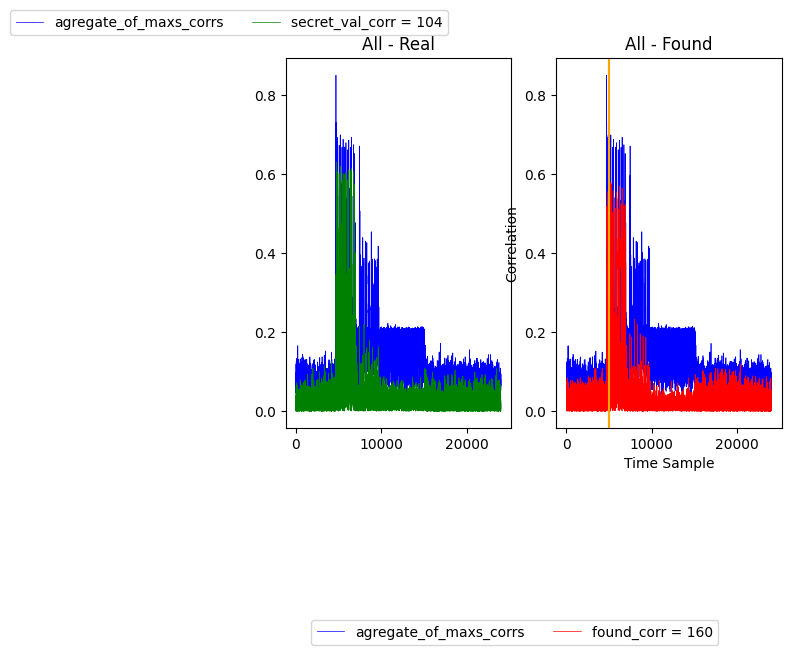

In [57]:
corr_map = abs(np.array(corr2_1000)[:,:])
analyse_corr(corr_map=corr_map, weights=np.array(out)[3:-4], stop_num = 5, maxims_map = None,
                 _index = 0, peak_range = 0.6, show_info=True, mountain_half_dist = 5, level = 3)

##### Abs value int

In [26]:
np.array(out)[3:-4]

array([ 45,  70,   4, 120, 104, 255,  43,   0, 207,  41, 180, 216, 167,
        63, 241,   0,   0,   0,   0,   0], dtype=uint8)

Hello 45
273
 Index of global max: 4690 and global_max_val: 0.6815812916010914


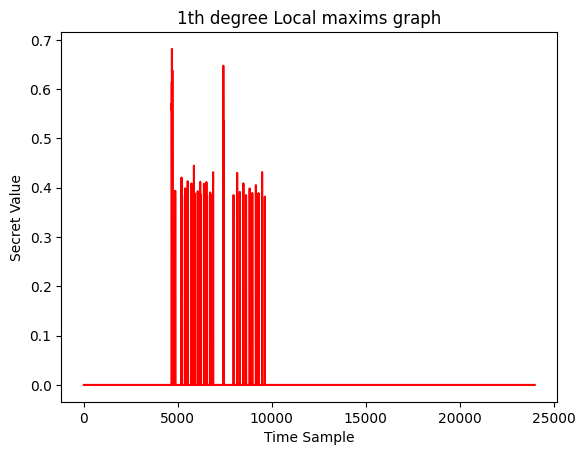

Number of uniques: 27
Number of local maxims: 77
Uniquess: [175, 57, 23, 37, 219, 29, 1, 207, 99, 15, 119, 11, 41, 27, 21, 227, 3, 17, 71, 231, 25, 85, 43, 63, 197, 5, 255]
Local maxims: [175, 57, 23, 37, 219, 175, 29, 1, 207, 99, 57, 29, 219, 15, 37, 119, 29, 11, 41, 27, 41, 21, 227, 57, 219, 57, 219, 3, 17, 57, 3, 71, 57, 57, 17, 29, 41, 57, 175, 21, 21, 37, 27, 175, 57, 29, 57, 231, 25, 57, 41, 85, 37, 29, 43, 63, 27, 197, 175, 21, 41, 27, 5, 41, 29, 227, 57, 21, 37, 57, 29, 43, 37, 255, 57, 85, 57]


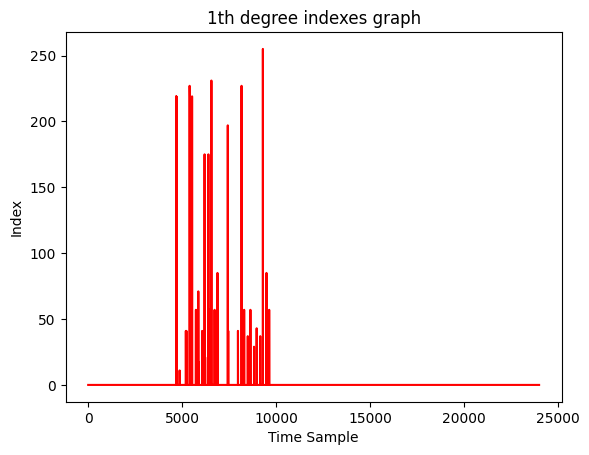

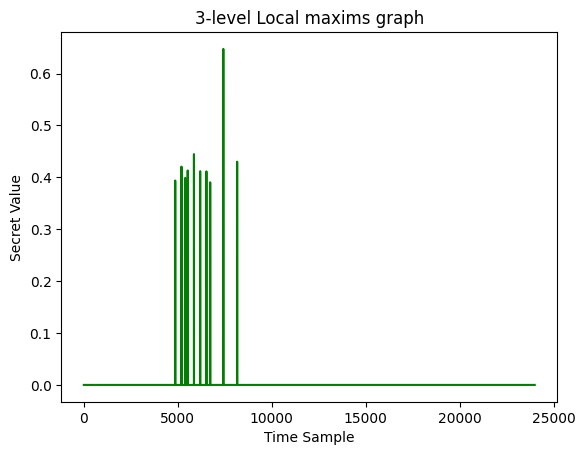

Number of uniques: 7
Number of local maxims: 10
Uniquess: [11, 41, 227, 219, 71, 57, 29]
Local maxims: [11, 41, 227, 219, 71, 57, 29, 57, 29, 29]


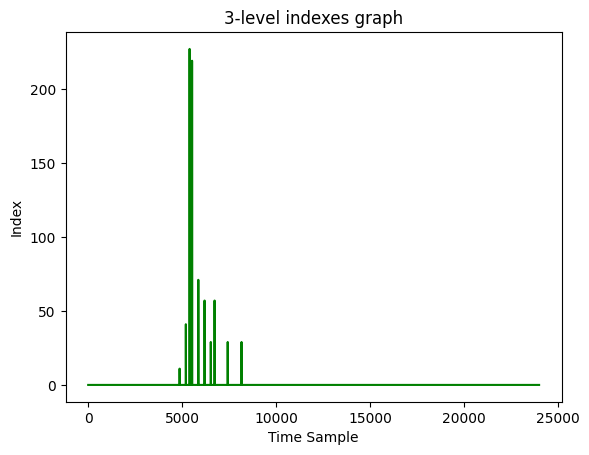

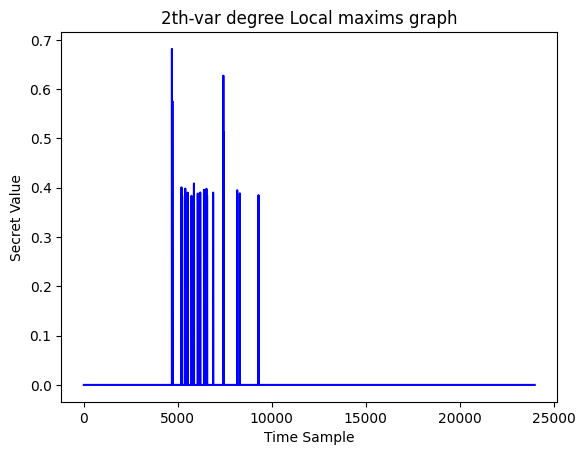

Number of uniques: 11
Number of local maxims: 19
Uniquess: [99, 37, 27, 21, 57, 3, 41, 175, 25, 43, 227]
Local maxims: [99, 37, 27, 21, 57, 3, 57, 57, 41, 175, 27, 57, 25, 37, 43, 41, 227, 21, 57]


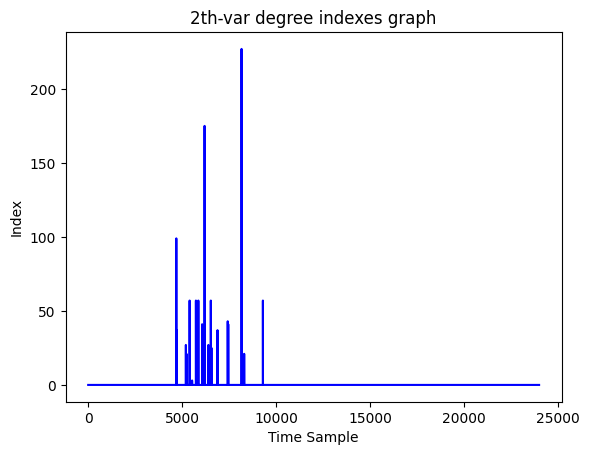

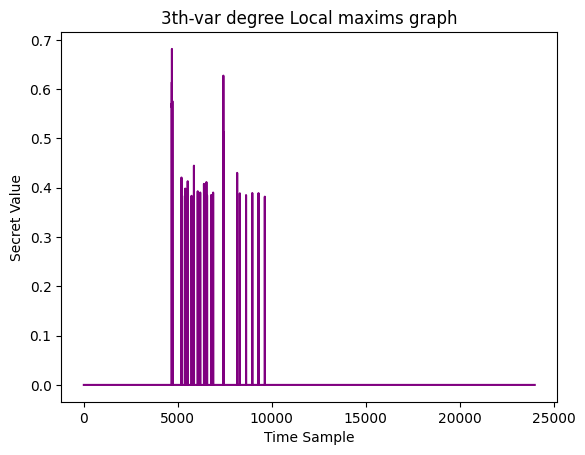

Number of uniques: 20
Number of local maxims: 50
Uniquess: [175, 57, 37, 219, 29, 1, 99, 119, 41, 27, 21, 3, 71, 25, 43, 63, 197, 5, 227, 255]
Local maxims: [175, 57, 37, 219, 29, 1, 99, 57, 29, 37, 119, 29, 41, 27, 21, 57, 219, 219, 3, 57, 71, 57, 57, 29, 41, 175, 21, 27, 175, 29, 57, 25, 41, 37, 43, 63, 27, 197, 175, 41, 27, 5, 29, 227, 21, 57, 43, 255, 57, 57]


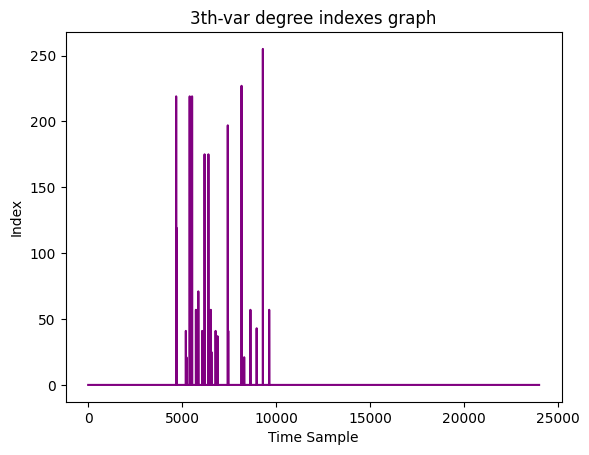

In range 0 - 24000
 Found the soonest secret value is 99, at the time sample 4690, with correlation secret_corr = 0.682


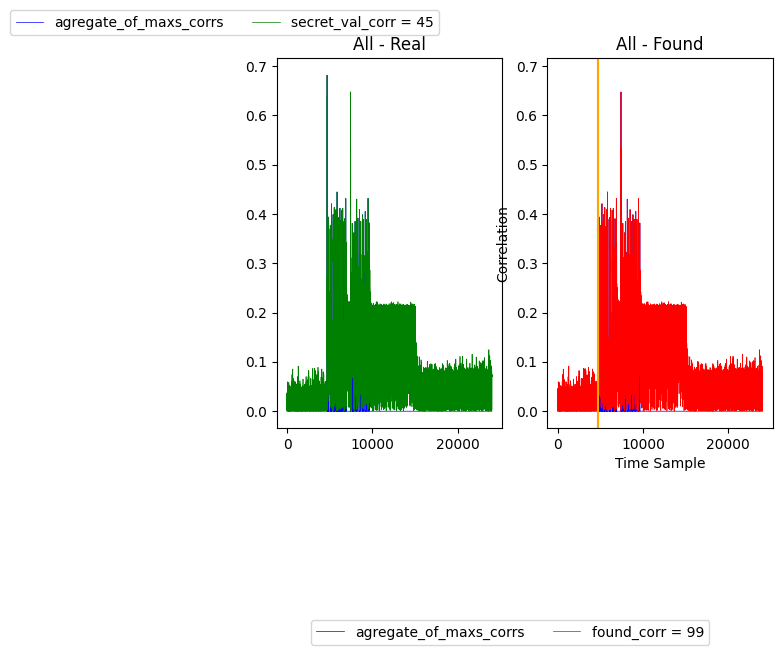

Hello 70
In range 4703 - 24000
 Found the soonest secret value is 37, at the time sample 4715, with correlation secret_corr = 0.576


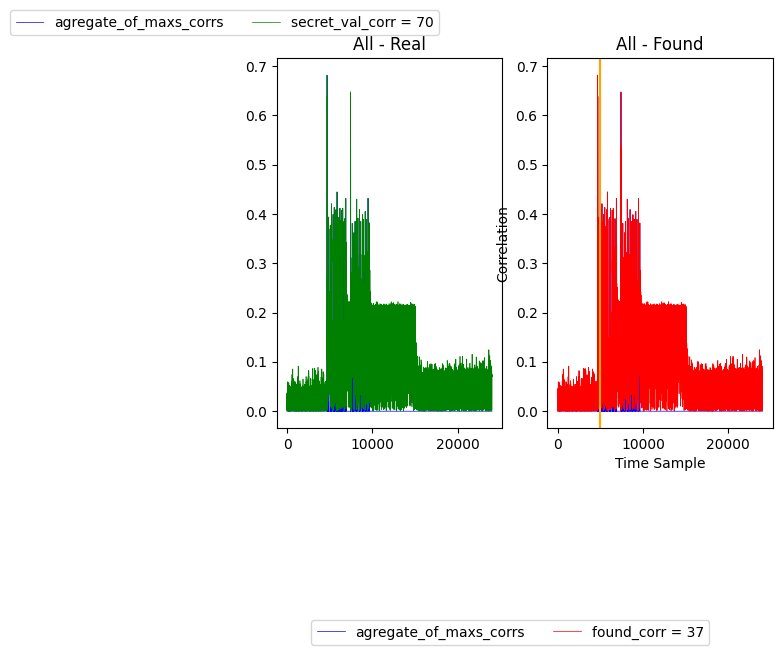

Hello 4
In range 4956 - 24000
 Found the soonest secret value is 27, at the time sample 5198, with correlation secret_corr = 0.401


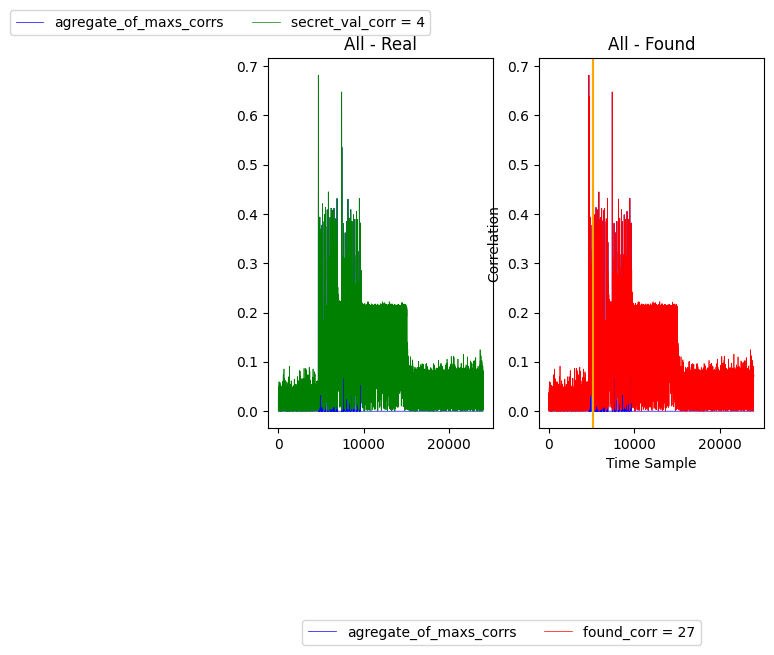

Hello 120
In range 5214 - 24000
 Found the soonest secret value is 21, at the time sample 5230, with correlation secret_corr = 0.384


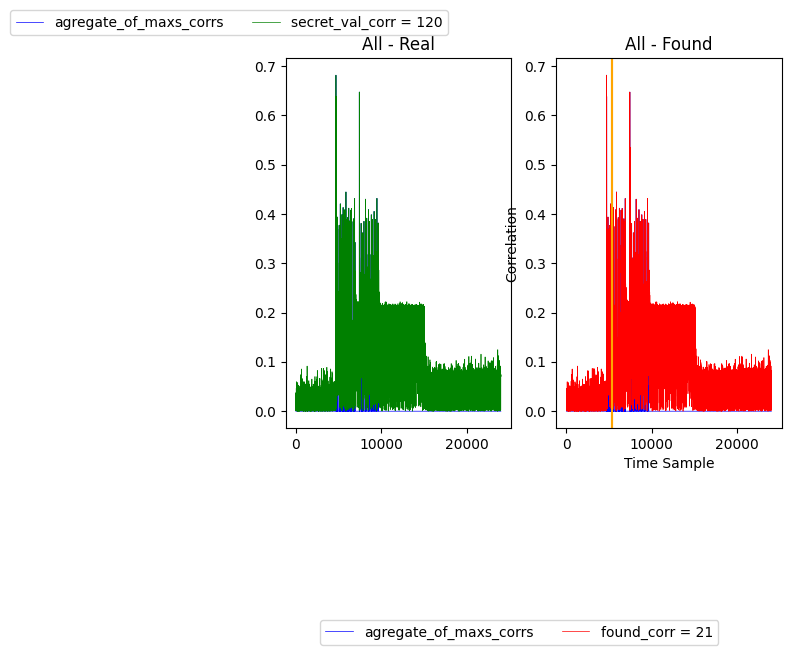

Hello 104
In range 5314 - 24000
 Found the soonest secret value is 57, at the time sample 5398, with correlation secret_corr = 0.398


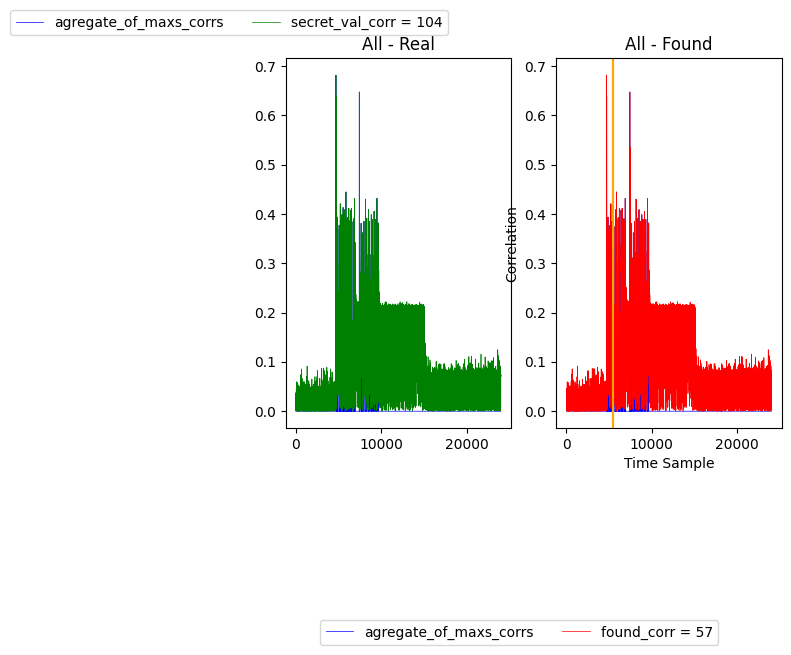

In [27]:
corr_map = abs(np.array(corr3_1000)[:,:])
analyse_corr(corr_map=corr_map, weights=np.array(out)[3:-4], stop_num = 5, maxims_map = None,
                 _index = 0, peak_range = 0.3, show_info=True, mountain_half_dist = 5, level = 3)

##### Abs value char

In [24]:
np.array(out)[3:-4]

array([ 45,  70,   4, 120, 104, 255,  43,   0, 207,  41, 180, 216, 167,
        63, 241,   0,   0,   0,   0,   0], dtype=uint8)

Hello 45
464
 Index of global max: 4690 and global_max_val: 0.681581291601091


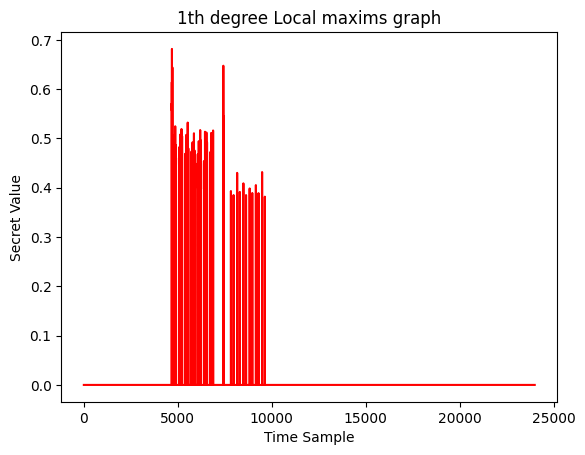

Number of uniques: 7
Number of local maxims: 181
Uniquess: [1, 2, 208, 160, 180, 45, 207]
Local maxims: [1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 208, 208, 208, 208, 160, 160, 180, 180, 180, 45, 45, 45, 45, 45, 45, 208, 208, 208, 160, 160, 160, 208, 208, 208, 208, 160, 160, 180, 160, 208, 45, 45, 45, 45, 45, 45, 160, 208, 160, 160, 160, 160, 208, 208, 208, 160, 160, 180, 208, 45, 45, 45, 45, 45, 45, 208, 208, 208, 160, 160, 160, 160, 208, 208, 160, 180, 180, 45, 45, 45, 45, 45, 45, 208, 208, 208, 160, 160, 160, 160, 208, 208, 160, 160, 160, 180, 180, 180, 45, 45, 45, 45, 45, 45, 45, 160, 208, 160, 160, 160, 160, 208, 208, 208, 160, 160, 180, 45, 45, 45, 45, 45, 45, 160, 208, 160, 160, 160, 160, 160, 208, 208, 208, 160, 160, 180, 208, 208, 45, 45, 45, 45, 45, 45, 45, 160, 208, 160, 208, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 207, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


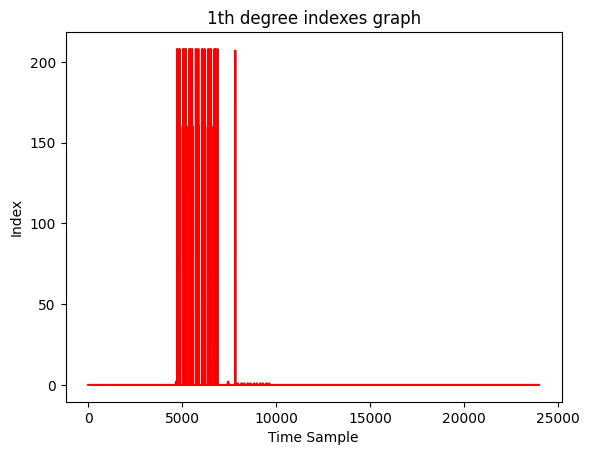

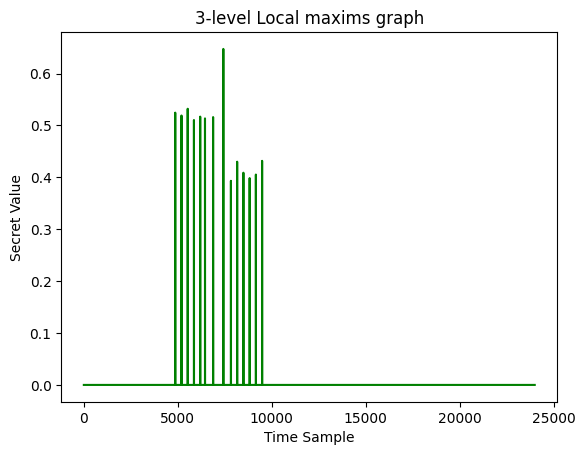

Number of uniques: 4
Number of local maxims: 14
Uniquess: [208, 45, 1, 207]
Local maxims: [208, 208, 208, 208, 208, 45, 208, 1, 207, 1, 1, 1, 1, 1]


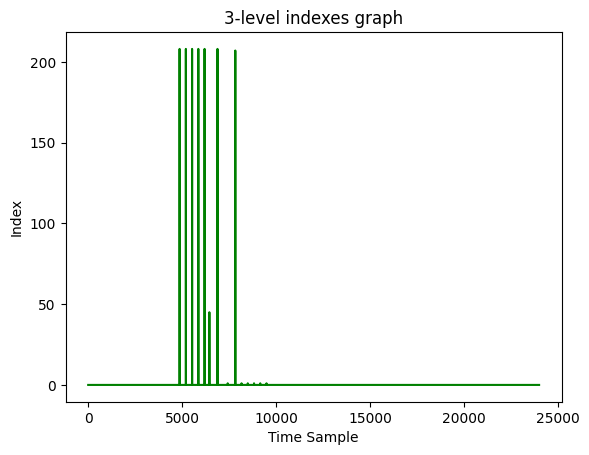

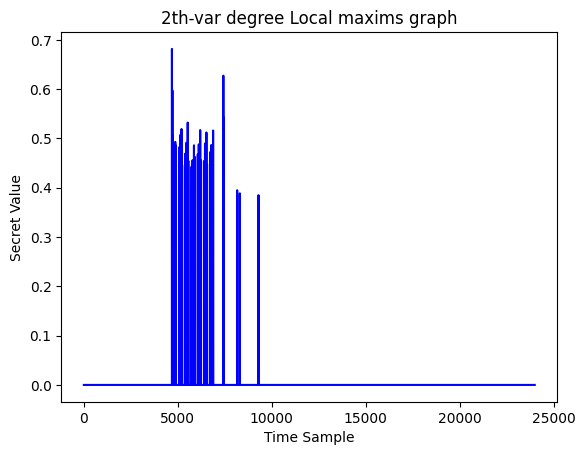

Number of uniques: 5
Number of local maxims: 41
Uniquess: [1, 2, 208, 45, 160]
Local maxims: [1, 2, 208, 45, 45, 208, 160, 160, 45, 45, 208, 160, 208, 45, 45, 208, 160, 160, 45, 45, 208, 160, 160, 45, 45, 208, 160, 208, 45, 45, 208, 160, 208, 45, 45, 208, 1, 2, 1, 1, 1]


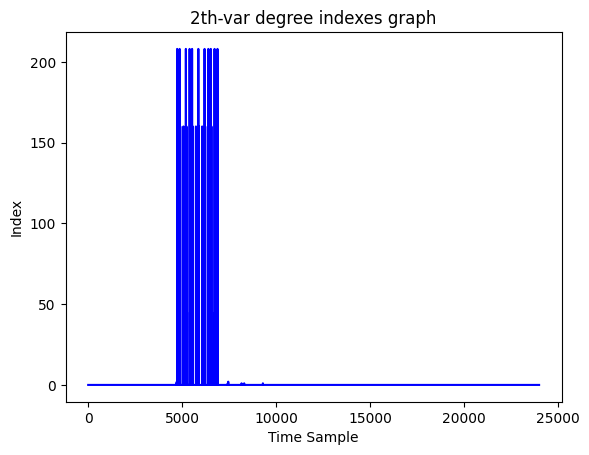

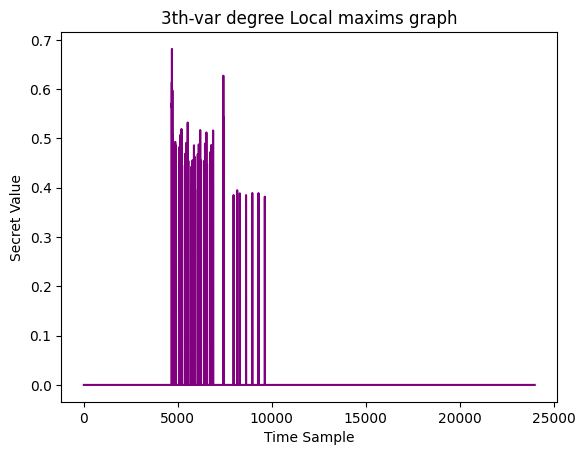

Number of uniques: 6
Number of local maxims: 124
Uniquess: [1, 2, 208, 160, 180, 45]
Local maxims: [1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 208, 160, 160, 180, 180, 180, 45, 45, 45, 45, 208, 208, 160, 160, 208, 208, 160, 160, 180, 160, 208, 45, 45, 45, 45, 208, 160, 160, 160, 208, 160, 160, 180, 208, 45, 45, 45, 45, 208, 208, 160, 160, 160, 160, 180, 180, 45, 45, 45, 45, 208, 208, 160, 160, 208, 208, 160, 160, 180, 180, 180, 45, 45, 45, 45, 45, 208, 160, 160, 160, 208, 160, 160, 180, 45, 45, 45, 45, 208, 160, 160, 160, 160, 208, 160, 160, 180, 208, 208, 45, 45, 45, 45, 208, 160, 208, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1]


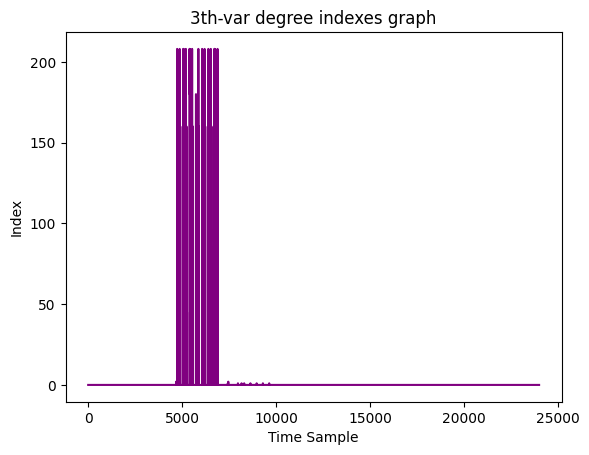

In range 0 - 24000
 Found the soonest secret value is 1, at the time sample 4690, with correlation secret_corr = 0.682


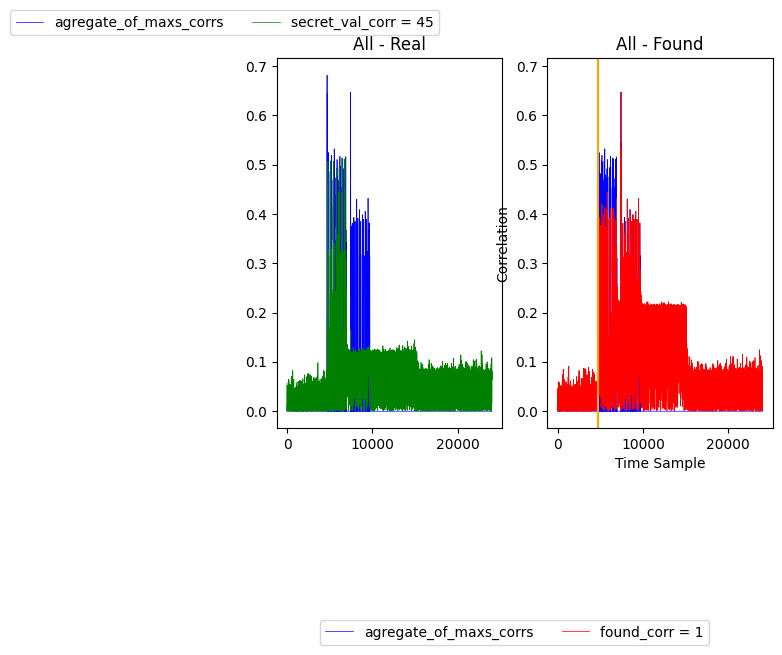

Hello 70
In range 4703 - 24000
 Found the soonest secret value is 2, at the time sample 4715, with correlation secret_corr = 0.597


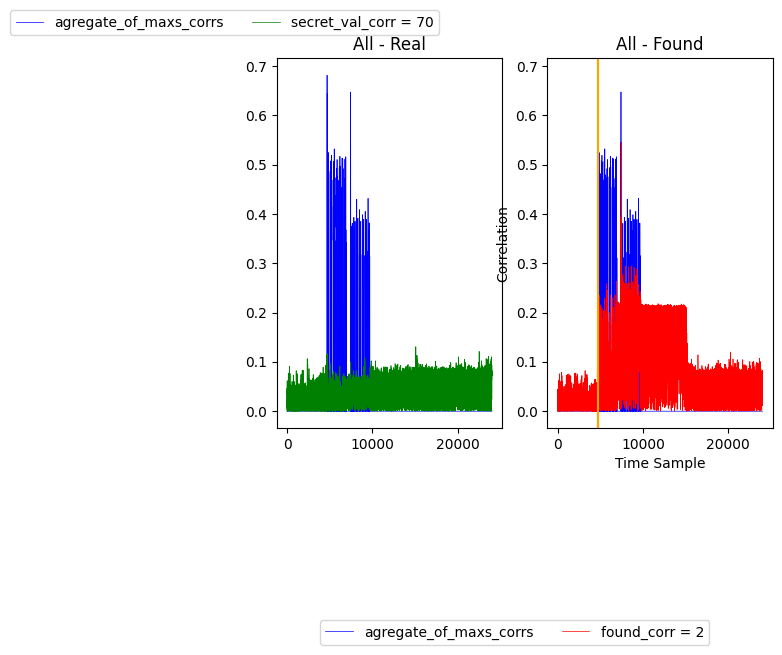

Hello 4
In range 4724 - 24000
 Found the soonest secret value is 208, at the time sample 4734, with correlation secret_corr = 0.506


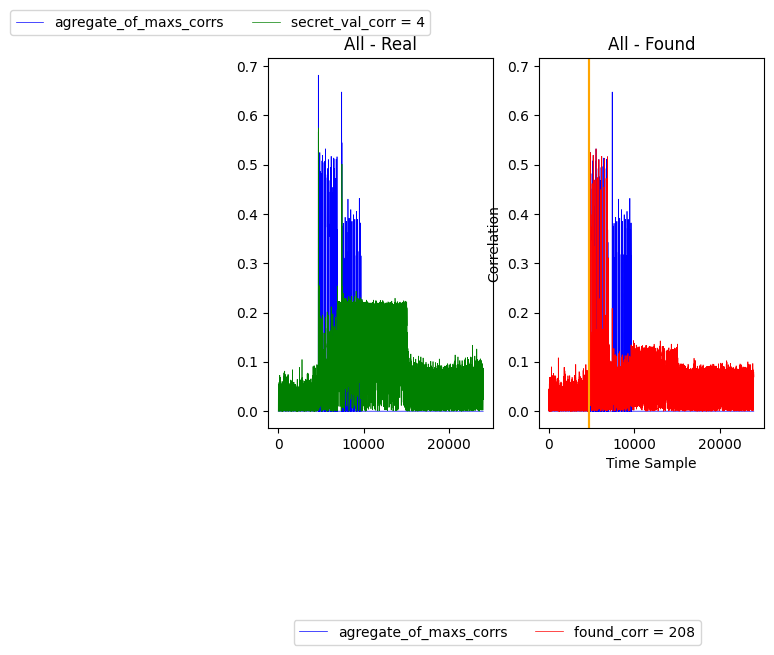

Hello 120
In range 4744 - 24000
 Found the soonest secret value is 45, at the time sample 4754, with correlation secret_corr = 0.399


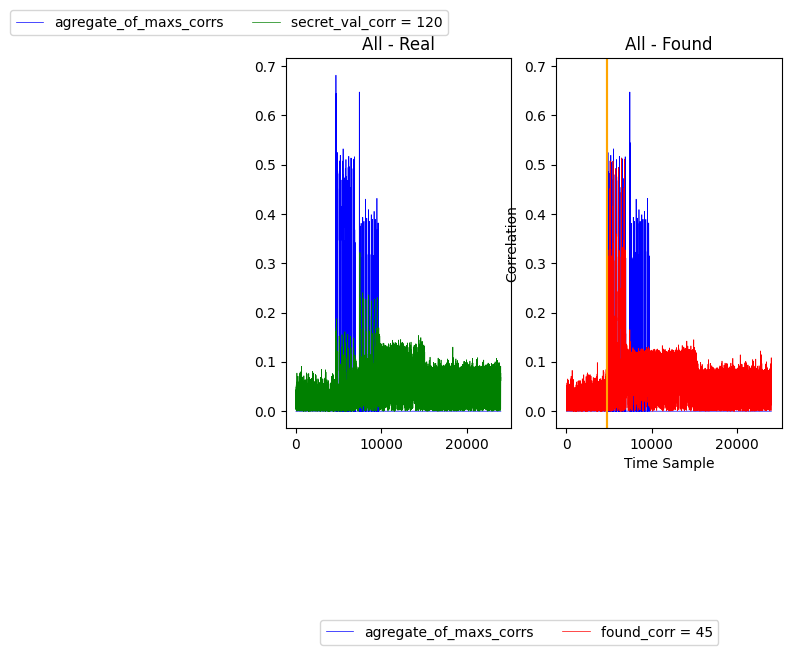

Hello 104
In range 4773 - 24000
 Found the soonest secret value is 45, at the time sample 4791, with correlation secret_corr = 0.479


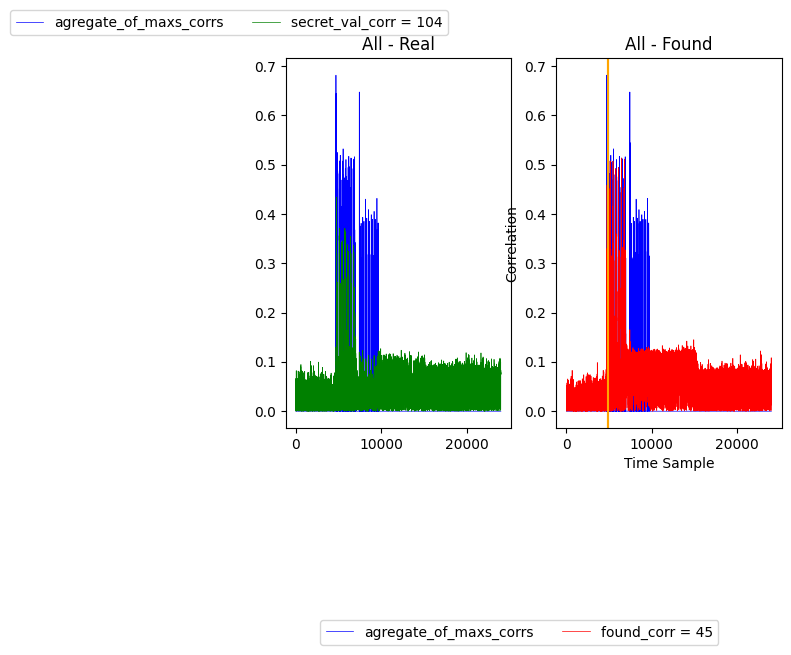

In [25]:
corr_map = abs(np.array(corr4_1000)[:,:])
analyse_corr(corr_map=corr_map, weights=np.array(out)[3:-4], stop_num = 5, maxims_map = None,
                 _index = 0, peak_range = 0.3, show_info=True, mountain_half_dist = 5, level = 3)

### QUANTIZATED_Basic ANN CPA, 1000 traces

In [9]:
scope, target, cw_setuper = setup("makefile_dir_basic_quantized2_MLP-Rand-2")
time.sleep(10)

⚠️ Changed, firmware config!!!
✔️ Firmware maked, with command cd %s | make CRYPTO_TARGET=%s PLATFORM=%s FIRMWAREPATH=%s SS_VER=%s TARGET=%s> output.txt 2>warnings_new.txt.
INFO: Found ChipWhisperer😍
✔️ INFO: Scope and Target, are set😍
❤️ Target hex: ./makefile_dir_basic_quantized2_MLP-Rand-2/simpleserial-target-CWLITEARM.hex
Detected known STMF32: STM32F302xB(C)/303xB(C)
Extended erase (0x44), this can take ten seconds or more
Attempting to program 22715 bytes at 0x8000000
STM32F Programming flash...
STM32F Reading flash...
Verified flash OK, 22715 bytes
✔️ Setuper initiated.


Capturing and Analysing the traces::   0%|          | 0/1 [00:00<?, ?it/s]

⚠️ Generating rand_input..


                                Capturing traces:   0%|          | 0/1000 [00:00<?, ?it/s]

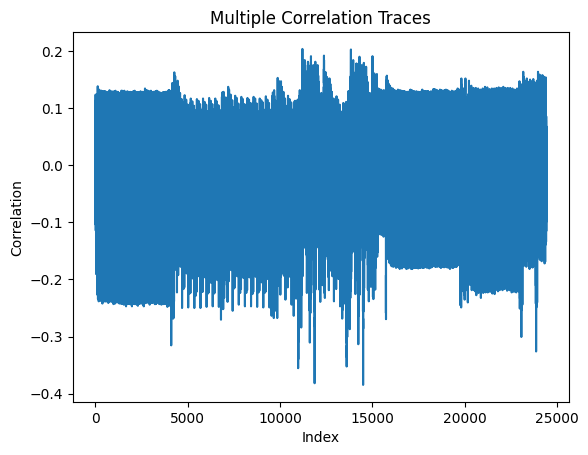

✔️ Saving Rand_input succesfull.
🌍 Saving Secret_weights succesfull.
CWbytearray(b'00 72 16 2d 46 04 78 68 ff 2b 00 cf 29 b4 d8 a7 3f f1 00 00 00 00 00 f0 00 ba 00')


Calculating Correlations for the Secret-Key:   0%|          | 0/256 [00:00<?, ?it/s]

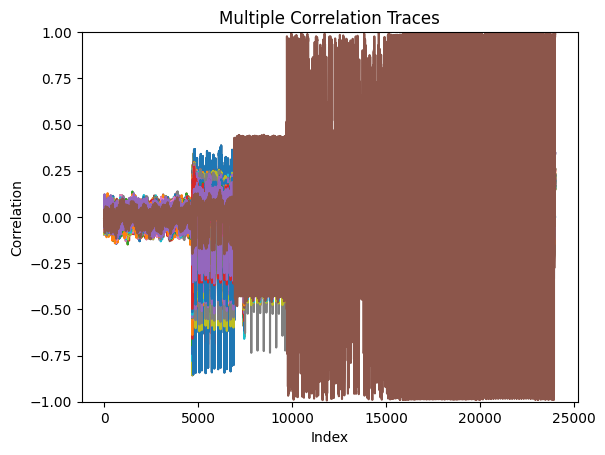

Calculating Correlations for the Secret-Key:   0%|          | 0/256 [00:00<?, ?it/s]

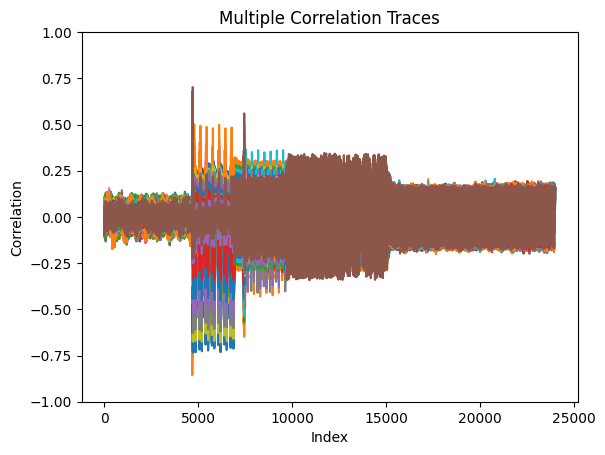

Calculating Correlations for the Secret-Key:   0%|          | 0/256 [00:00<?, ?it/s]

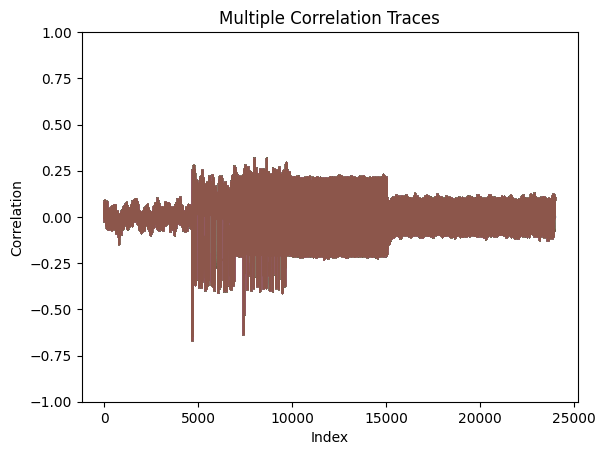

Calculating Correlations for the Secret-Key:   0%|          | 0/256 [00:00<?, ?it/s]

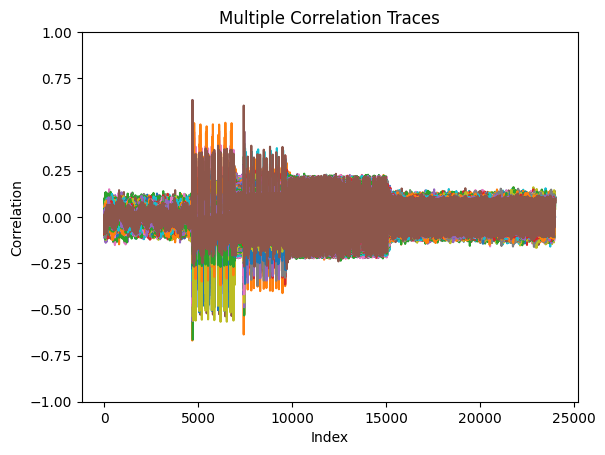

✔️ Scope disconnected.
✔️ Firmware disconnected.


In [10]:
corr1_1000, corr2_1000, corr3_1000, corr4_1000, rand_input, waves, out = capture_correlate(scope, epochs_list = [1000], ncorr_all1 = None, ncorr_all2 = None, decimate = 1, reverse = False, runName="_722_BasicMLP")

#### SPA

In [33]:
cw.plot(corr1_1000[45]) *cw.plot(avg_wave)

:Overlay
   .Curve.I  :Curve   [x]   (y)
   .Curve.II :Curve   [x]   (y)

In [34]:
cw.plot(waves[0]) * cw.plot(avg_wave) * cw.plot(diff_avg) * cw.plot(var)

:Overlay
   .Curve.I   :Curve   [x]   (y)
   .Curve.II  :Curve   [x]   (y)
   .Curve.III :Curve   [x]   (y)
   .Curve.IV  :Curve   [x]   (y)

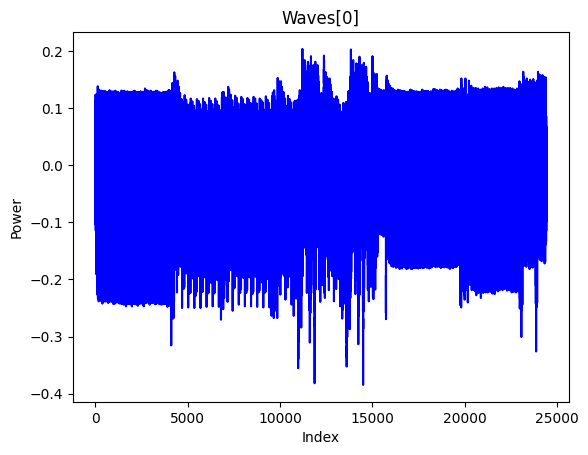

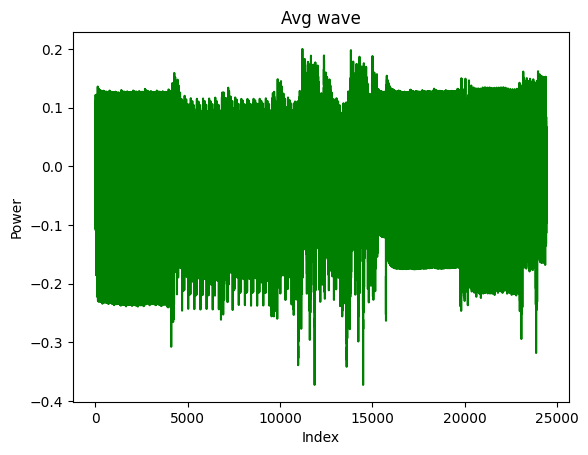

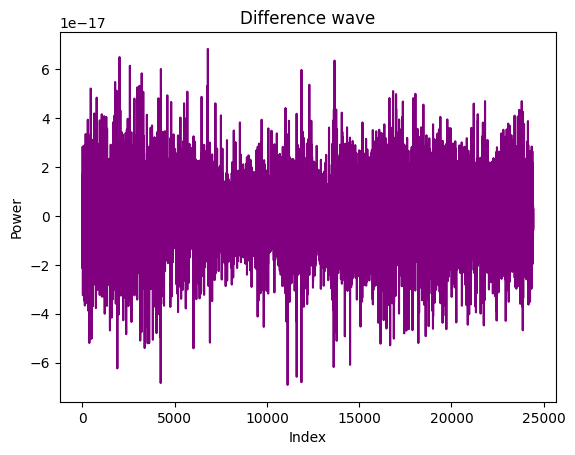

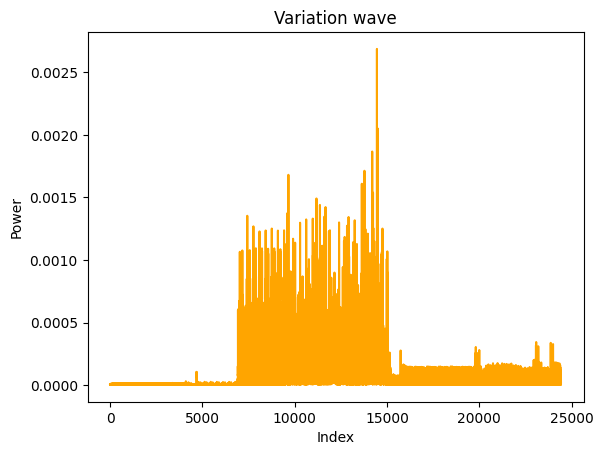

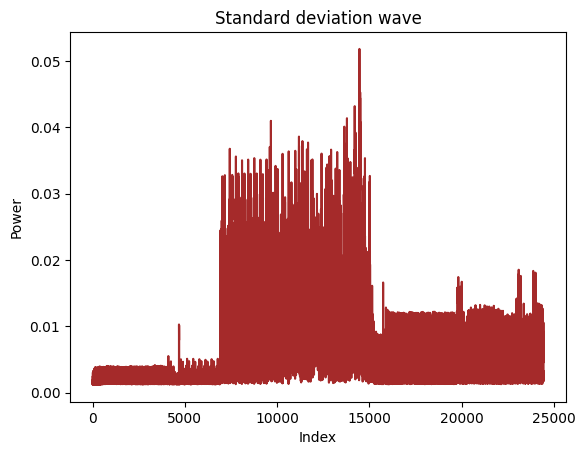

In [46]:
diff_avg, avg_wave, var, ____ = createDiffWave(waves, "1000_722")

#### Additional analysis (CPA get weight)

##### HW(int)

In [12]:
np.array(out)[3:-4]

array([ 45,  70,   4, 120, 104, 255,  43,   0, 207,  41, 180, 216, 167,
        63, 241,   0,   0,   0,   0,   0], dtype=uint8)

Hello 45
Peak range: 0.3
24000
 Index of global max: 14613 and global_max_val: 0.9982037792428642


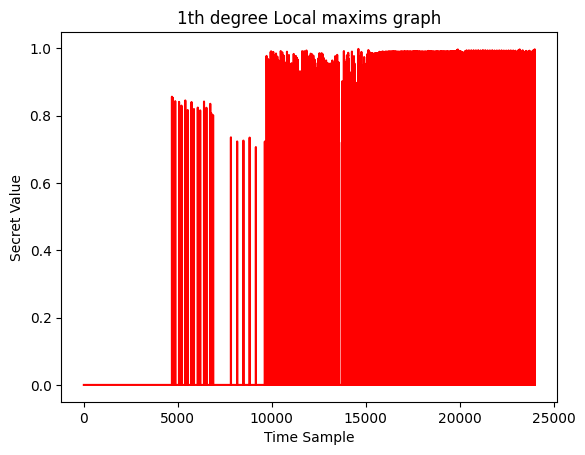

Number of uniques: 5
Number of local maxims: 4903
Uniquess: [1, 129, 45, 207, 255]
Local maxims: [1, 1, 1, 129, 129, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 207, 207, 207, 207, 207, 207, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,

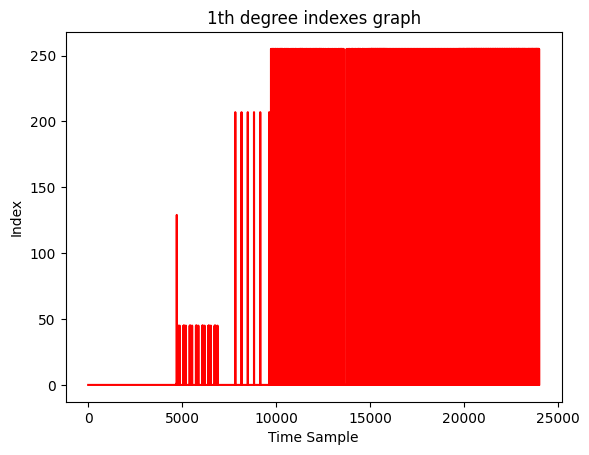

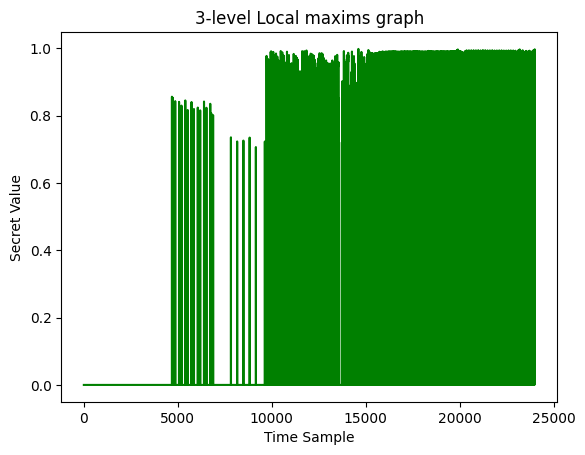

Number of uniques: 5
Number of local maxims: 7334
Uniquess: [1, 129, 45, 207, 255]
Local maxims: [1, 1, 1, 1, 129, 129, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 207, 207, 207, 207, 207, 207, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255

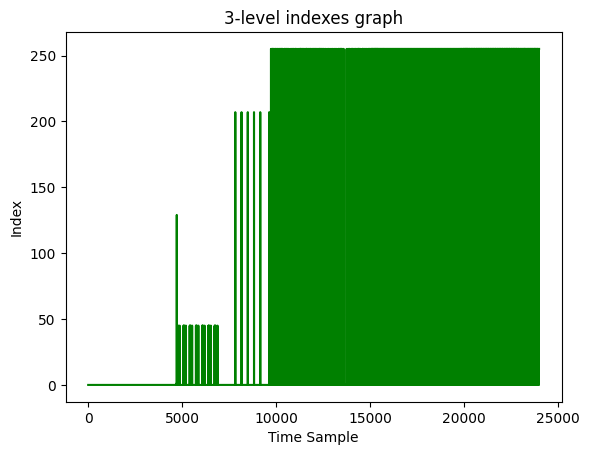

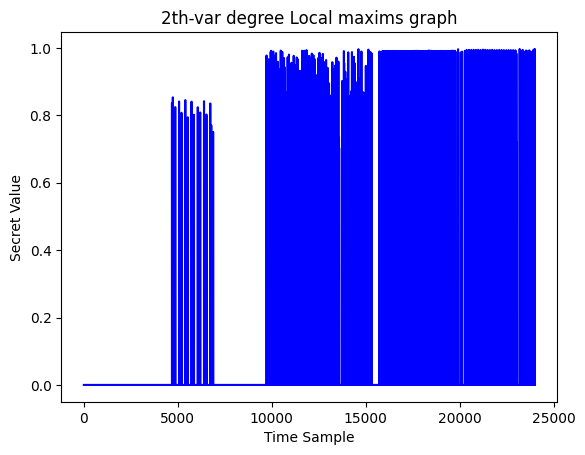

Number of uniques: 4
Number of local maxims: 485
Uniquess: [1, 129, 45, 255]
Local maxims: [1, 129, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 2

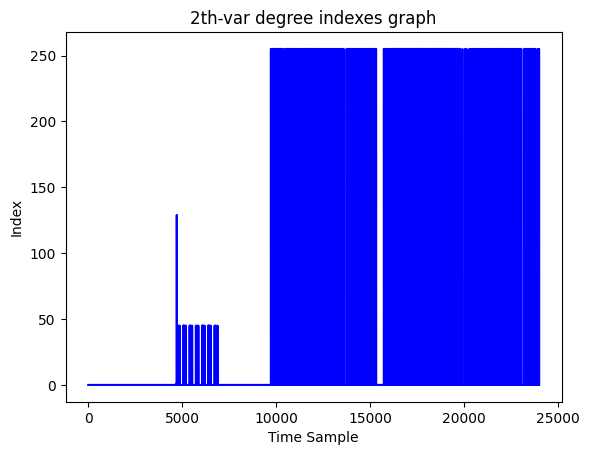

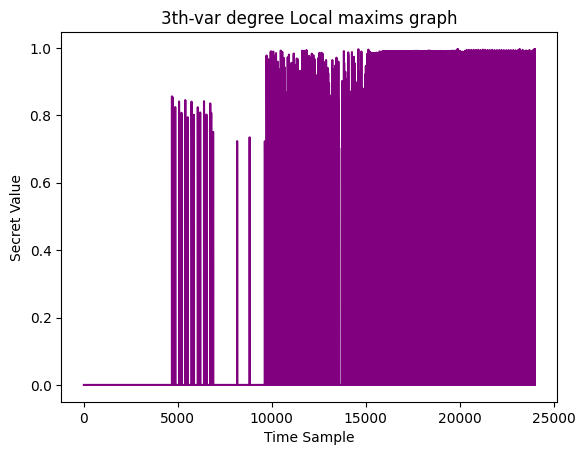

Number of uniques: 5
Number of local maxims: 3531
Uniquess: [1, 129, 45, 207, 255]
Local maxims: [1, 1, 1, 129, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 207, 207, 207, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 

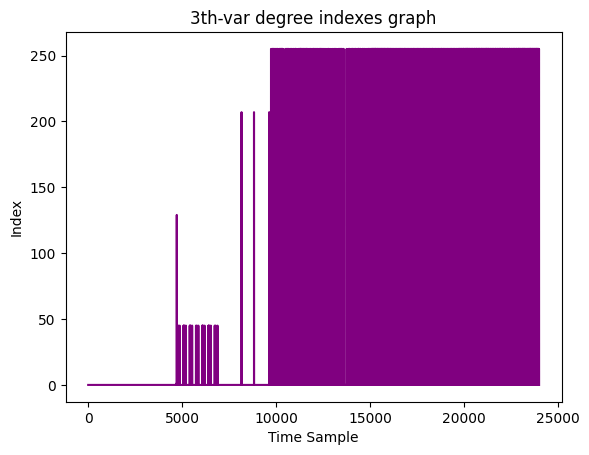

In range 0 - 24000
 Found the soonest secret value is 1, at the time sample 4691, with correlation secret_corr = 0.836


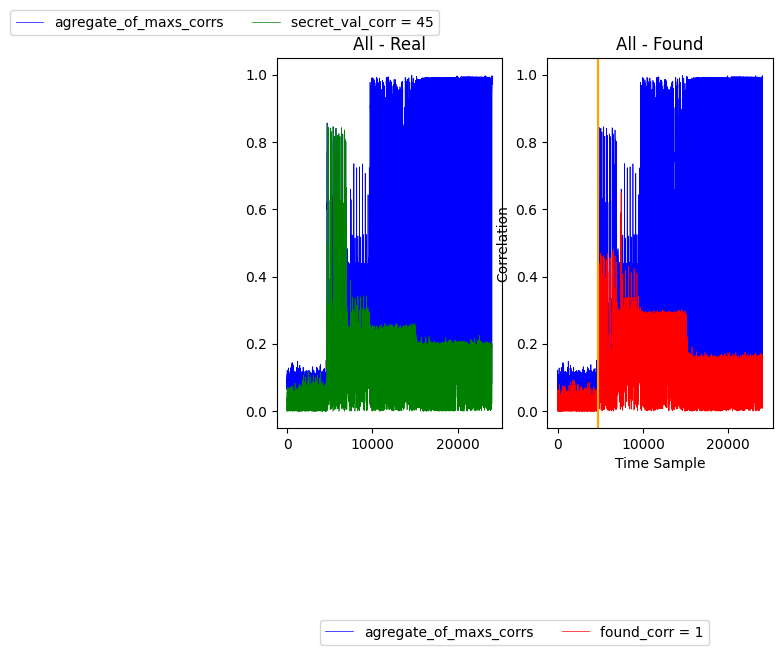

Hello 70
In range 4702 - 24000
 Found the soonest secret value is 129, at the time sample 4714, with correlation secret_corr = 0.737


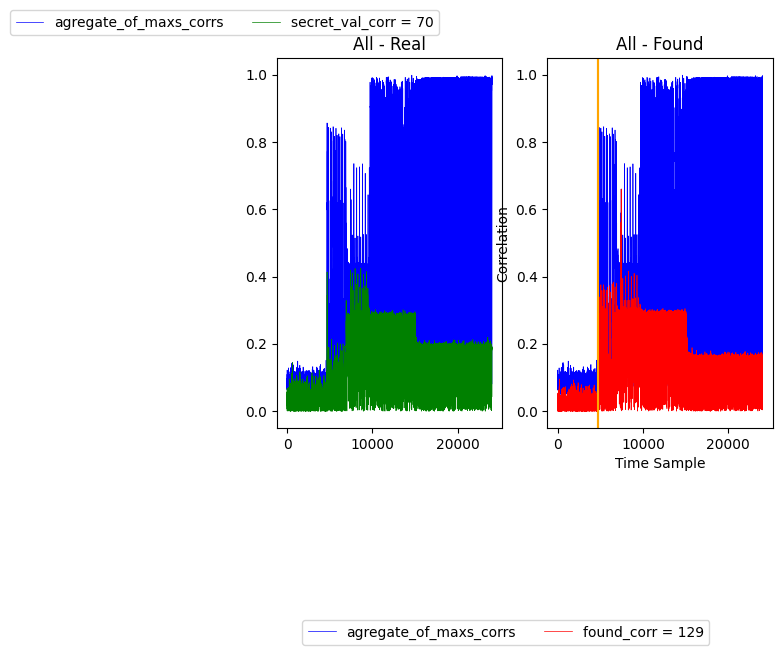

Hello 4
In range 4725 - 24000
 Found the soonest secret value is 45, at the time sample 4737, with correlation secret_corr = 0.853


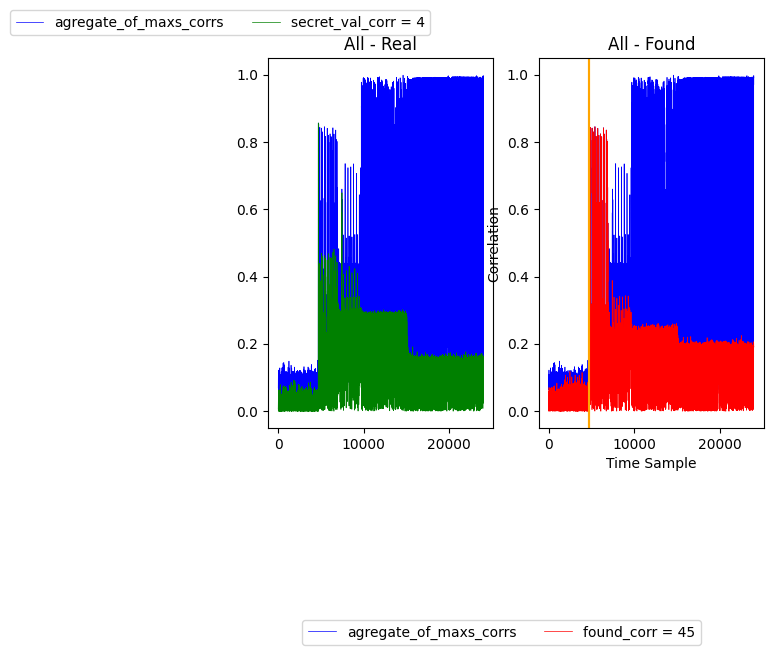

Hello 120
In range 4746 - 24000
 Found the soonest secret value is 45, at the time sample 4754, with correlation secret_corr = 0.763


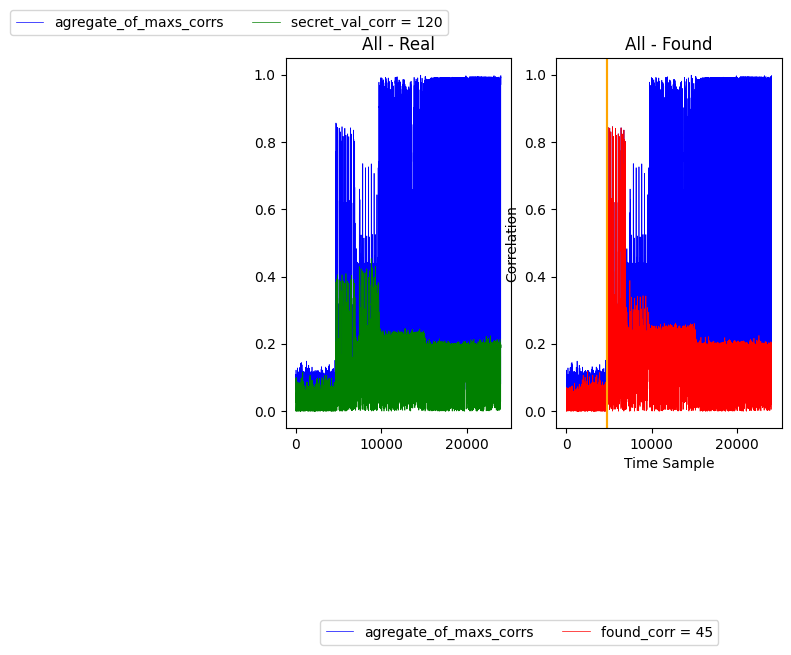

Hello 104
In range 4772 - 24000
 Found the soonest secret value is 45, at the time sample 4790, with correlation secret_corr = 0.759


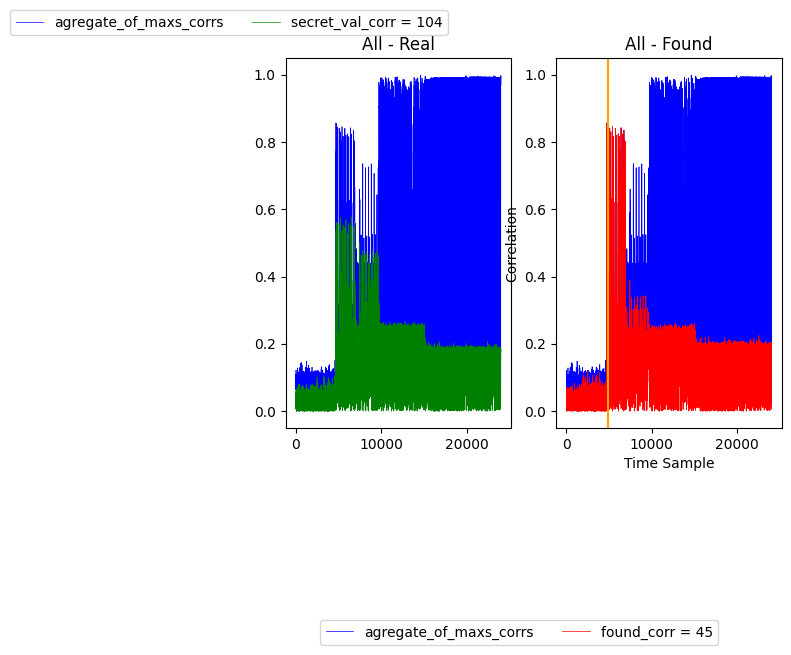

Hello 255
In range 4828 - 24000
 Found the soonest secret value is 45, at the time sample 4866, with correlation secret_corr = 0.825


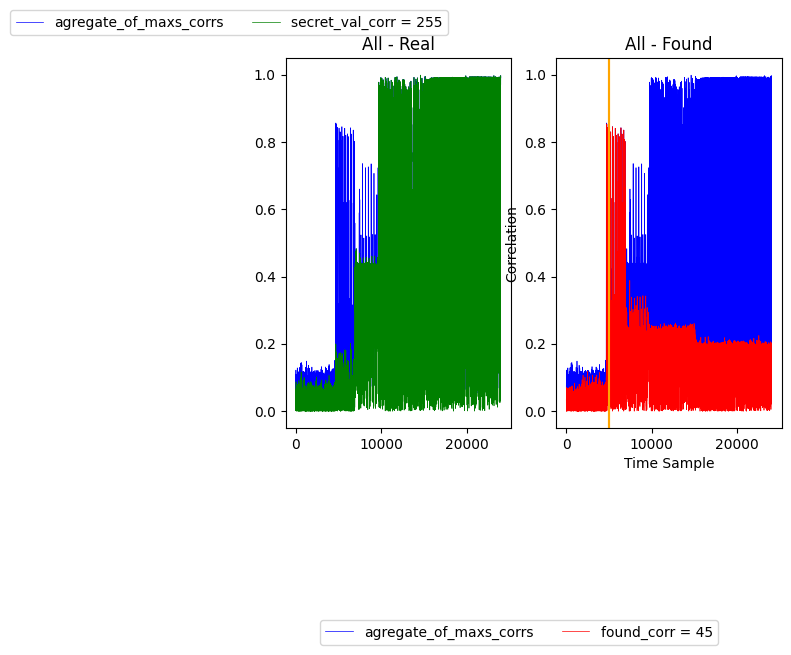

Hello 43
In range 4967 - 24000
 Found the soonest secret value is 45, at the time sample 5069, with correlation secret_corr = 0.841


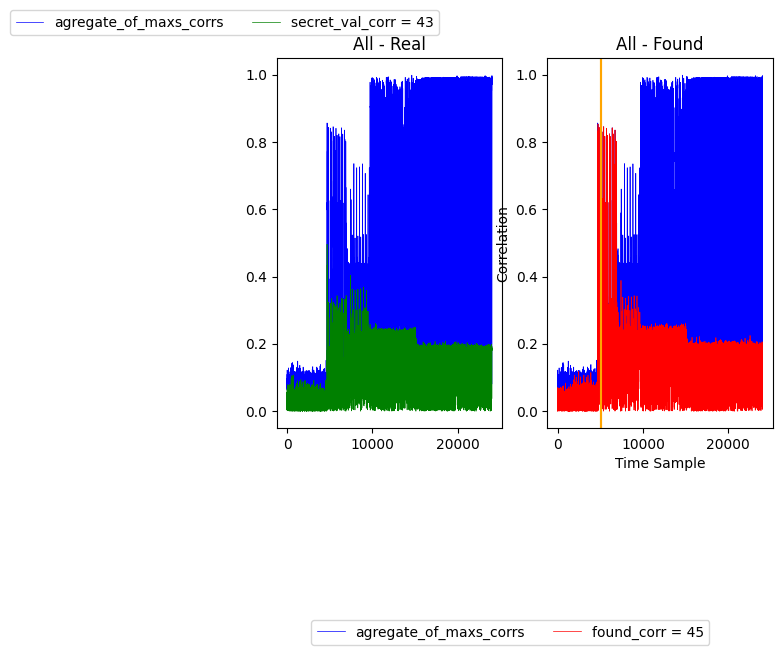

Hello 0
In range 5079 - 24000
 Found the soonest secret value is 45, at the time sample 5089, with correlation secret_corr = 0.723


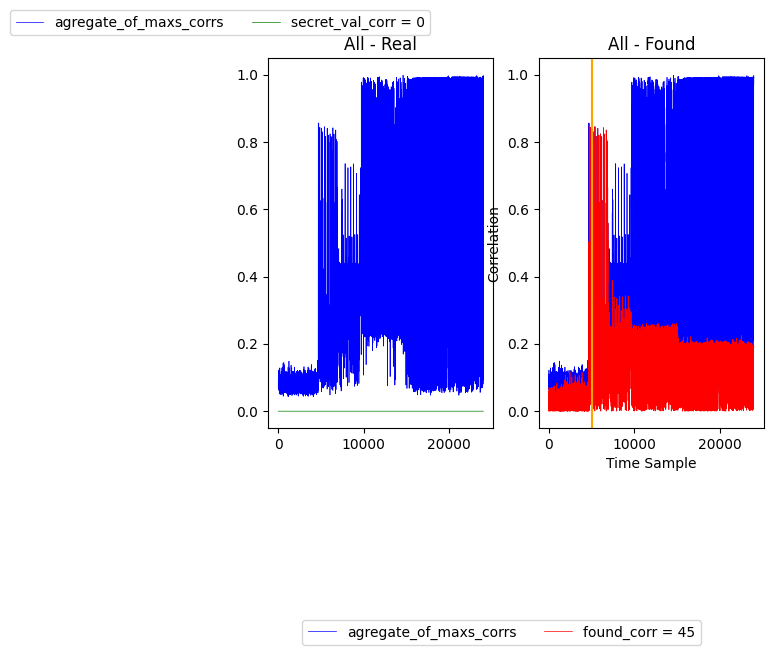

Hello 207
In range 5106 - 24000
 Found the soonest secret value is 45, at the time sample 5122, with correlation secret_corr = 0.767


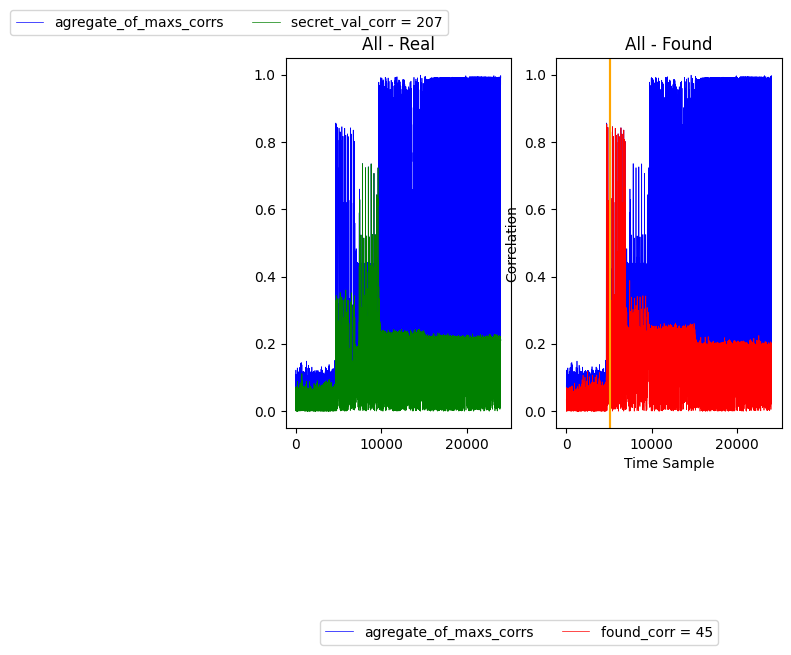

Hello 41
In range 5160 - 24000
 Found the soonest secret value is 45, at the time sample 5198, with correlation secret_corr = 0.807


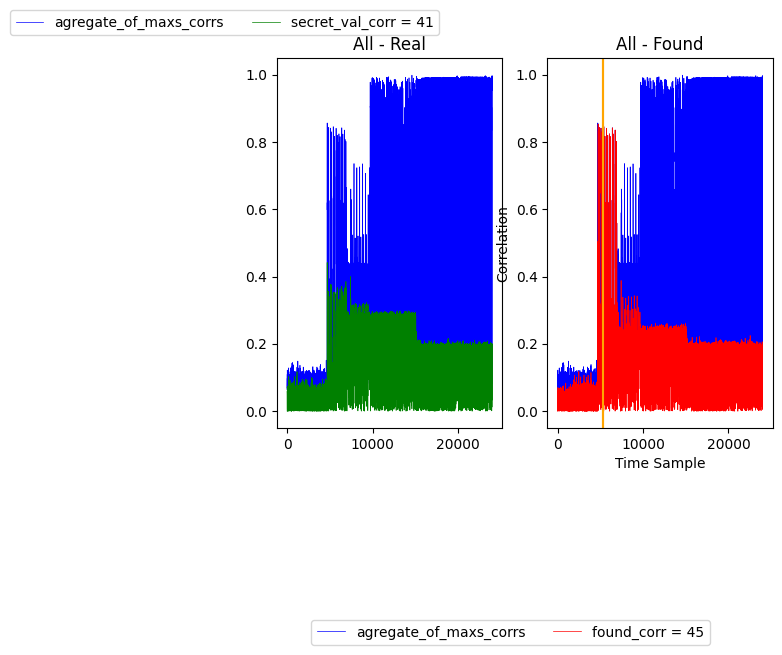

Hello 180
In range 5299 - 24000
 Found the soonest secret value is 45, at the time sample 5401, with correlation secret_corr = 0.845


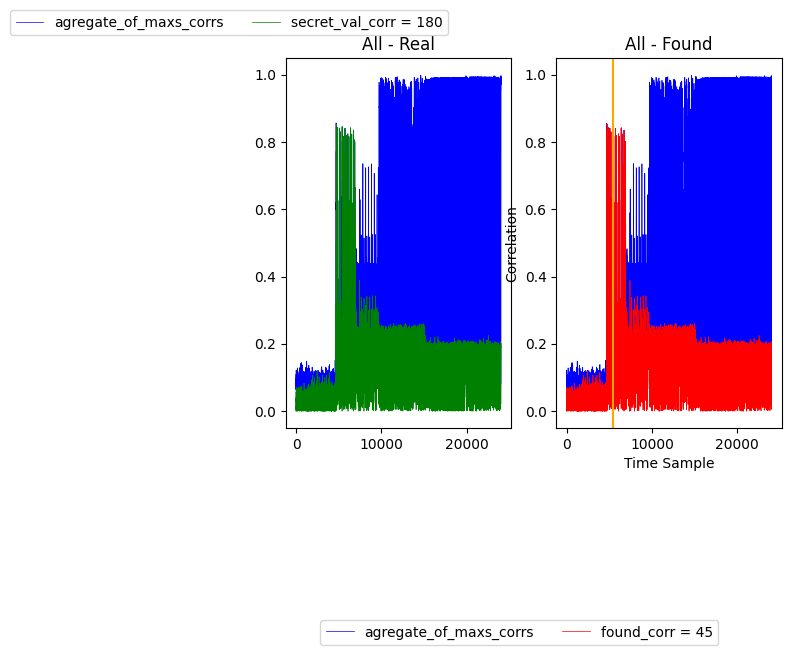

Hello 216
In range 5410 - 24000
 Found the soonest secret value is 45, at the time sample 5418, with correlation secret_corr = 0.716


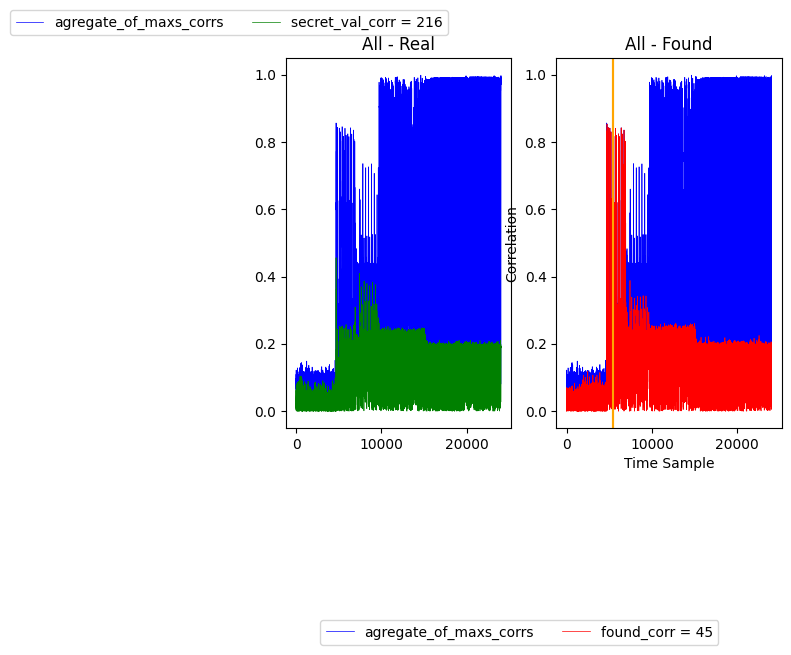

In [13]:
corr_map = abs(np.array(corr1_1000[:,:]))
analyse_corr(corr_map=corr_map, weights=np.array(out)[3:-4], stop_num = 12, maxims_map = None,
                 _index = 0, peak_range = 0.3, show_info=True, mountain_half_dist = 5, level = 3)

##### HW(char)

In [14]:
np.array(out)[3:-4]

array([ 45,  70,   4, 120, 104, 255,  43,   0, 207,  41, 180, 216, 167,
        63, 241,   0,   0,   0,   0,   0], dtype=uint8)

Hello 45
Peak range: 0.4
24000
 Index of global max: 4690 and global_max_val: 0.8562405988994067


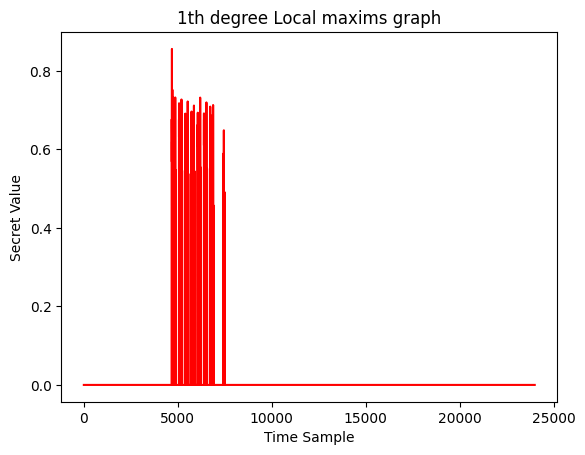

Number of uniques: 10
Number of local maxims: 223
Uniquess: [255, 1, 104, 180, 90, 45, 211, 208, 160, 207]
Local maxims: [255, 255, 255, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 255, 104, 104, 180, 180, 180, 90, 90, 45, 90, 180, 180, 45, 45, 45, 45, 45, 45, 211, 211, 208, 90, 90, 90, 160, 160, 160, 208, 208, 180, 180, 180, 180, 90, 90, 90, 45, 90, 180, 180, 45, 45, 45, 45, 45, 45, 211, 208, 208, 180, 90, 90, 45, 160, 160, 208, 208, 180, 180, 90, 90, 90, 90, 90, 90, 180, 90, 45, 45, 45, 45, 211, 211, 208, 208, 208, 180, 90, 90, 180, 160, 160, 208, 208, 180, 180, 180, 90, 90, 90, 90, 90, 45, 180, 180, 45, 45, 45, 45, 45, 45, 208, 208, 180, 90, 90, 90, 180, 160, 160, 208, 208, 180, 90, 180, 90, 90, 90, 90, 90, 90, 180, 90, 45, 45, 45, 45, 45, 45, 211, 211, 208, 180, 90, 90, 90, 180, 160, 160, 208, 208, 180, 180, 90, 90, 90, 90, 90, 90, 180, 180, 45, 45, 45, 45, 45, 45, 45, 208, 208, 180, 90, 180, 90, 160, 160, 160, 208, 208, 180, 180, 180, 90, 90, 90, 90, 90, 90, 180, 180, 45, 45, 

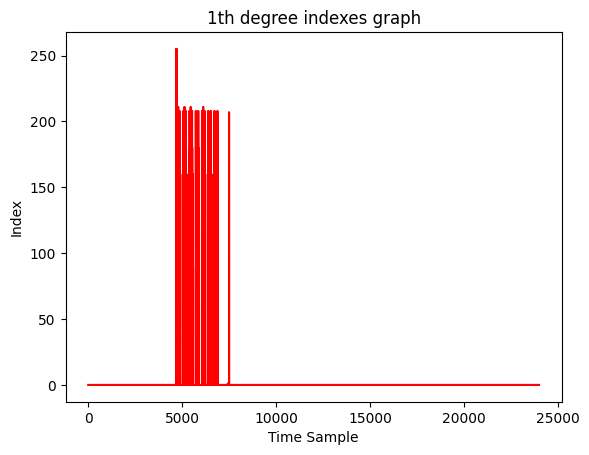

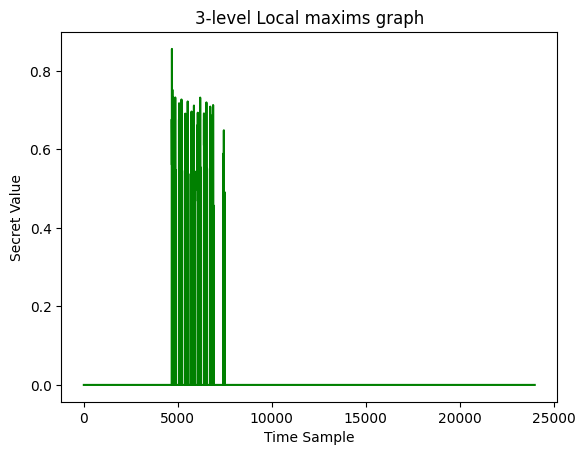

Number of uniques: 10
Number of local maxims: 274
Uniquess: [255, 1, 104, 180, 90, 45, 211, 208, 160, 207]
Local maxims: [255, 255, 255, 255, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 255, 104, 104, 104, 104, 180, 180, 180, 180, 180, 90, 90, 90, 45, 90, 180, 180, 45, 45, 45, 45, 45, 45, 211, 211, 208, 208, 90, 90, 90, 90, 90, 45, 160, 160, 160, 208, 208, 208, 180, 180, 180, 45, 180, 90, 90, 90, 90, 45, 90, 180, 180, 45, 45, 45, 45, 45, 45, 211, 208, 208, 208, 180, 90, 90, 90, 45, 160, 160, 160, 208, 208, 208, 180, 180, 180, 180, 90, 90, 90, 90, 90, 90, 90, 180, 90, 45, 45, 45, 45, 211, 211, 208, 208, 208, 180, 90, 90, 90, 180, 160, 160, 160, 208, 208, 208, 180, 180, 180, 90, 90, 90, 90, 90, 90, 90, 45, 180, 180, 45, 45, 45, 45, 45, 45, 208, 208, 180, 90, 90, 90, 180, 160, 160, 160, 208, 208, 208, 180, 90, 180, 90, 90, 90, 90, 90, 90, 90, 90, 180, 90, 45, 45, 45, 45, 45, 45, 211, 211, 211, 208, 208, 180, 90, 90, 90, 180, 45, 160, 160, 208, 208, 208, 180, 180, 180, 180,

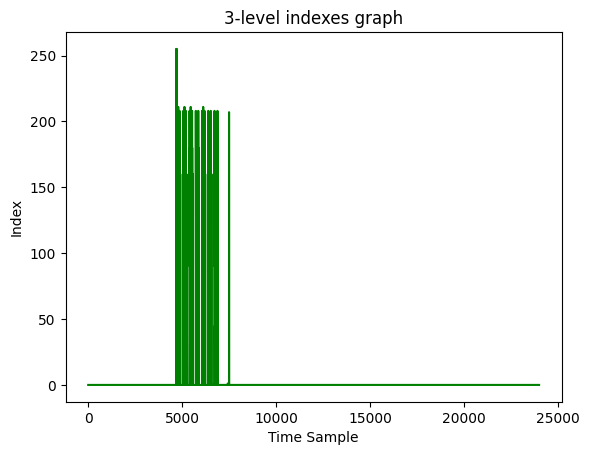

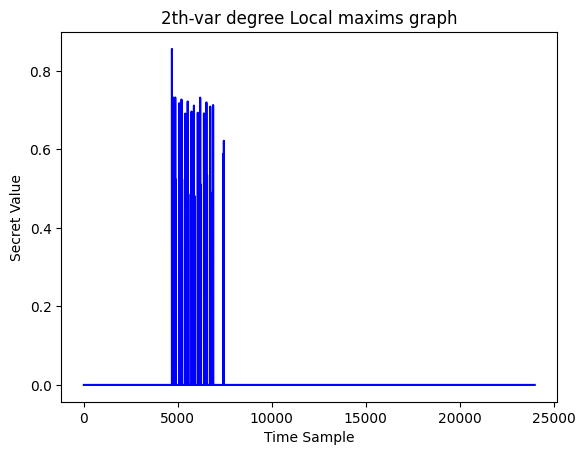

Number of uniques: 6
Number of local maxims: 32
Uniquess: [1, 180, 211, 90, 160, 45]
Local maxims: [1, 1, 180, 211, 90, 160, 180, 45, 180, 160, 90, 45, 211, 180, 160, 90, 45, 180, 160, 90, 211, 180, 160, 180, 45, 180, 160, 90, 45, 180, 1, 1]


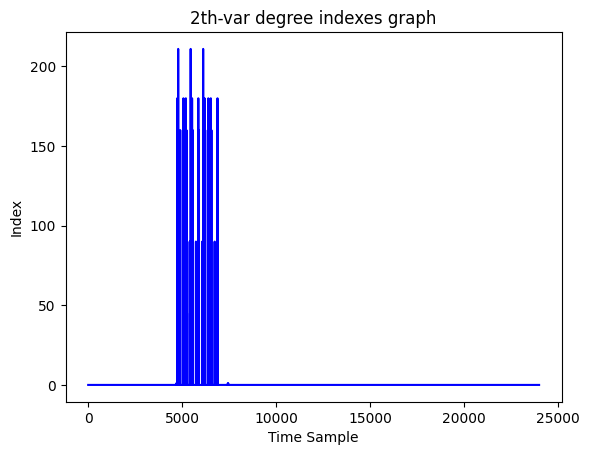

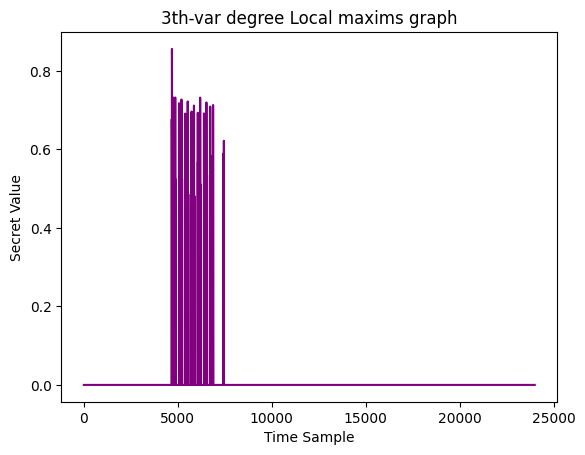

Number of uniques: 8
Number of local maxims: 145
Uniquess: [255, 1, 180, 90, 45, 211, 160, 208]
Local maxims: [255, 255, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 255, 180, 180, 90, 90, 45, 180, 45, 45, 45, 45, 211, 211, 90, 90, 90, 160, 160, 180, 180, 180, 90, 90, 90, 45, 180, 45, 45, 45, 211, 180, 90, 90, 45, 160, 180, 90, 90, 90, 90, 90, 180, 90, 45, 45, 211, 211, 208, 180, 90, 90, 180, 160, 180, 180, 90, 90, 90, 90, 180, 45, 45, 45, 45, 45, 180, 90, 90, 90, 180, 160, 180, 90, 90, 90, 90, 90, 180, 90, 45, 45, 45, 211, 211, 180, 90, 90, 90, 180, 160, 180, 90, 90, 90, 90, 180, 180, 45, 45, 45, 45, 180, 90, 180, 90, 160, 160, 180, 180, 90, 90, 90, 90, 180, 180, 45, 45, 45, 208, 180, 180, 180, 180, 180, 1, 1, 1, 1, 1, 1, 1, 1]


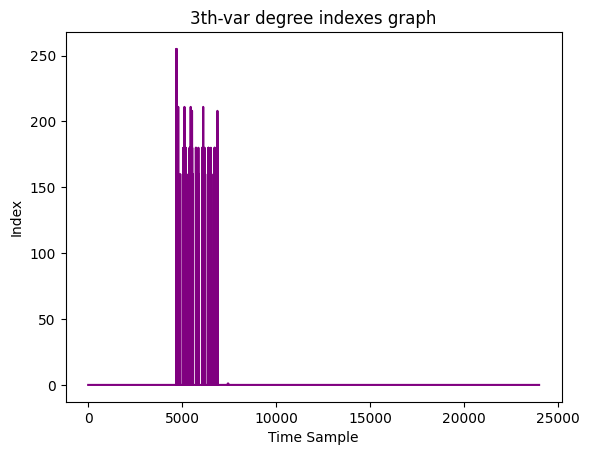

In range 0 - 24000
 Found the soonest secret value is 1, at the time sample 4690, with correlation secret_corr = 0.856


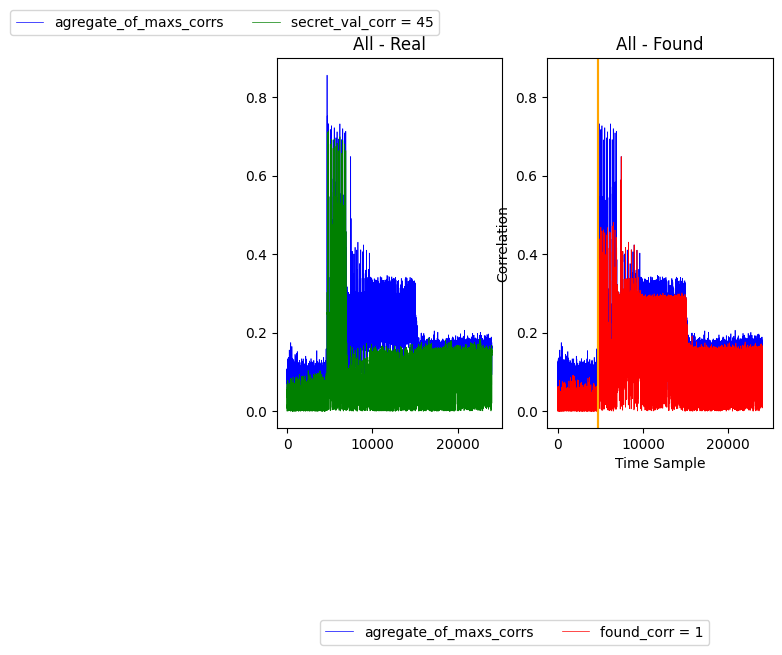

Hello 70
In range 4702 - 24000
 Found the soonest secret value is 1, at the time sample 4714, with correlation secret_corr = 0.720


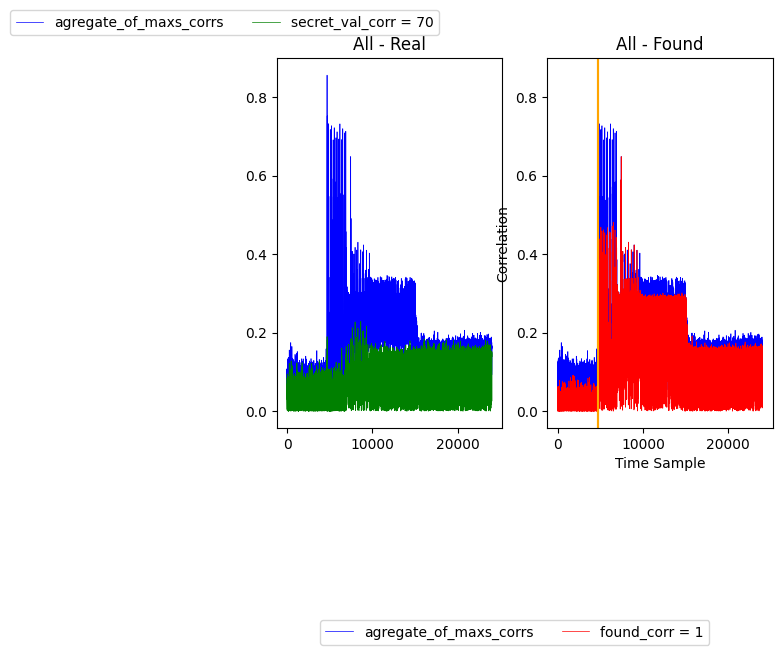

Hello 4
In range 4725 - 24000
 Found the soonest secret value is 180, at the time sample 4737, with correlation secret_corr = 0.733


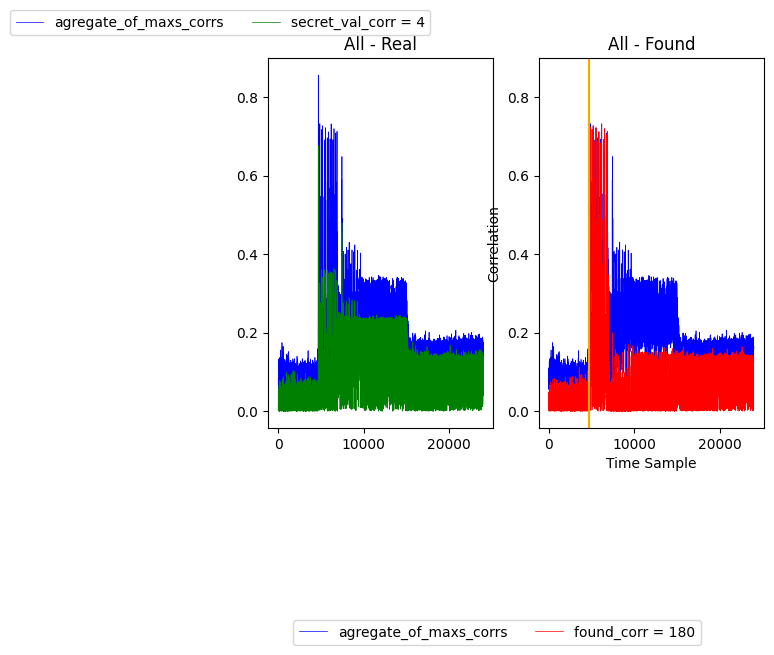

Hello 120
In range 4764 - 24000
 Found the soonest secret value is 211, at the time sample 4790, with correlation secret_corr = 0.502


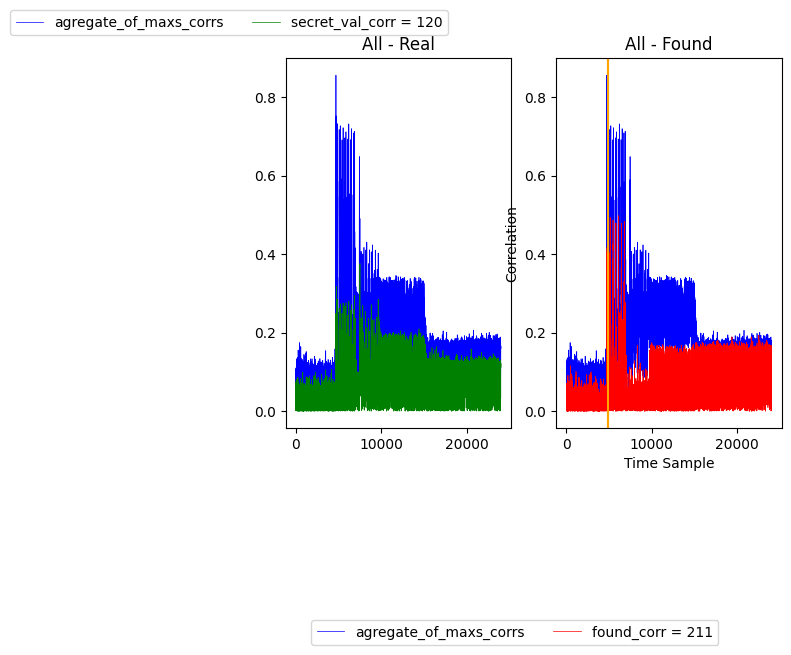

Hello 104
In range 4828 - 24000
 Found the soonest secret value is 90, at the time sample 4866, with correlation secret_corr = 0.733


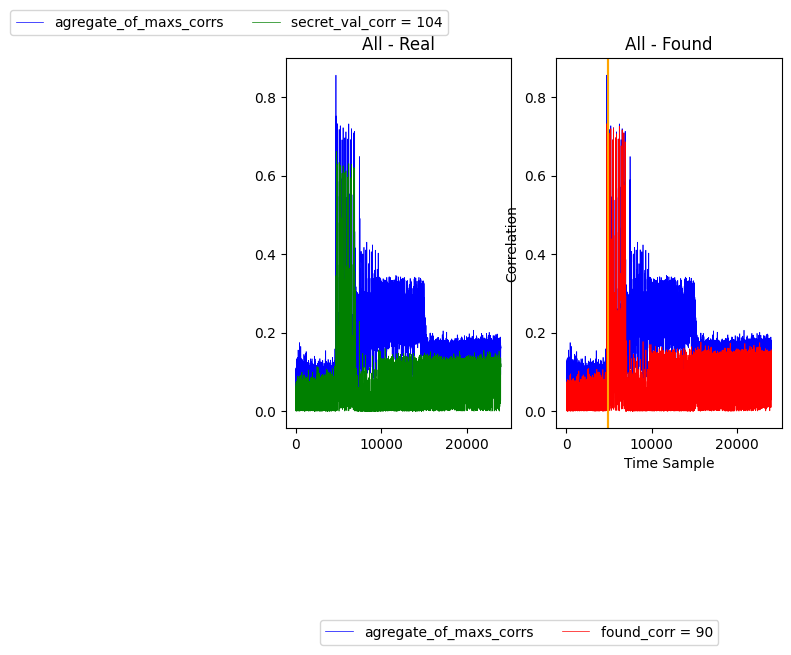

Hello 255
In range 4883 - 24000
 Found the soonest secret value is 160, at the time sample 4899, with correlation secret_corr = 0.523


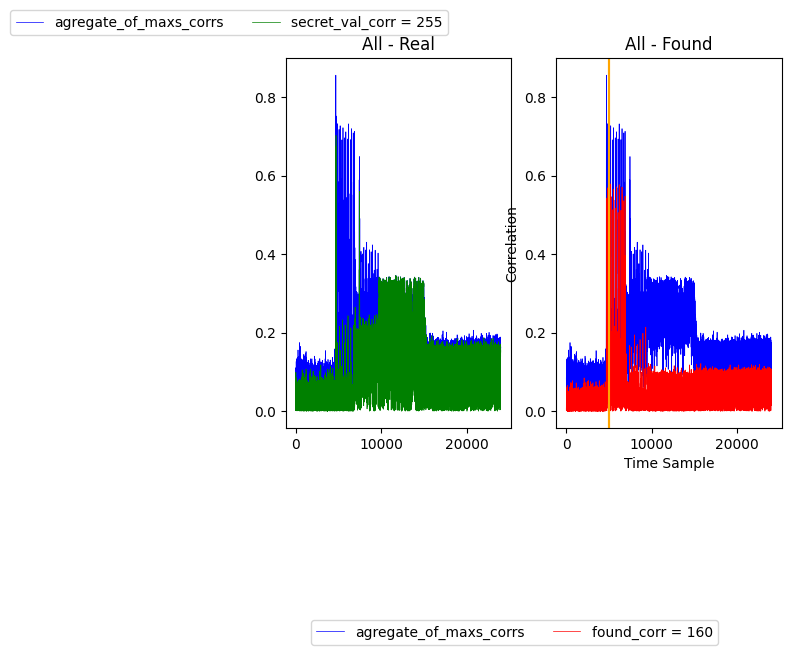

Hello 43
In range 4984 - 24000
 Found the soonest secret value is 180, at the time sample 5069, with correlation secret_corr = 0.718


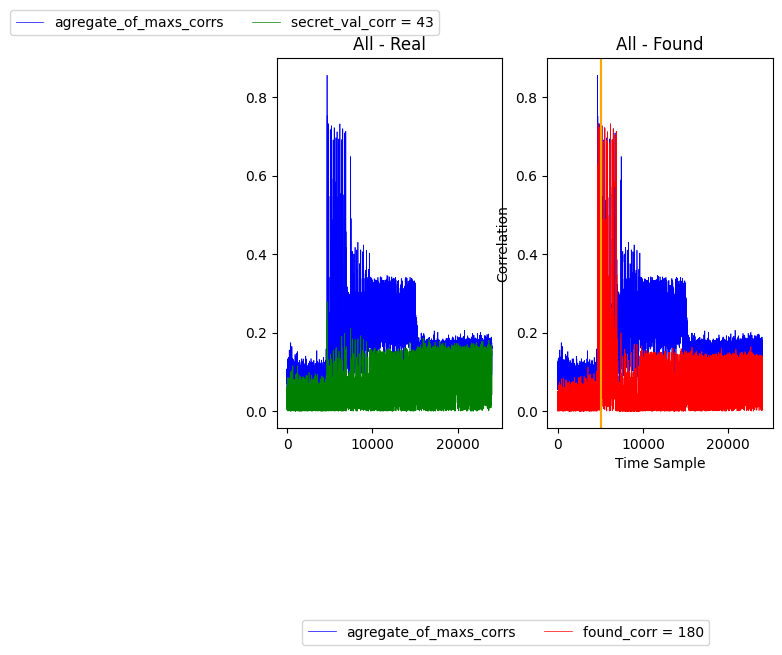

Hello 0
In range 5096 - 24000
 Found the soonest secret value is 45, at the time sample 5122, with correlation secret_corr = 0.479


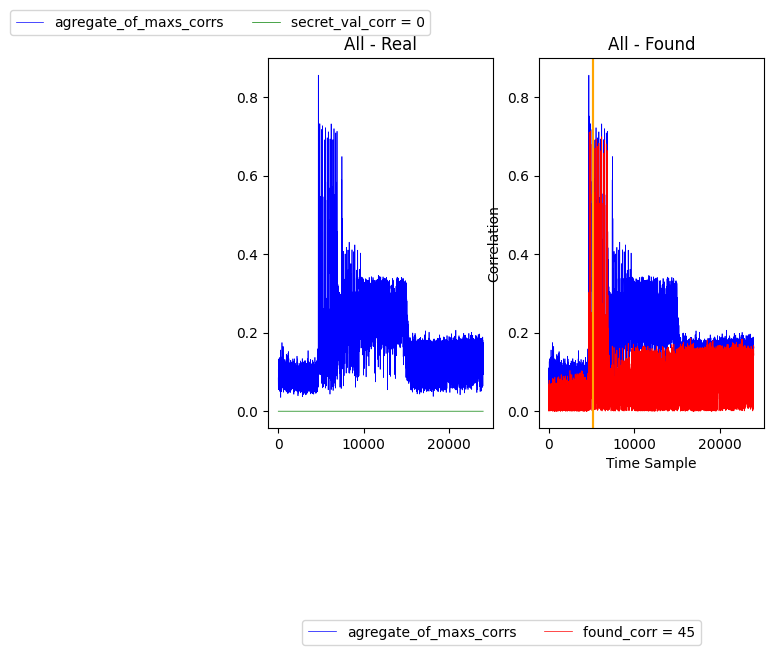

Hello 207
In range 5159 - 24000
 Found the soonest secret value is 180, at the time sample 5197, with correlation secret_corr = 0.727


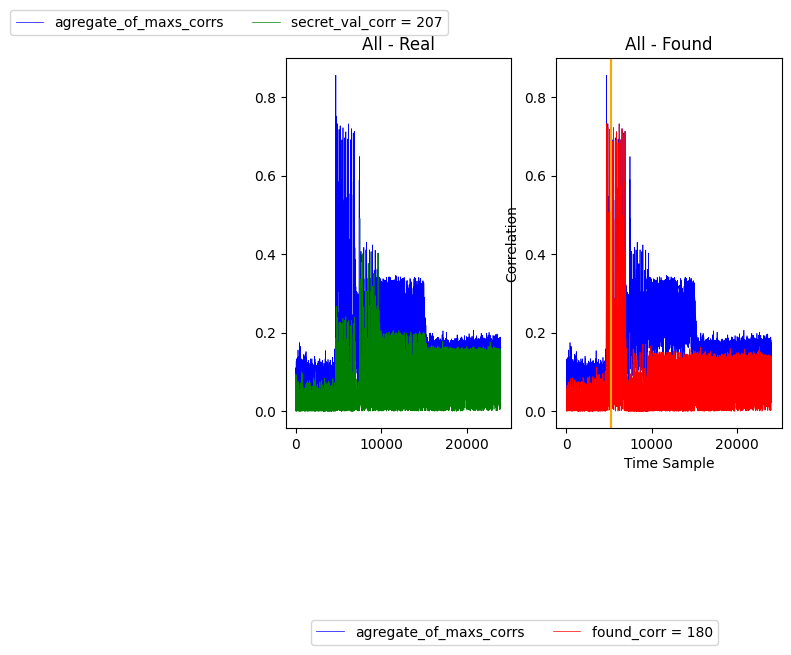

Hello 41
In range 5214 - 24000
 Found the soonest secret value is 160, at the time sample 5231, with correlation secret_corr = 0.524


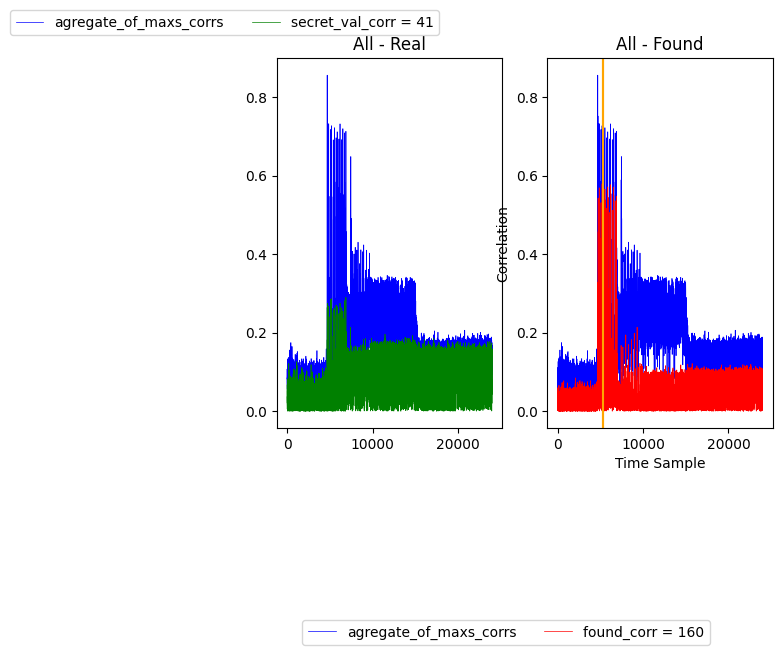

In [15]:
corr_map = abs(np.array(corr2_1000)[:,:])
analyse_corr(corr_map=corr_map, weights=np.array(out)[3:-4], stop_num = 10, maxims_map = None,
                 _index = 0, peak_range = 0.4, show_info=True, mountain_half_dist = 5, level = 3)

##### Abs value int

In [16]:
np.array(out)[3:-4]

array([ 45,  70,   4, 120, 104, 255,  43,   0, 207,  41, 180, 216, 167,
        63, 241,   0,   0,   0,   0,   0], dtype=uint8)

Hello 45
Peak range: 0.3
24000
 Index of global max: 4690 and global_max_val: 0.6688503901813979


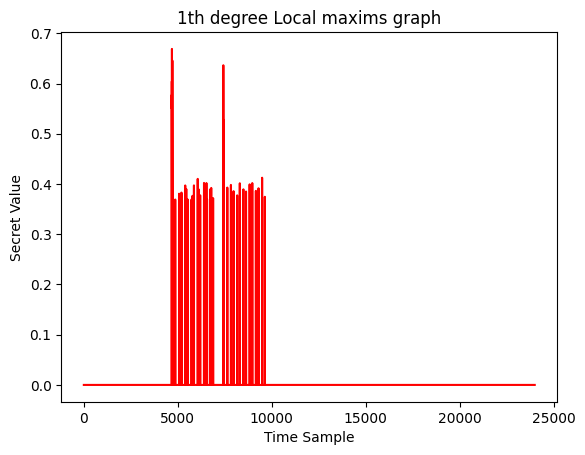

Number of uniques: 33
Number of local maxims: 73
Uniquess: [17, 23, 171, 19, 235, 9, 125, 51, 91, 209, 61, 3, 153, 11, 13, 31, 65, 87, 149, 27, 229, 173, 239, 111, 75, 45, 131, 69, 175, 115, 47, 107, 25]
Local maxims: [17, 23, 171, 19, 235, 9, 17, 125, 51, 91, 209, 61, 3, 153, 11, 13, 31, 65, 87, 153, 3, 61, 17, 65, 149, 19, 3, 149, 17, 27, 13, 87, 9, 229, 61, 11, 173, 239, 229, 111, 17, 235, 75, 45, 131, 69, 175, 115, 9, 11, 115, 3, 9, 75, 47, 131, 17, 69, 17, 175, 11, 11, 27, 65, 23, 45, 65, 11, 107, 25, 13, 13, 17]


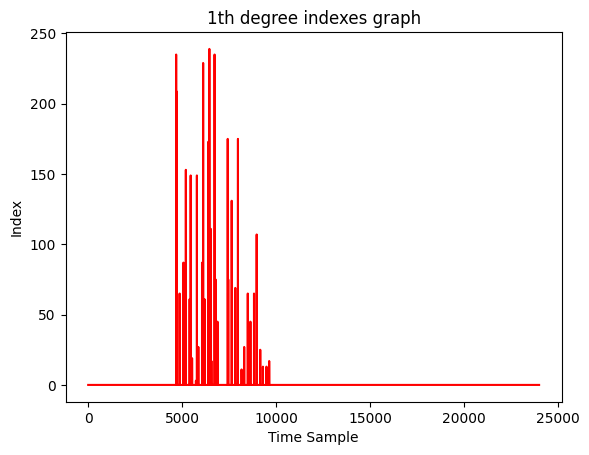

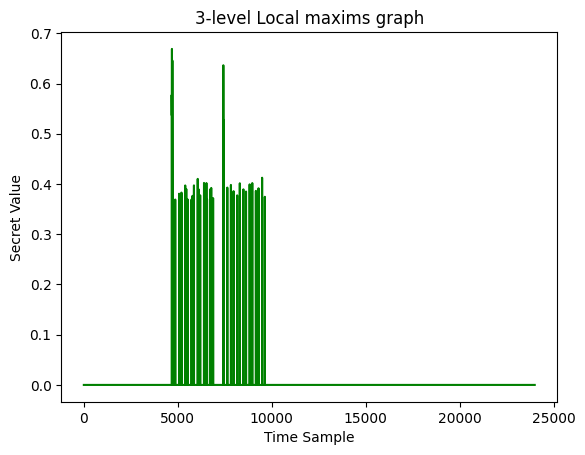

Number of uniques: 34
Number of local maxims: 88
Uniquess: [17, 23, 171, 9, 19, 235, 21, 75, 125, 47, 3, 51, 91, 209, 61, 153, 11, 13, 25, 31, 65, 87, 149, 27, 229, 173, 239, 111, 45, 131, 69, 175, 115, 107]
Local maxims: [17, 23, 171, 9, 19, 235, 9, 21, 17, 75, 125, 47, 3, 51, 91, 209, 51, 61, 3, 153, 11, 13, 25, 31, 65, 87, 153, 3, 61, 17, 65, 149, 19, 3, 149, 17, 27, 9, 13, 87, 9, 229, 61, 11, 173, 239, 229, 111, 17, 17, 235, 75, 45, 51, 87, 131, 13, 69, 175, 115, 9, 11, 115, 3, 9, 75, 47, 131, 17, 69, 17, 175, 11, 21, 11, 27, 65, 23, 45, 65, 17, 11, 107, 25, 9, 13, 13, 17]


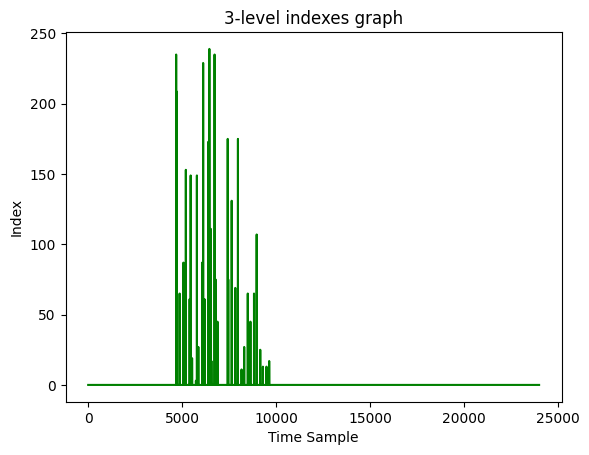

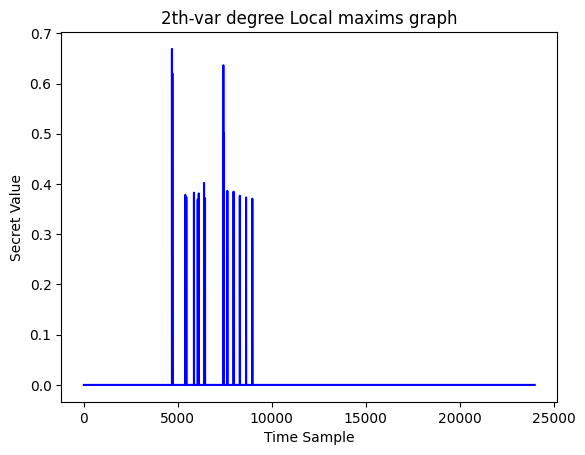

Number of uniques: 14
Number of local maxims: 16
Uniquess: [51, 11, 61, 149, 27, 87, 229, 173, 69, 9, 17, 175, 45, 107]
Local maxims: [51, 11, 61, 149, 27, 87, 229, 173, 229, 69, 9, 17, 175, 27, 45, 107]


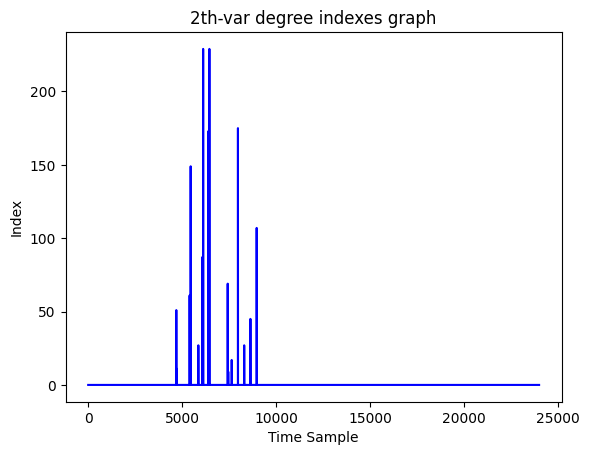

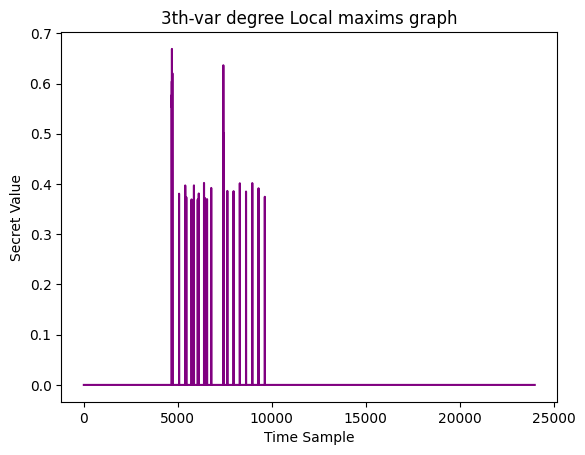

Number of uniques: 25
Number of local maxims: 45
Uniquess: [17, 23, 19, 235, 51, 91, 209, 11, 13, 31, 87, 3, 61, 149, 27, 229, 173, 75, 69, 175, 115, 9, 47, 45, 107]
Local maxims: [17, 23, 19, 235, 17, 51, 91, 209, 11, 13, 31, 87, 3, 61, 17, 149, 3, 17, 27, 87, 229, 173, 229, 17, 75, 69, 175, 115, 9, 11, 115, 9, 75, 47, 17, 17, 175, 11, 27, 23, 45, 11, 107, 13, 17]


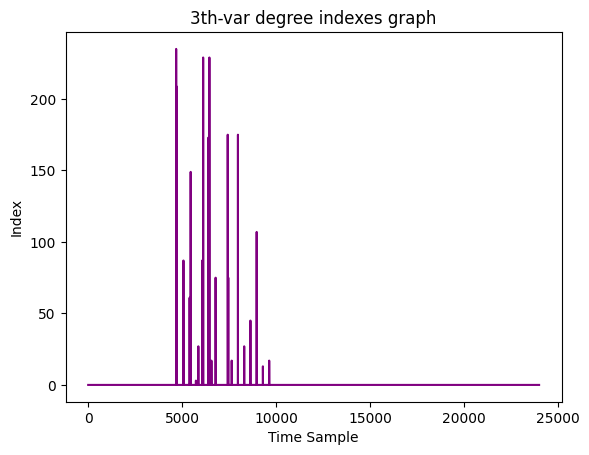

In range 0 - 24000
 Found the soonest secret value is 51, at the time sample 4690, with correlation secret_corr = 0.669


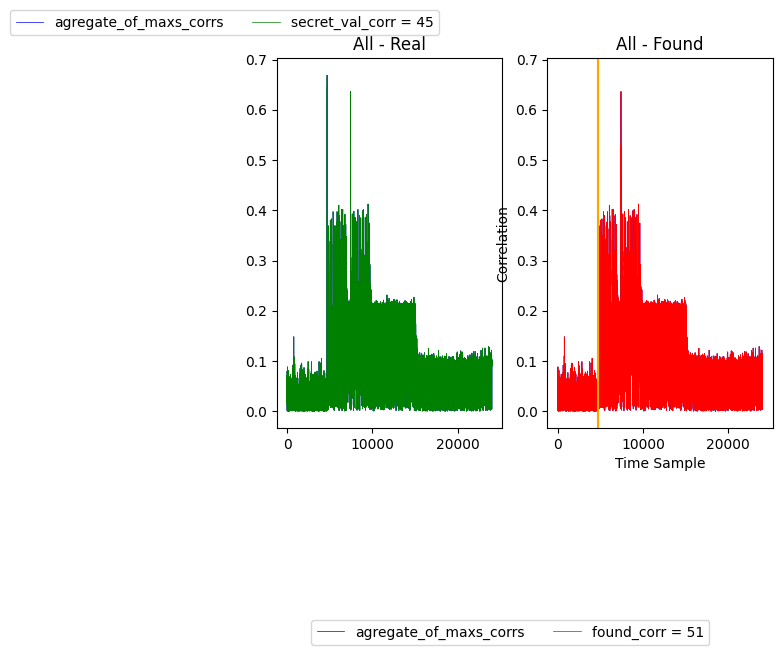

Hello 70
In range 4702 - 24000
 Found the soonest secret value is 11, at the time sample 4714, with correlation secret_corr = 0.620


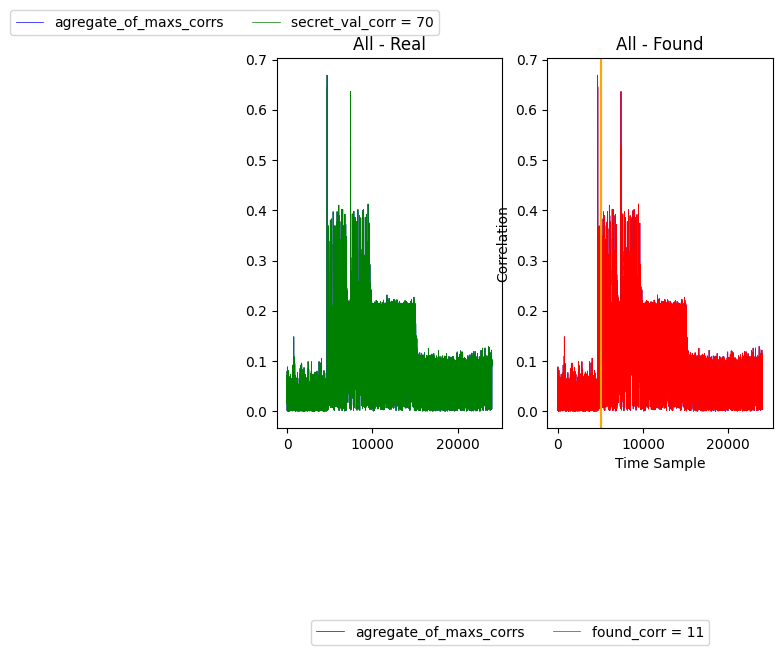

Hello 4
In range 5056 - 24000
 Found the soonest secret value is 61, at the time sample 5398, with correlation secret_corr = 0.378


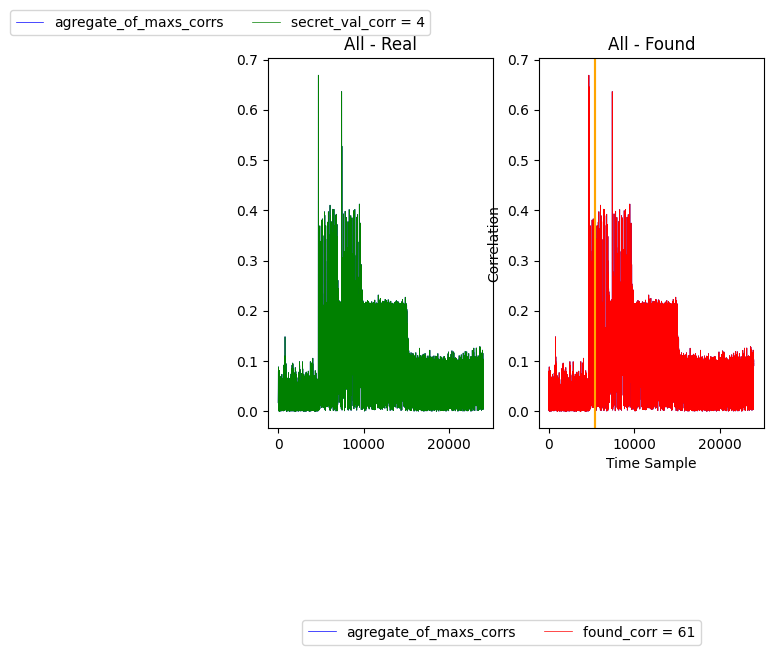

Hello 120
In range 5426 - 24000
 Found the soonest secret value is 149, at the time sample 5454, with correlation secret_corr = 0.374


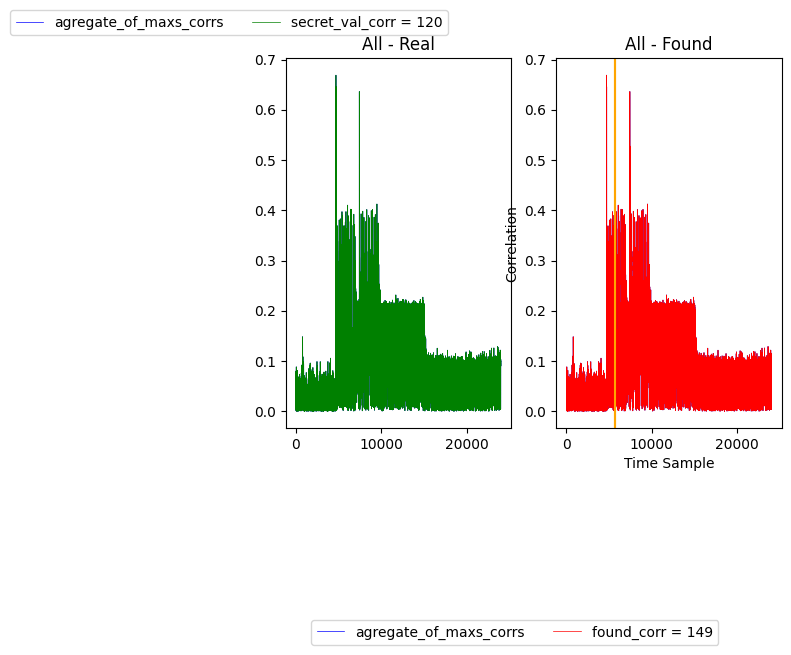

Hello 104
In range 5658 - 24000
 Found the soonest secret value is 27, at the time sample 5862, with correlation secret_corr = 0.383


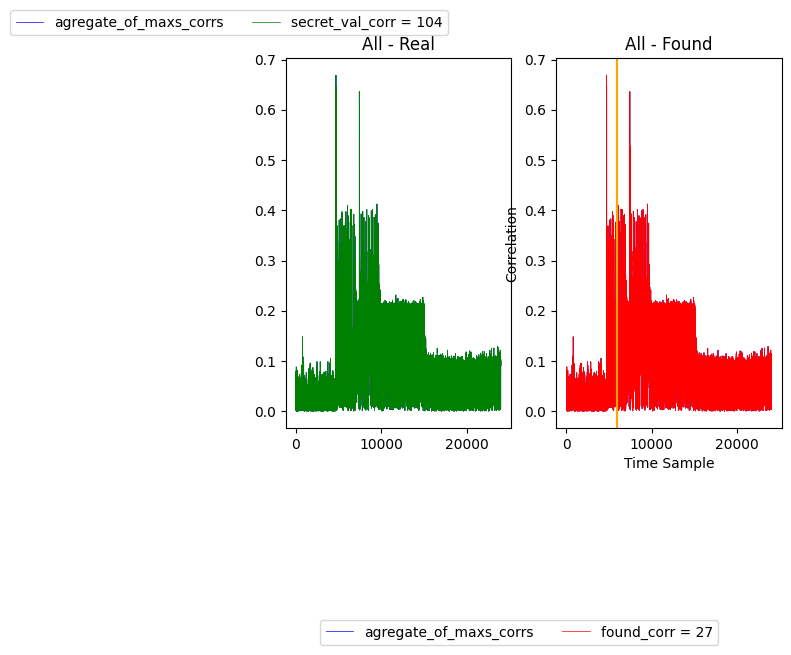

In [17]:
corr_map = abs(np.array(corr3_1000)[:,:])
analyse_corr(corr_map=corr_map, weights=np.array(out)[3:-4], stop_num = 5, maxims_map = None,
                 _index = 0, peak_range = 0.3, show_info=True, mountain_half_dist = 5, level = 3)

##### Abs value char

In [18]:
np.array(out)[3:-4]

array([ 45,  70,   4, 120, 104, 255,  43,   0, 207,  41, 180, 216, 167,
        63, 241,   0,   0,   0,   0,   0], dtype=uint8)

Hello 45
Peak range: 0.3
24000
 Index of global max: 4690 and global_max_val: 0.6688503901813976


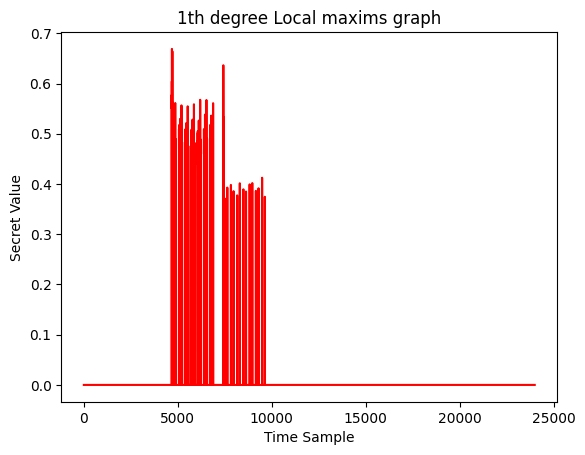

Number of uniques: 10
Number of local maxims: 266
Uniquess: [1, 2, 208, 180, 45, 160, 104, 90, 255, 49]
Local maxims: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 208, 208, 208, 208, 180, 180, 180, 180, 180, 180, 180, 180, 45, 45, 45, 45, 45, 45, 45, 45, 208, 208, 208, 208, 208, 208, 208, 160, 160, 160, 160, 208, 208, 208, 208, 208, 180, 180, 180, 180, 180, 180, 180, 180, 45, 104, 45, 45, 45, 45, 45, 45, 45, 45, 208, 208, 208, 208, 208, 208, 160, 160, 160, 208, 208, 208, 208, 180, 180, 180, 180, 180, 180, 208, 180, 45, 45, 45, 45, 45, 45, 45, 45, 45, 208, 208, 208, 208, 208, 208, 208, 160, 160, 160, 160, 160, 208, 208, 180, 208, 180, 180, 180, 180, 180, 180, 180, 180, 180, 45, 45, 45, 45, 45, 45, 45, 45, 45, 208, 208, 208, 208, 208, 208, 208, 208, 160, 160, 160, 208, 208, 180, 208, 180, 180, 180, 180, 180, 180, 180, 180, 90, 45, 45, 45, 45, 45, 45, 45, 208, 208, 208, 208, 208, 208, 160, 160, 160, 160, 160, 208, 208, 180, 208, 180, 180, 180, 180, 180, 180, 180, 180, 45, 45, 45, 4

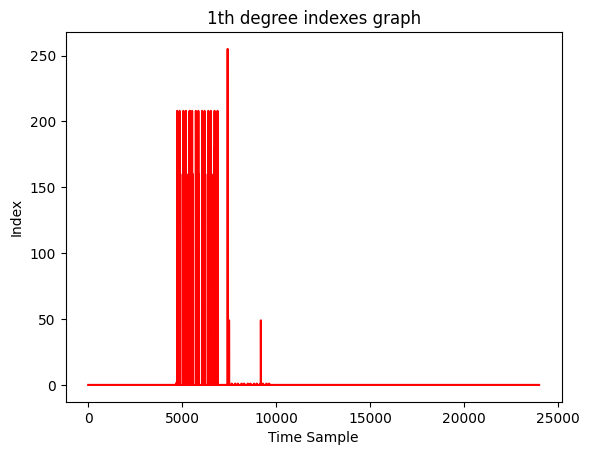

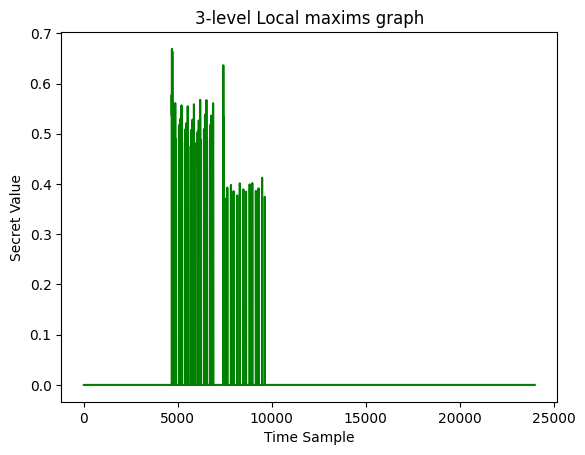

Number of uniques: 11
Number of local maxims: 332
Uniquess: [1, 2, 208, 180, 45, 160, 104, 90, 255, 49, 207]
Local maxims: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 208, 208, 208, 208, 208, 208, 208, 208, 180, 208, 180, 180, 180, 180, 180, 180, 180, 180, 45, 45, 45, 45, 45, 45, 45, 45, 45, 208, 208, 208, 208, 208, 208, 208, 208, 160, 160, 160, 160, 160, 208, 208, 208, 208, 208, 180, 208, 180, 180, 180, 180, 180, 180, 180, 180, 180, 180, 45, 104, 45, 45, 45, 45, 45, 45, 45, 45, 208, 208, 208, 208, 208, 208, 208, 208, 160, 160, 160, 160, 208, 208, 208, 208, 208, 208, 208, 208, 180, 180, 180, 180, 180, 180, 180, 180, 208, 180, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 208, 208, 208, 208, 208, 208, 208, 208, 160, 160, 160, 160, 160, 208, 208, 208, 180, 208, 180, 208, 180, 180, 180, 180, 180, 180, 180, 180, 180, 180, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 208, 208, 208, 208, 208, 208, 208, 208, 160, 160, 160, 160, 208, 208, 208, 180, 208, 180, 180, 180, 180, 18

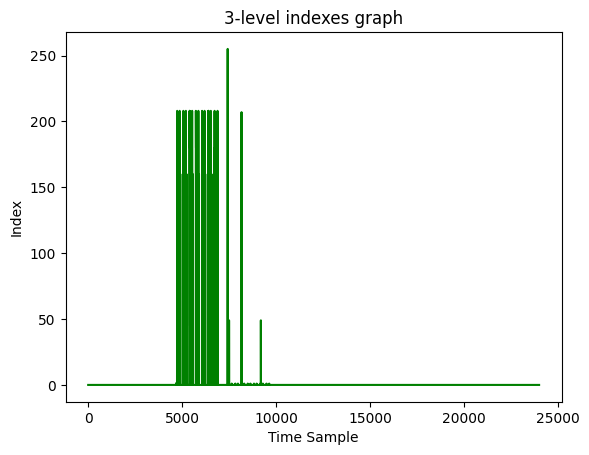

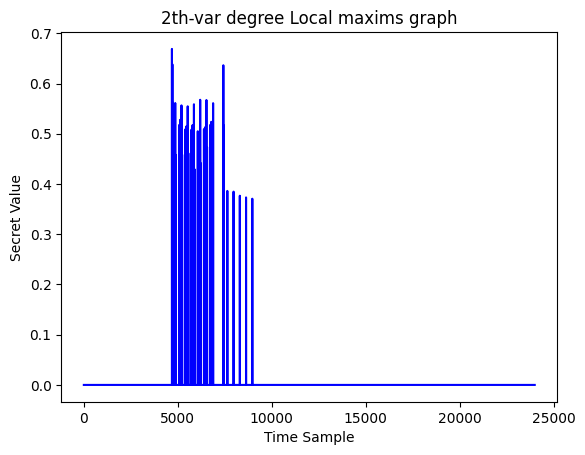

Number of uniques: 6
Number of local maxims: 36
Uniquess: [1, 2, 208, 45, 160, 180]
Local maxims: [1, 2, 208, 45, 208, 160, 180, 45, 208, 160, 208, 45, 208, 160, 180, 45, 208, 160, 180, 45, 208, 160, 180, 45, 208, 160, 208, 45, 208, 1, 2, 1, 1, 1, 1, 1]


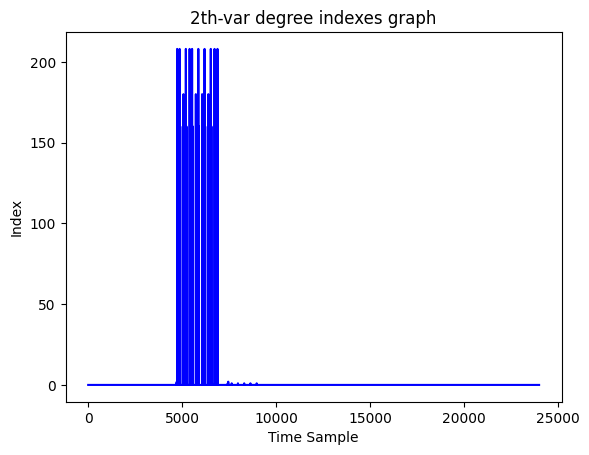

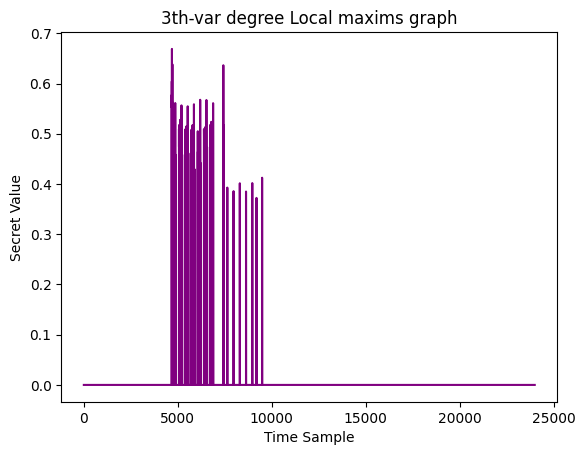

Number of uniques: 8
Number of local maxims: 181
Uniquess: [1, 2, 208, 180, 45, 160, 104, 49]
Local maxims: [1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 208, 208, 180, 180, 180, 180, 180, 45, 45, 45, 45, 45, 45, 45, 208, 208, 208, 208, 208, 160, 160, 160, 208, 208, 208, 180, 180, 180, 180, 45, 104, 45, 45, 45, 45, 45, 45, 208, 208, 208, 208, 160, 160, 208, 180, 180, 180, 180, 180, 208, 45, 45, 45, 45, 45, 45, 45, 208, 208, 208, 208, 208, 160, 160, 160, 160, 180, 208, 180, 180, 180, 180, 180, 45, 45, 45, 45, 45, 45, 45, 208, 208, 208, 208, 208, 208, 160, 160, 180, 208, 180, 180, 180, 180, 180, 45, 45, 45, 45, 45, 45, 208, 208, 208, 208, 160, 160, 160, 160, 180, 180, 180, 180, 180, 45, 45, 45, 45, 45, 45, 45, 45, 208, 208, 208, 208, 208, 208, 160, 160, 208, 208, 180, 180, 180, 180, 180, 45, 45, 45, 45, 45, 45, 45, 45, 208, 208, 208, 208, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 49, 1]


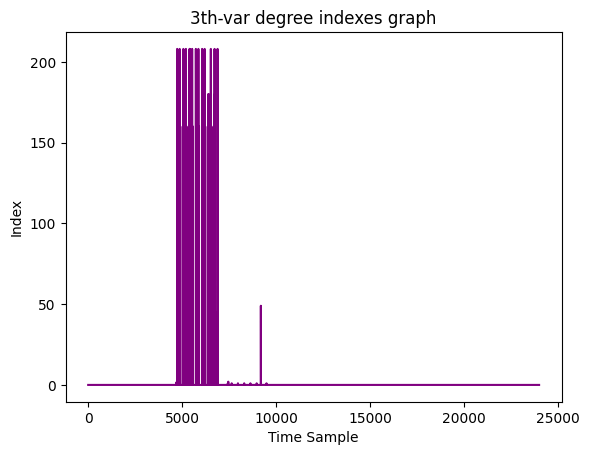

In range 0 - 24000
 Found the soonest secret value is 1, at the time sample 4690, with correlation secret_corr = 0.669


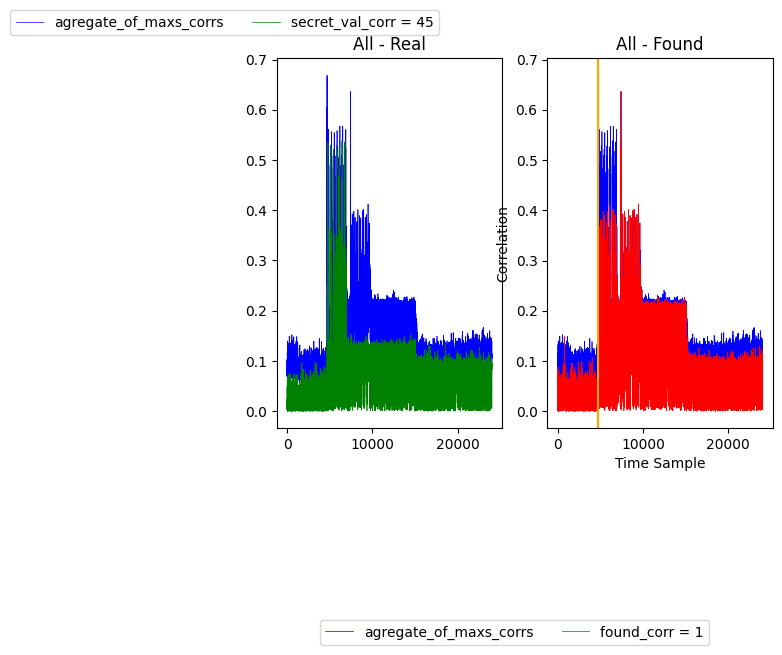

Hello 70
In range 4702 - 24000
 Found the soonest secret value is 2, at the time sample 4714, with correlation secret_corr = 0.638


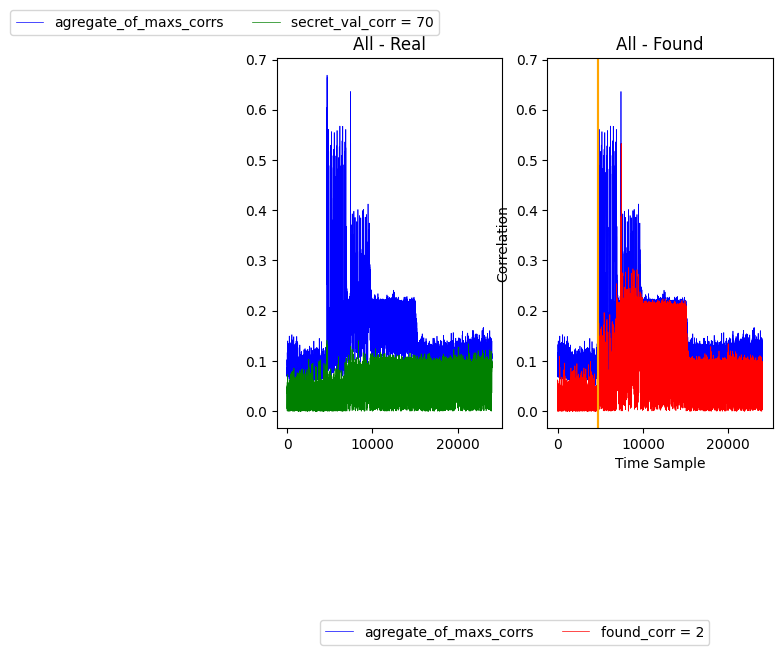

Hello 4
In range 4724 - 24000
 Found the soonest secret value is 208, at the time sample 4734, with correlation secret_corr = 0.562


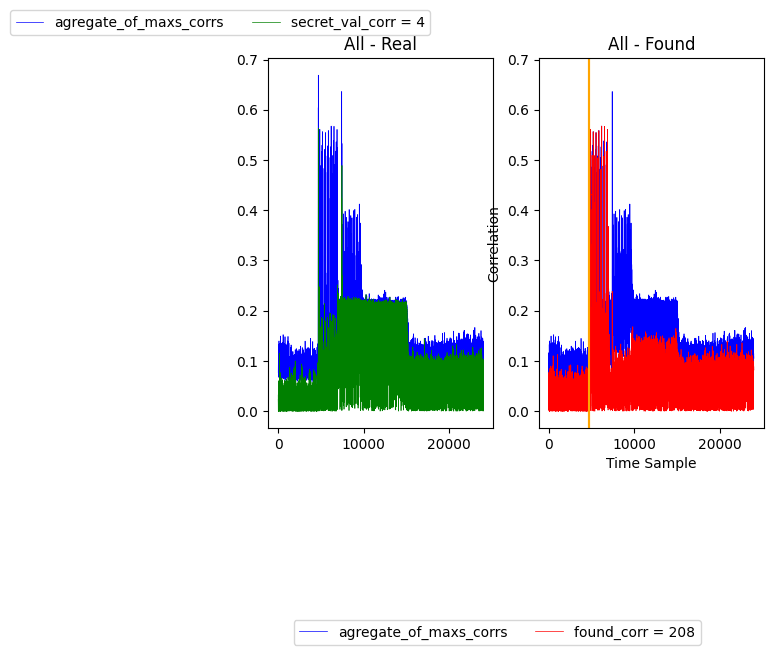

Hello 120
In range 4762 - 24000
 Found the soonest secret value is 45, at the time sample 4790, with correlation secret_corr = 0.524


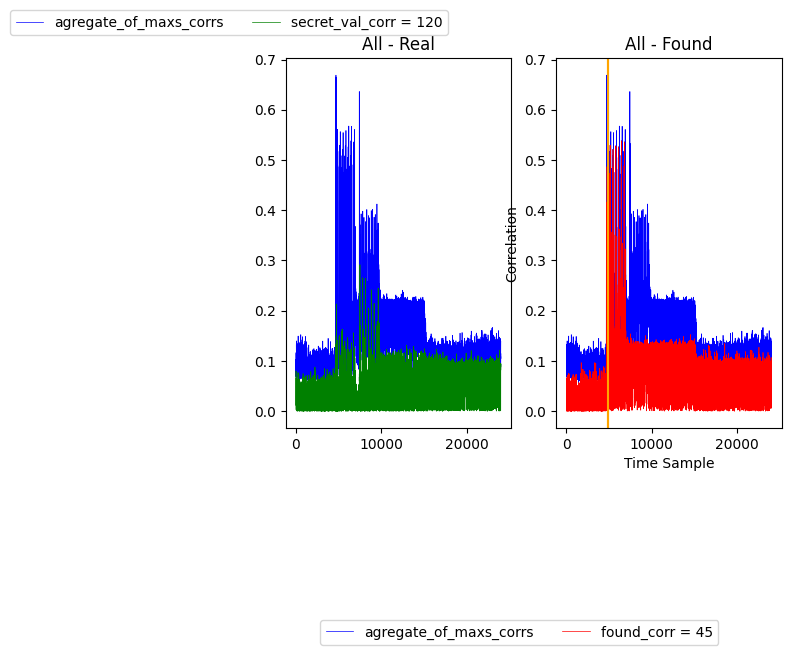

Hello 104
In range 4827 - 24000
 Found the soonest secret value is 208, at the time sample 4865, with correlation secret_corr = 0.561


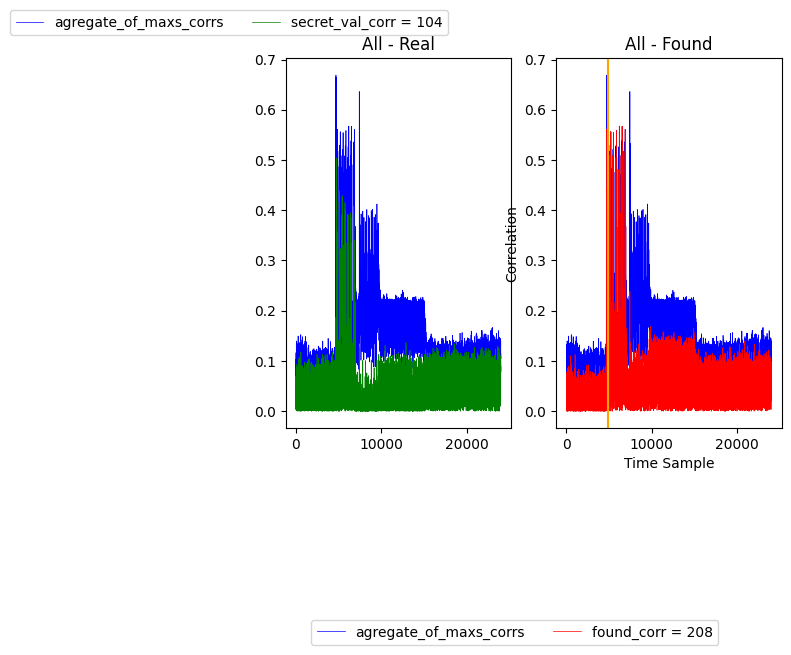

Hello 255
In range 4882 - 24000
 Found the soonest secret value is 160, at the time sample 4899, with correlation secret_corr = 0.458


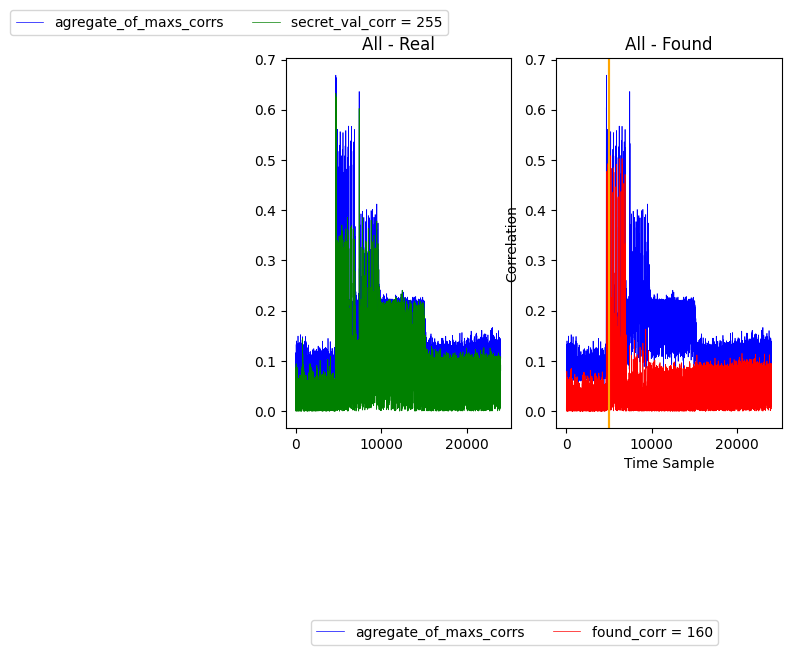

Hello 43
In range 4984 - 24000
 Found the soonest secret value is 180, at the time sample 5069, with correlation secret_corr = 0.517


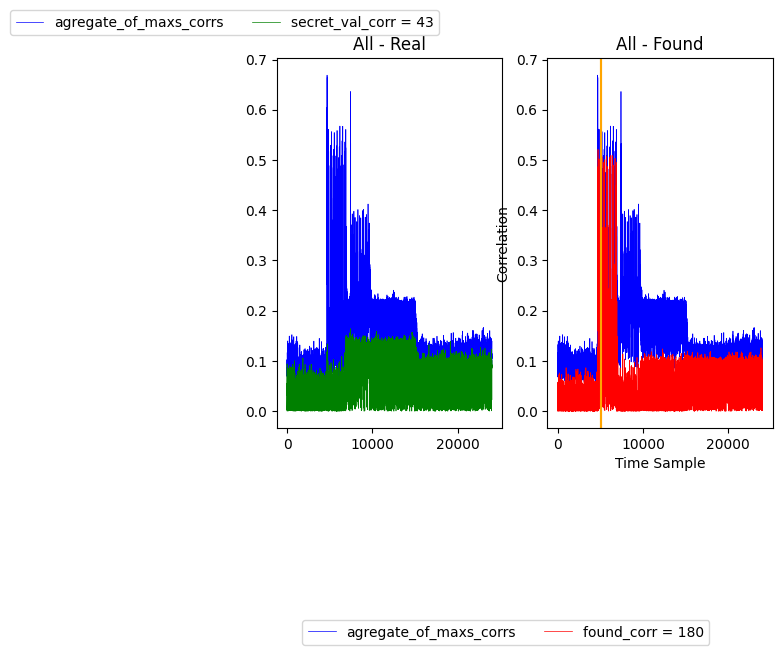

Hello 0
In range 5096 - 24000
 Found the soonest secret value is 45, at the time sample 5122, with correlation secret_corr = 0.528


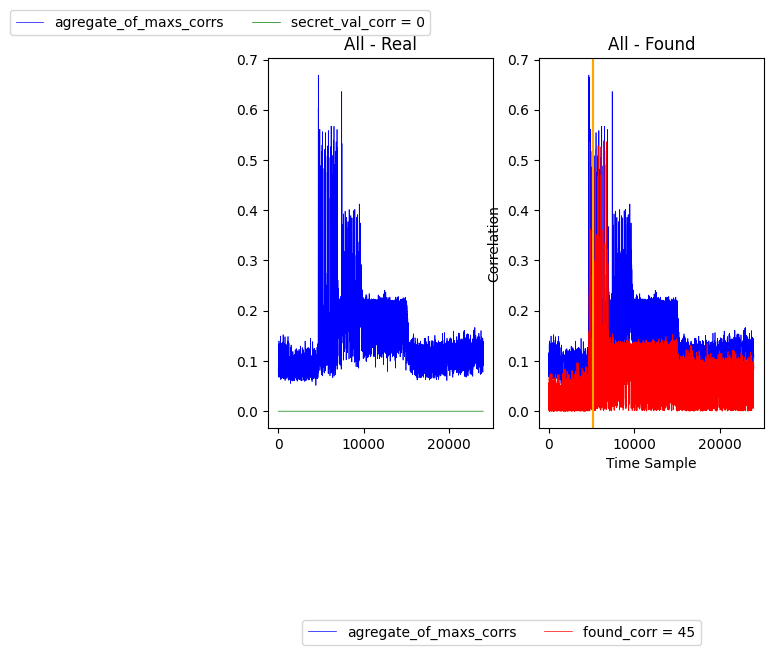

Hello 207
In range 5159 - 24000
 Found the soonest secret value is 208, at the time sample 5197, with correlation secret_corr = 0.556


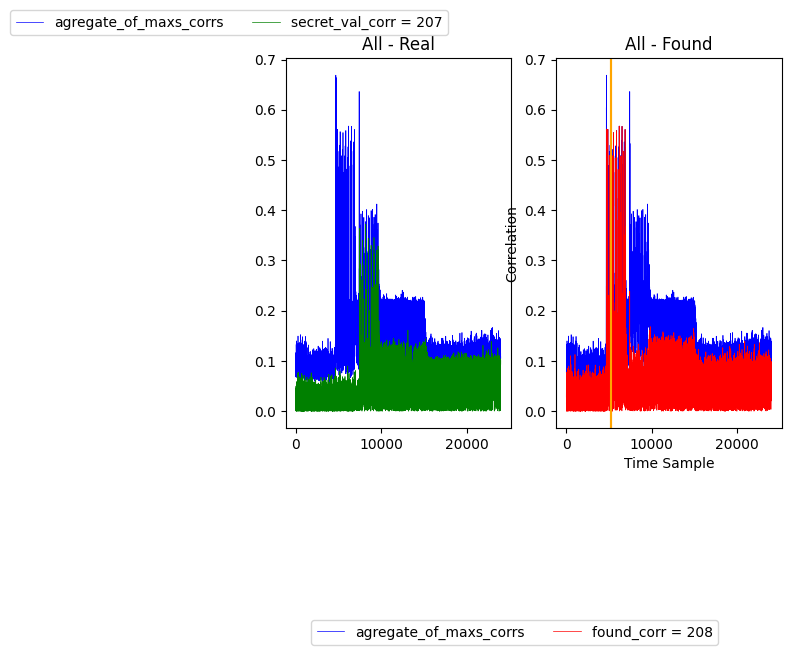

Hello 41
In range 5214 - 24000
 Found the soonest secret value is 160, at the time sample 5231, with correlation secret_corr = 0.458


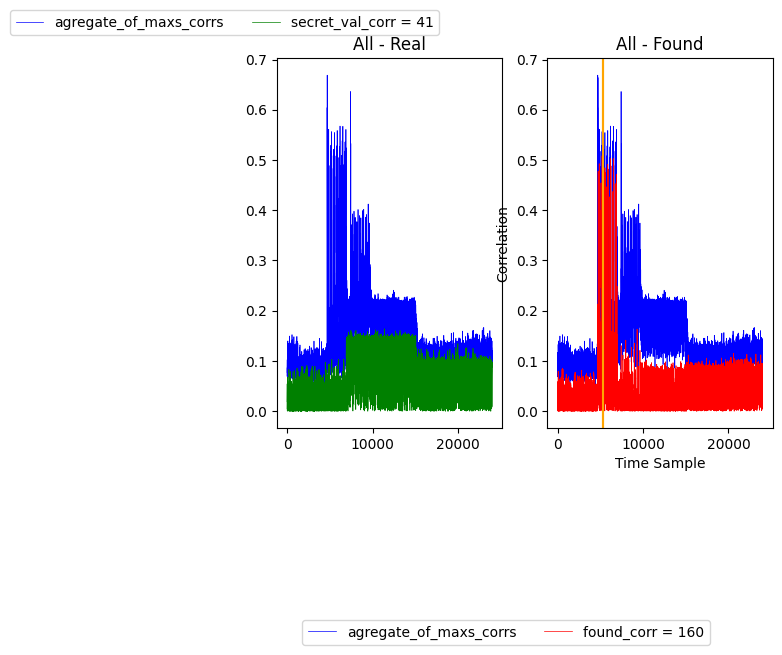

In [19]:
corr_map = abs(np.array(corr4_1000)[:,:])
analyse_corr(corr_map=corr_map, weights=np.array(out)[3:-4], stop_num = 10, maxims_map = None,
                 _index = 0, peak_range = 0.3, show_info=True, mountain_half_dist = 5, level = 3)

## Inbuild functions, with HW(char)

In [64]:
in_corr1 = corr_2TraceMatrixes(np.array(waves), np.array(rand_input), n_traces = 1000, secret_range = 256, corr_func = np.corrcoef)
plot_mult(abs(np.array(in_corr1)[:,:,1,0]), _type = "tmp", ylim=[-1,1])

Calculating Correlations for secret key:   0%|          | 0/256 [00:00<?, ?it/s]

C:\Users\Samuel\PycharmProjects\chipwhisperer-jupyter\.venv\lib\site-packages\numpy\lib\_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\Samuel\PycharmProjects\chipwhisperer-jupyter\.venv\lib\site-packages\numpy\lib\_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [ ]:
in_sc_corr1 = sc_pearson_2TraceMatrixes(np.array(waves), np.array(rand_input), n_traces = 1000, secret_range = 256, trace_len = 10000)
plot_mult(abs(np.array(in_sc_corr1)[:,:,1,0]), _type = "tmp", ylim=[-1,1])

In [ ]:
np.array(out)[3:-4]

##### in_corr1 analyis

- In this case, first and first after 0 are target weights

Hello 45
Peak range: 0.4
24000
 Index of global max: 4690 and global_max_val: 0.8509640762240375


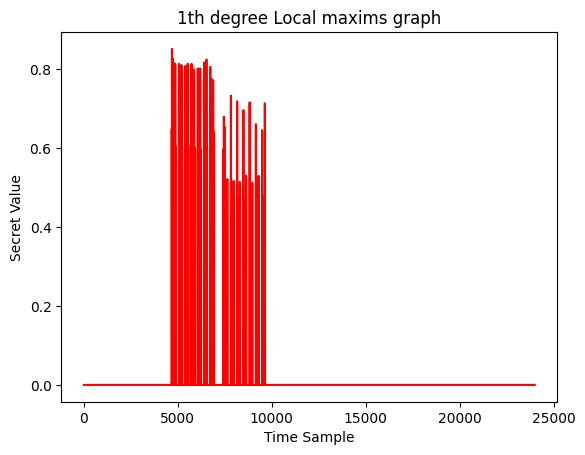

Number of uniques: 6
Number of local maxims: 282
Uniquess: [129, 1, 45, 93, 207, 103]
Local maxims: [129, 129, 129, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 129, 129, 129, 129, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 93, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 93, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 93, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 1, 1, 1, 1

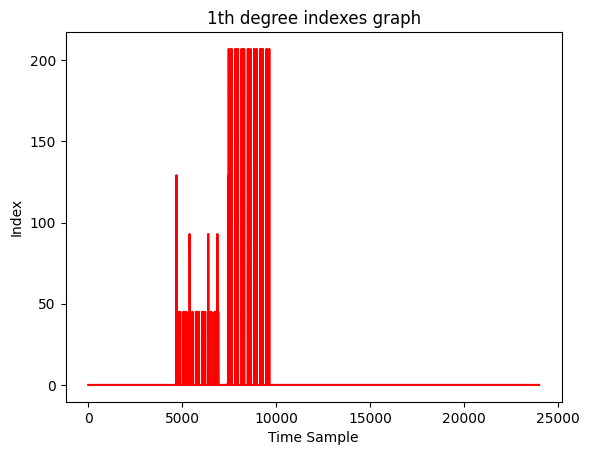

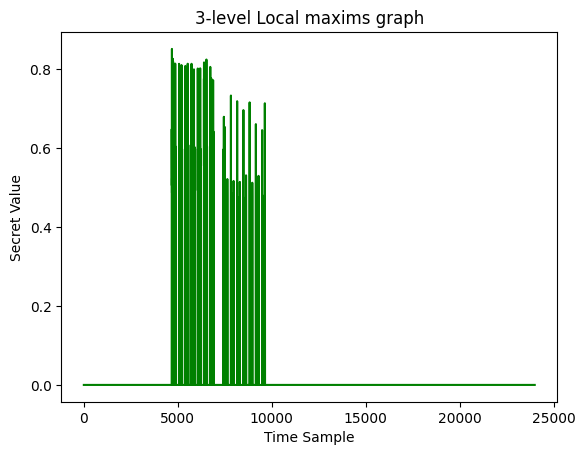

Number of uniques: 6
Number of local maxims: 347
Uniquess: [129, 1, 45, 93, 207, 103]
Local maxims: [129, 129, 129, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 129, 129, 129, 129, 129, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 93, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 93, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 4

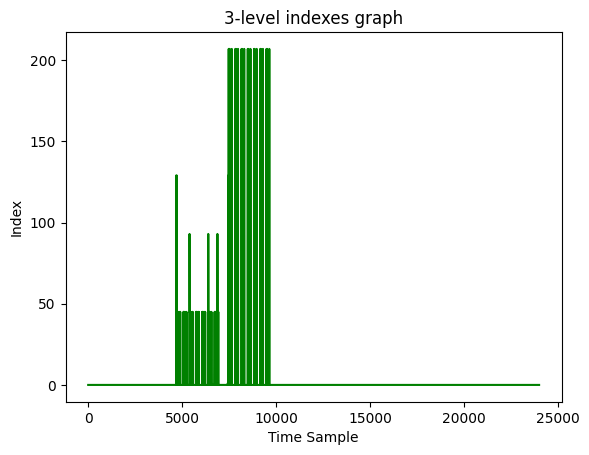

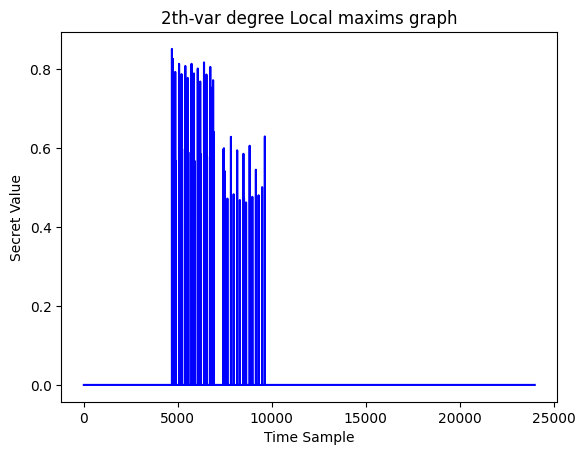

Number of uniques: 5
Number of local maxims: 50
Uniquess: [1, 129, 45, 207, 103]
Local maxims: [1, 129, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 1, 129, 207, 207, 207, 207, 207, 207, 207, 103, 207, 207, 207, 207, 207, 207, 207, 207, 207]


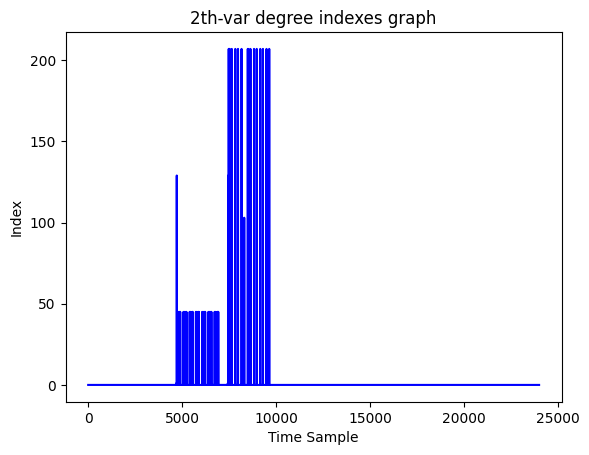

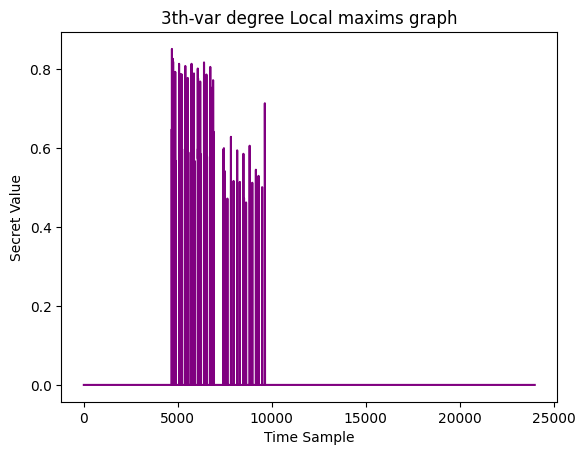

Number of uniques: 5
Number of local maxims: 186
Uniquess: [129, 1, 45, 207, 103]
Local maxims: [129, 129, 1, 1, 1, 1, 1, 1, 1, 1, 129, 129, 129, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 1, 1, 1, 1, 1, 129, 129, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 103, 207, 207, 207, 103, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207, 207]


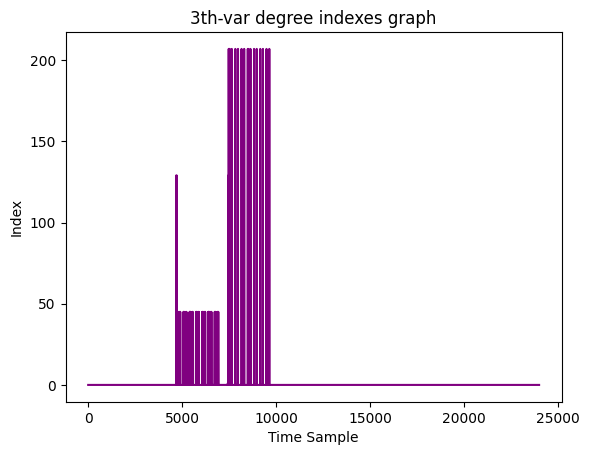

In range 0 - 24000
 Found the soonest secret value is 1, at the time sample 4690, with correlation secret_corr = 0.851


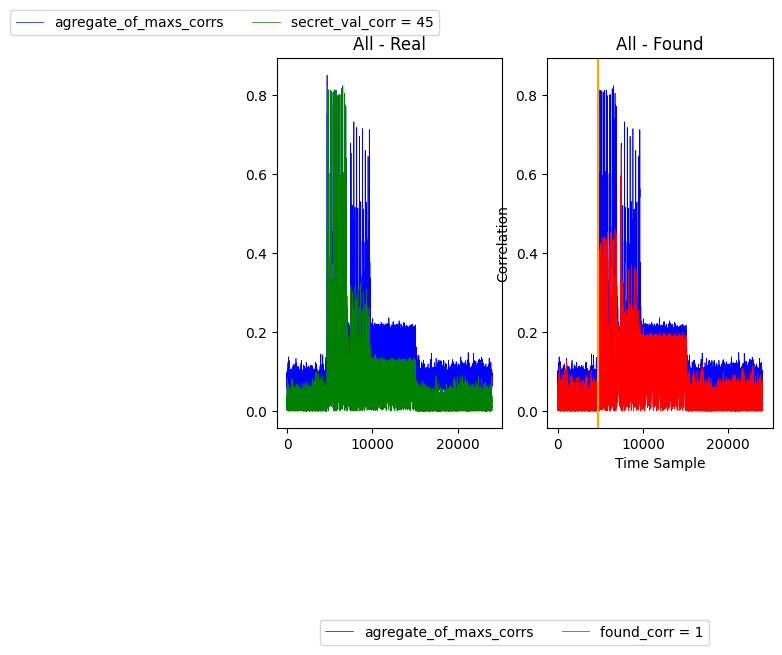

Hello 70
In range 4702 - 24000
 Found the soonest secret value is 129, at the time sample 4714, with correlation secret_corr = 0.739


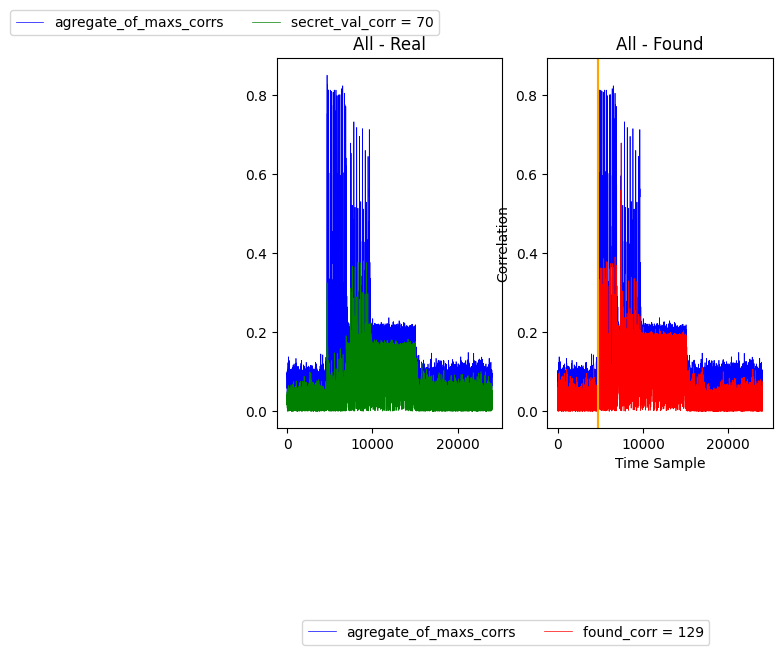

Hello 4
In range 4725 - 24000
 Found the soonest secret value is 45, at the time sample 4737, with correlation secret_corr = 0.826


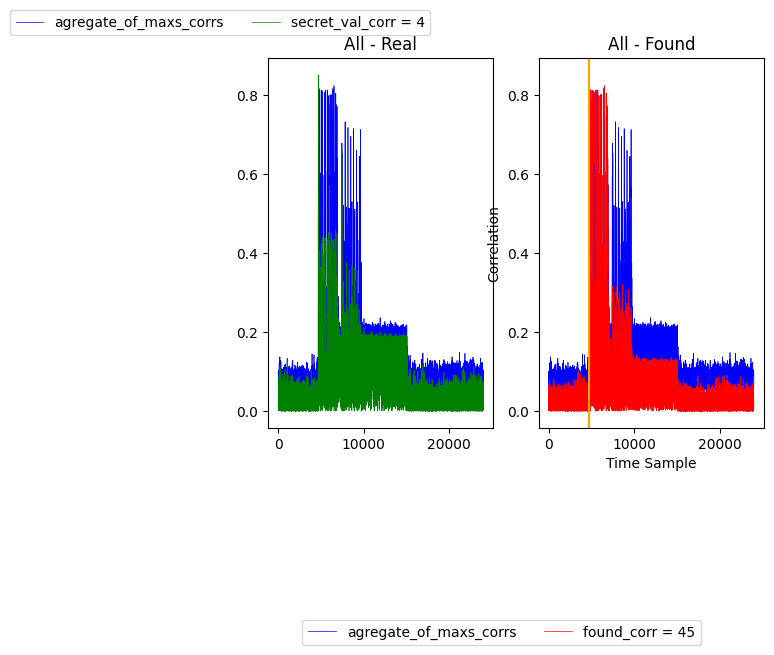

Hello 120
In range 4764 - 24000
 Found the soonest secret value is 45, at the time sample 4790, with correlation secret_corr = 0.723


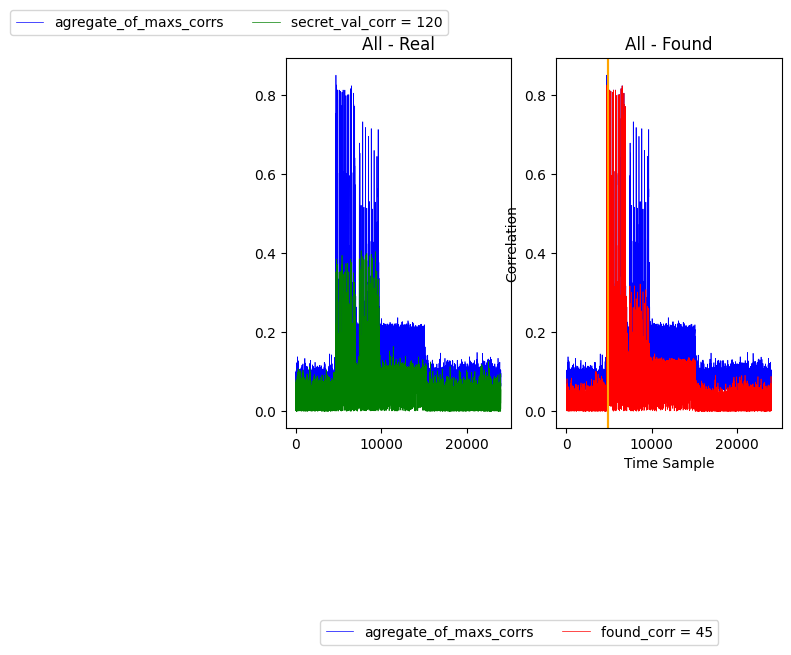

Hello 104
In range 4828 - 24000
 Found the soonest secret value is 45, at the time sample 4866, with correlation secret_corr = 0.793


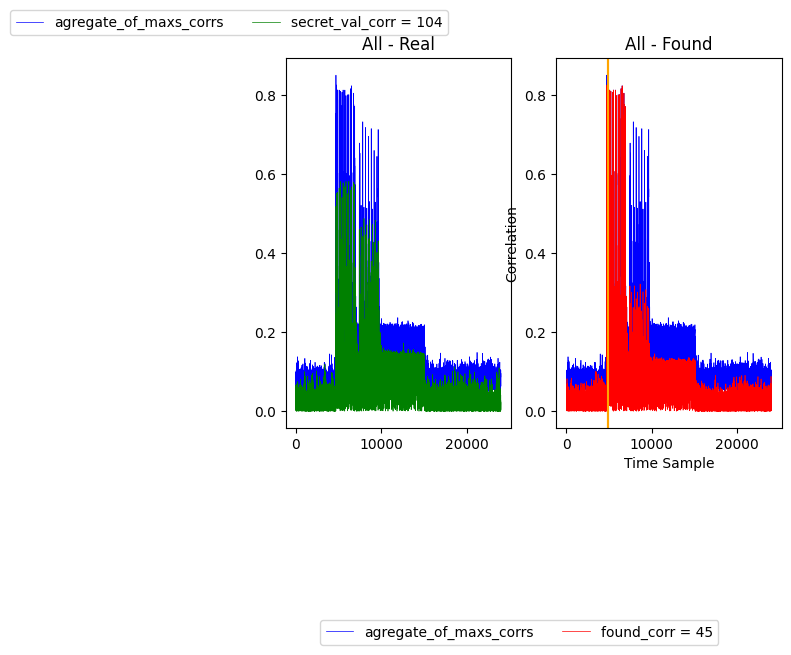

Hello 255
In range 4882 - 24000
 Found the soonest secret value is 45, at the time sample 4898, with correlation secret_corr = 0.567


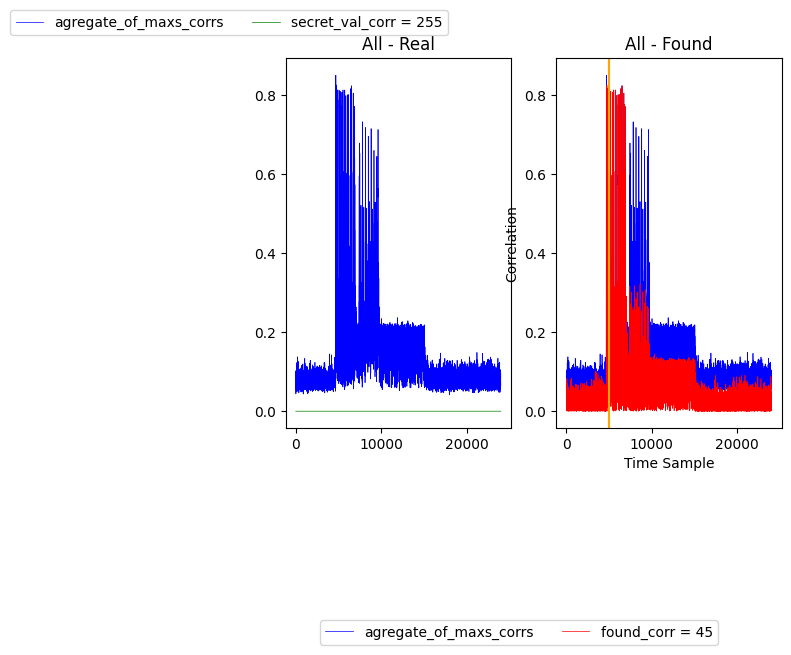

Hello 43
In range 4983 - 24000
 Found the soonest secret value is 45, at the time sample 5069, with correlation secret_corr = 0.813


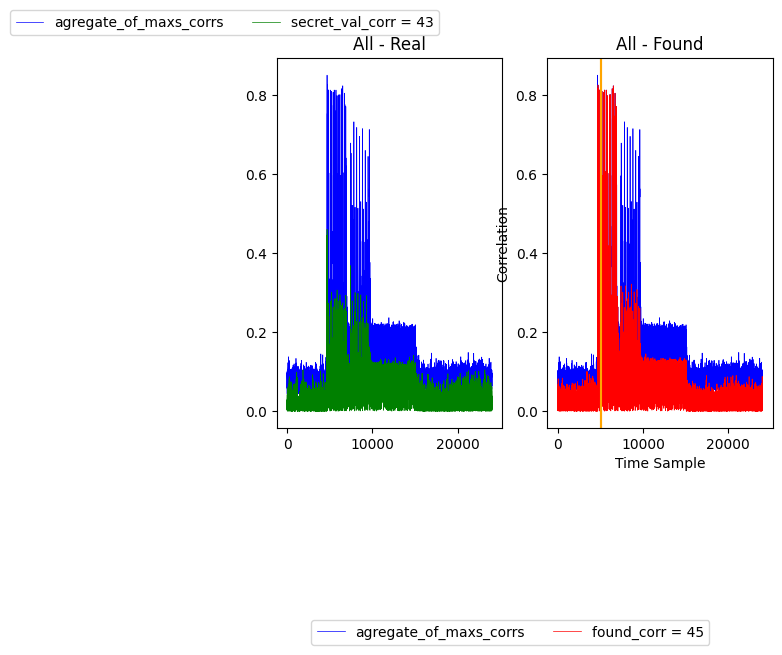

Hello 0
In range 5096 - 24000
 Found the soonest secret value is 45, at the time sample 5122, with correlation secret_corr = 0.741


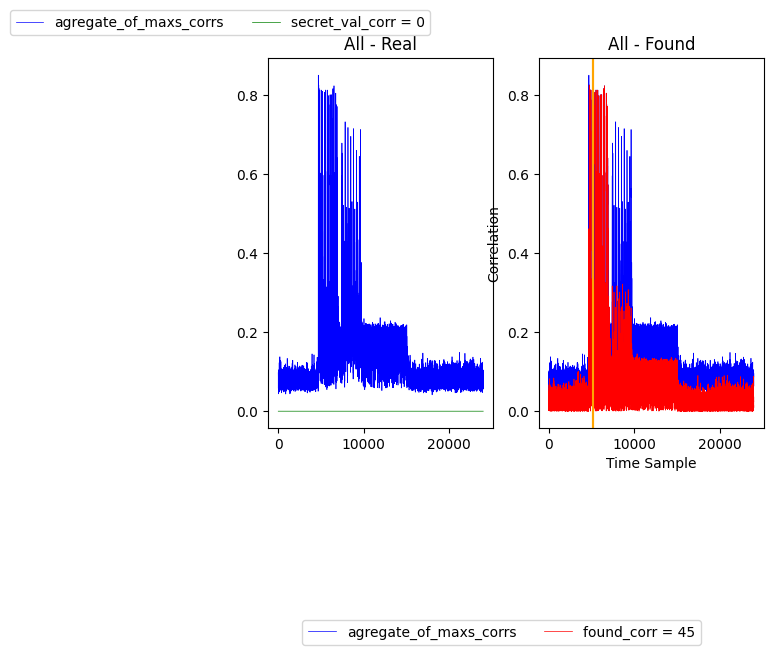

Hello 207
In range 5160 - 24000
 Found the soonest secret value is 45, at the time sample 5198, with correlation secret_corr = 0.787


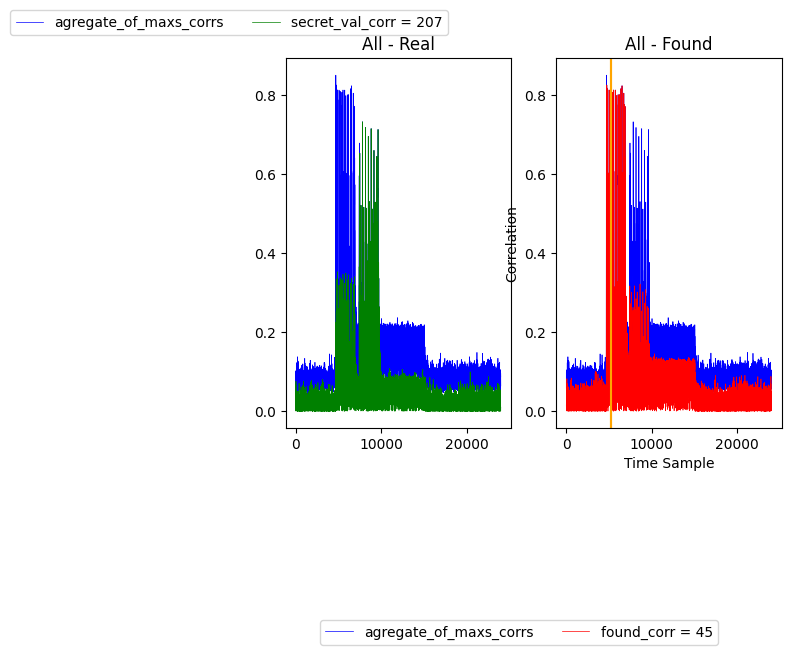

Hello 41
In range 5214 - 24000
 Found the soonest secret value is 45, at the time sample 5230, with correlation secret_corr = 0.597


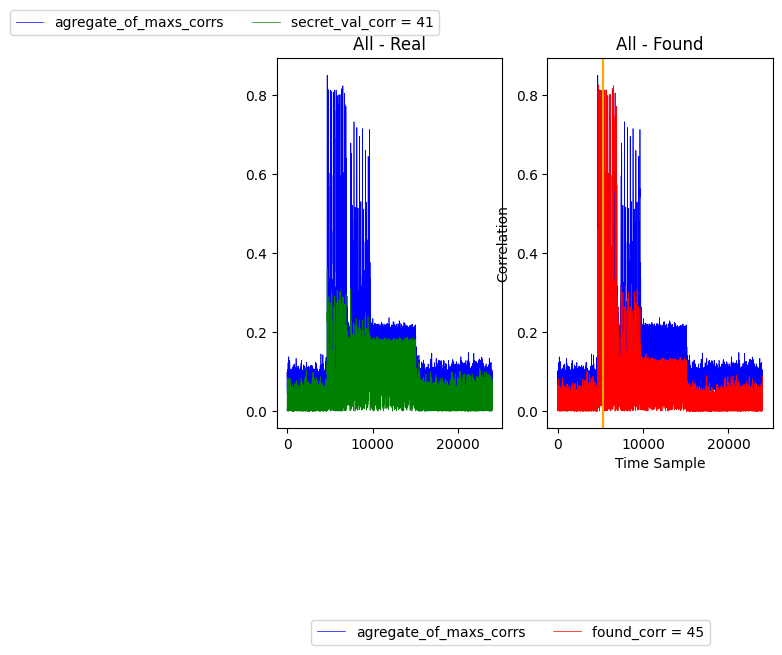

Hello 180
In range 5315 - 24000
 Found the soonest secret value is 45, at the time sample 5401, with correlation secret_corr = 0.808


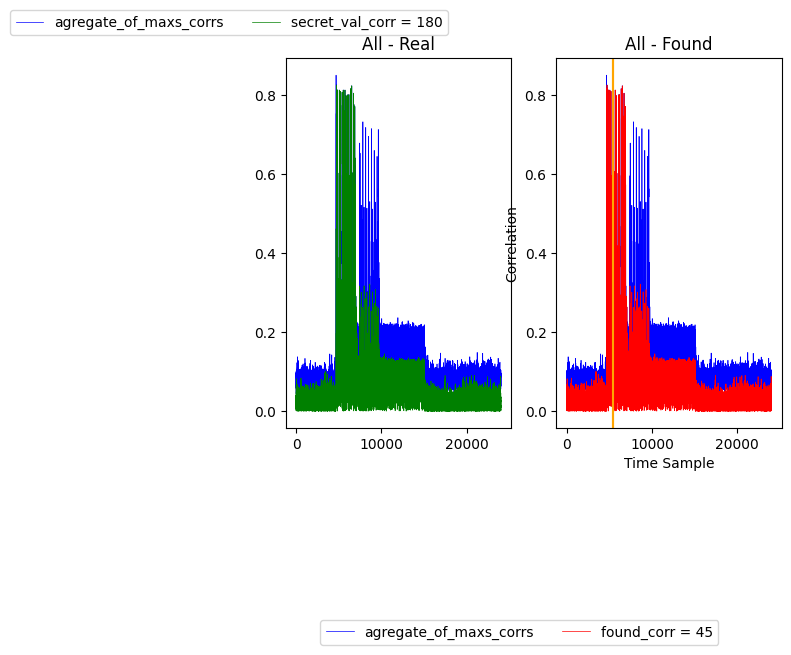

Hello 216
In range 5428 - 24000
 Found the soonest secret value is 45, at the time sample 5454, with correlation secret_corr = 0.744


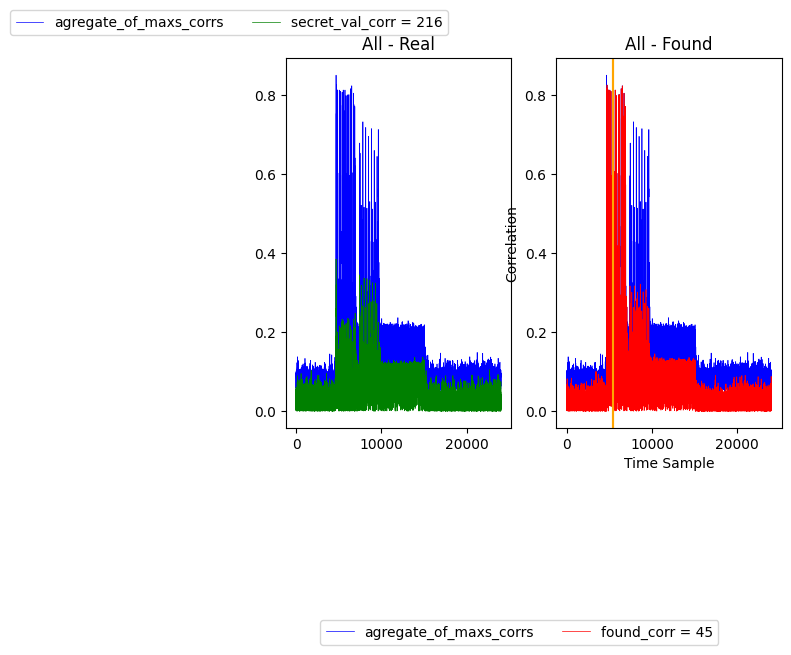

In [110]:
np_in_corr1 = np.array(in_corr1[:,:,0,1])
corr_map = abs(np.nan_to_num(np_in_corr1))
analyse_corr(corr_map=corr_map, weights=np.array(out)[3:-4], stop_num = 12, maxims_map = None,
                 _index = 0, peak_range = 0.4, show_info=True, mountain_half_dist = 5, level = 3)

##### in_sc_corr1 analyis

- In this case, first and first after 0 are target weights

In [ ]:
np.array(in_corr1)[:,:]

In [ ]:
corr_map = abs(np.array(in_sc_corr1)[:,:, 0])
analyse_corr(corr_map=corr_map, weights=np.array(out)[3:-4], stop_num = 12, maxims_map = None,
                 _index = 0, peak_range = 0.3, show_info=True, mountain_half_dist = 5, level = 3)

### Experimental sc.signal.correlation

In [ ]:
from datetime import datetime, timedelta
start_now = datetime.now()
trace_len = 24000
secret_value = 45
n_traces = 1000
leak_model = np.array([[hw[np.uint32(rand_input[i] *  secret_value) % 256] for i in range(n_traces)] for j in range(trace_len)])
leak_model = np.transpose(leak_model)
test_corr = scipy.signal.correlate2d(np.array(waves), leak_model, mode='full')
after_now = datetime.now()
print(after_now - start_now)

In [ ]:
corr_test_map = []
trace_len = 24000
for secret_value in trange(256, desc='Calculating Correlations for secret key'):
    leak_model = np.array([[hw[np.uint32(rand_input[i] *  secret_value) % 256] for i in range(n_traces)] for j in range(trace_len)])
    leak_model = np.transpose(leak_model)
    corr_test_map.append(scipy.signal.correlate2d(np.array(waves), leak_model, mode='full'))

## SPA

#### OLD 7542

⚠️ Changed, firmware config!!!
✔️ Firmware maked, with command cd %s | make CRYPTO_TARGET=%s PLATFORM=%s FIRMWAREPATH=%s SS_VER=%s TARGET=%s> output.txt 2>warnings_new.txt.
INFO: Found ChipWhisperer😍
✔️ INFO: Scope and Target, are set😍
❤️ Target hex: ./makefile_dir_2-akt/simpleserial-target-CWLITEARM.hex
Detected known STMF32: STM32F302xB(C)/303xB(C)
Extended erase (0x44), this can take ten seconds or more
Attempting to program 17083 bytes at 0x8000000
STM32F Programming flash...
STM32F Reading flash...
Verified flash OK, 17083 bytes
✔️ Setuper initiated.


Capturing and Analysing the traces::   0%|          | 0/1 [00:00<?, ?it/s]

⚠️ Generating rand_input..


                                Capturing traces:   0%|          | 0/1000 [00:00<?, ?it/s]

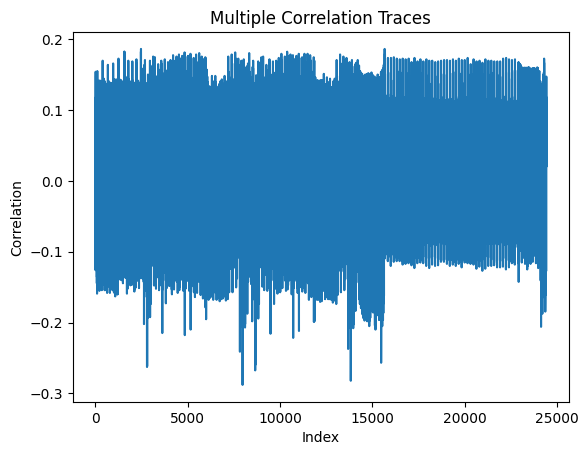

✔️ Saving Rand_input succesfull.
🌍 Saving Secret_weights succesfull.
CWbytearray(b'00 72 2b 2d cf 46 29 04 00 b4 78 d8 68 a7 00 ff 3f 2b f1 fc 00 d9 7a 96 09 2c 00 a5 57 74 64 c4 00 af 15 28 a4 e9 00 57 db 5e 20 fb 00 00 cd 00')


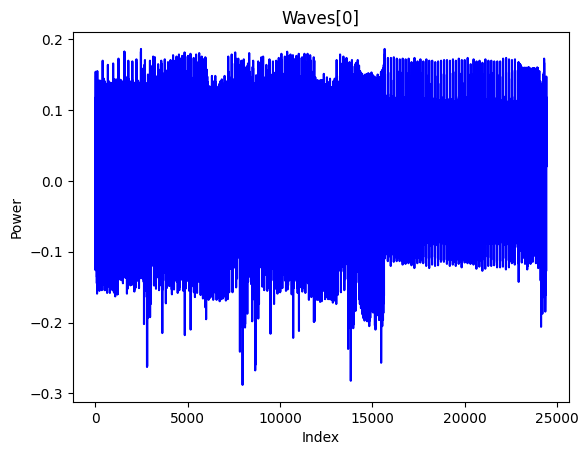

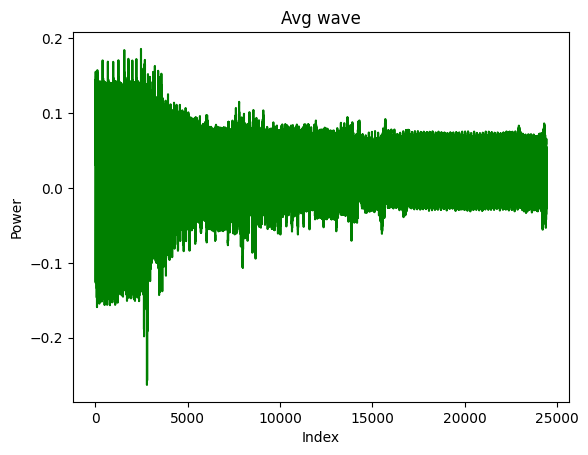

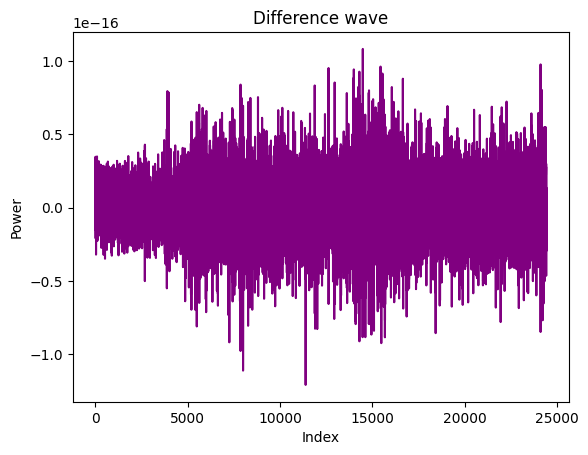

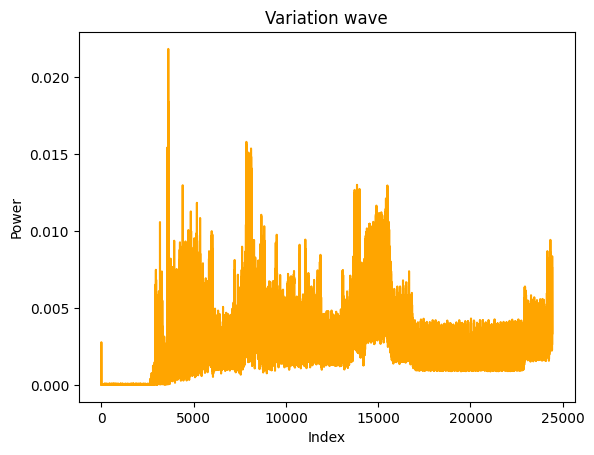

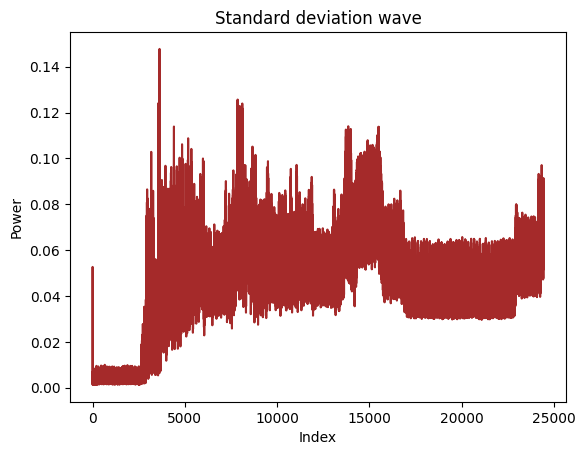

✔️ Scope disconnected.
✔️ Firmware disconnected.


In [47]:
scope, target, cw_setuper = setup("makefile_dir_2-akt")
time.sleep(10)
rand_input, waves, out = capture_target(scope, epochs_list = [1000], ncorr_all1 = None, ncorr_all2 = None, decimate = 2, reverse = False, runName="_722_BasicMLP")

#### 722

⚠️ Changed, firmware config!!!
✔️ Firmware maked, with command cd %s | make CRYPTO_TARGET=%s PLATFORM=%s FIRMWAREPATH=%s SS_VER=%s TARGET=%s> output.txt 2>warnings_new.txt.
INFO: Found ChipWhisperer😍
✔️ INFO: Scope and Target, are set😍
❤️ Target hex: ./makefile_dir_basic_quantized2_MLP-Rand-2/simpleserial-target-CWLITEARM.hex
Detected known STMF32: STM32F302xB(C)/303xB(C)
Extended erase (0x44), this can take ten seconds or more
Attempting to program 22715 bytes at 0x8000000
STM32F Programming flash...
STM32F Reading flash...
Verified flash OK, 22715 bytes
✔️ Setuper initiated.


Capturing and Analysing the traces::   0%|          | 0/1 [00:00<?, ?it/s]

⚠️ Generating rand_input..


                                Capturing traces:   0%|          | 0/1000 [00:00<?, ?it/s]

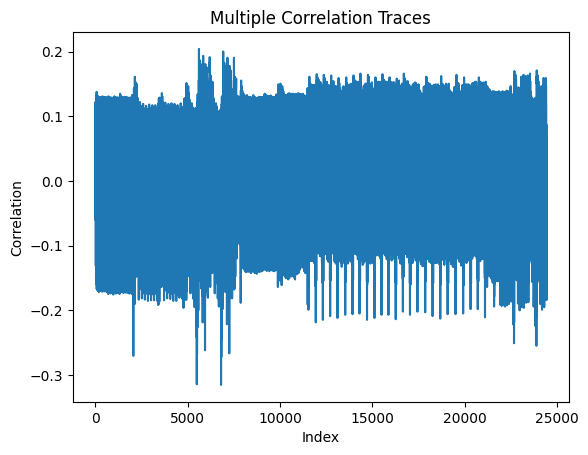

✔️ Saving Rand_input succesfull.
🌍 Saving Secret_weights succesfull.
CWbytearray(b'00 72 16 2d 46 04 78 68 ff 2b 00 cf 29 b4 d8 a7 3f f1 00 00 00 00 00 f0 00 ba 00')


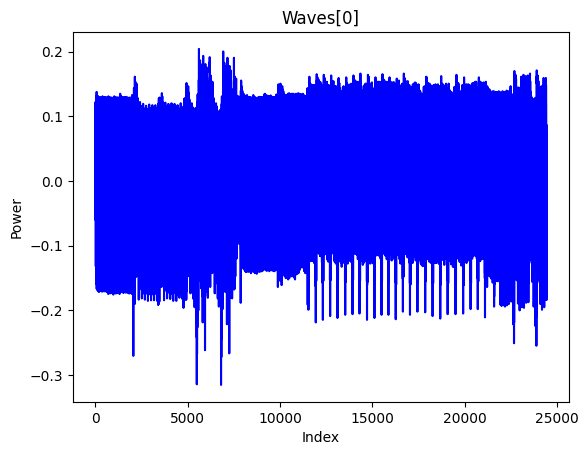

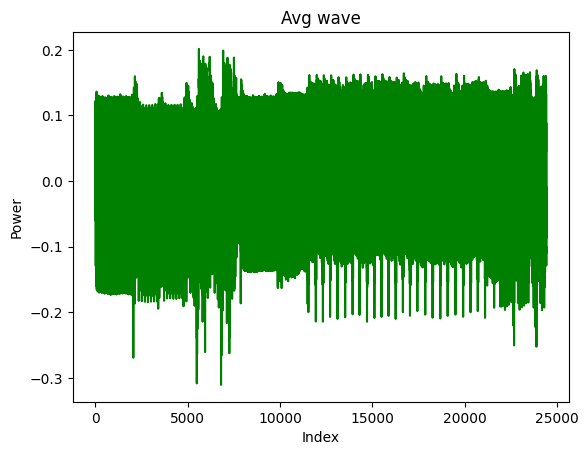

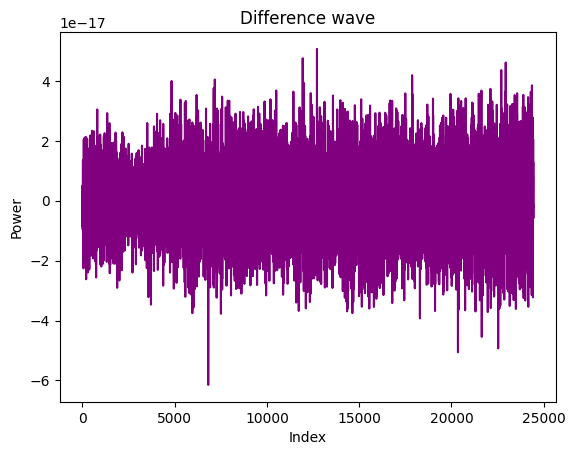

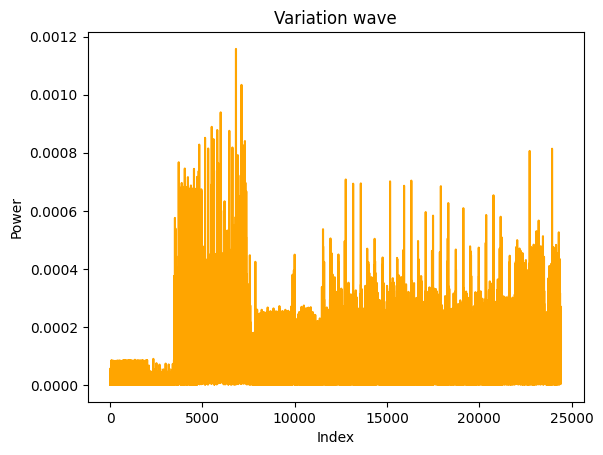

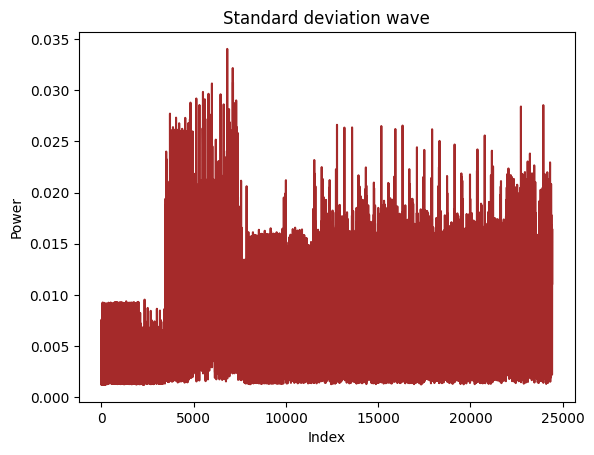

✔️ Scope disconnected.
✔️ Firmware disconnected.


In [48]:
scope, target, cw_setuper = setup("makefile_dir_basic_quantized2_MLP-Rand-2")
time.sleep(10)
rand_input, waves, out = capture_target(scope, epochs_list = [1000], ncorr_all1 = None, ncorr_all2 = None, decimate = 2, reverse = False, runName="_722_BasicMLP")

#### 7222

⚠️ Changed, firmware config!!!
✔️ Firmware maked, with command cd %s | make CRYPTO_TARGET=%s PLATFORM=%s FIRMWAREPATH=%s SS_VER=%s TARGET=%s> output.txt 2>warnings_new.txt.
INFO: Found ChipWhisperer😍
✔️ INFO: Scope and Target, are set😍
❤️ Target hex: ./makefile_dir_basic_quantized2_MLP-Rand-2-VAR/simpleserial-target-CWLITEARM.hex
Detected known STMF32: STM32F302xB(C)/303xB(C)
Extended erase (0x44), this can take ten seconds or more
Attempting to program 22679 bytes at 0x8000000
STM32F Programming flash...
STM32F Reading flash...
Verified flash OK, 22679 bytes
✔️ Setuper initiated.


Capturing and Analysing the traces::   0%|          | 0/1 [00:00<?, ?it/s]

⚠️ Generating rand_input..


                                Capturing traces:   0%|          | 0/1000 [00:00<?, ?it/s]

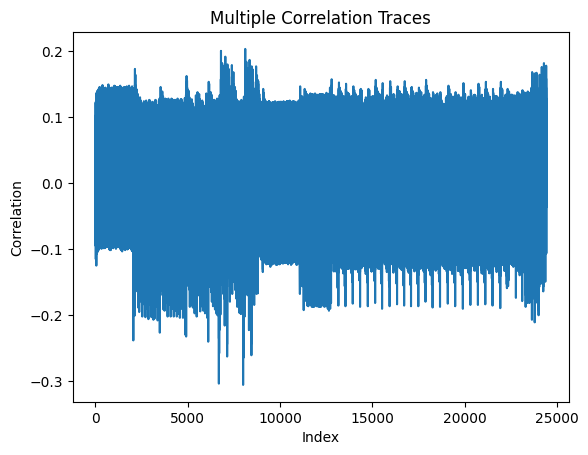

✔️ Saving Rand_input succesfull.
🌍 Saving Secret_weights succesfull.
CWbytearray(b'00 72 16 2d 46 04 78 68 ff 2b 00 cf 29 b4 d8 a7 3f f1 00 38 4b 13 00 70 00 b8 00')


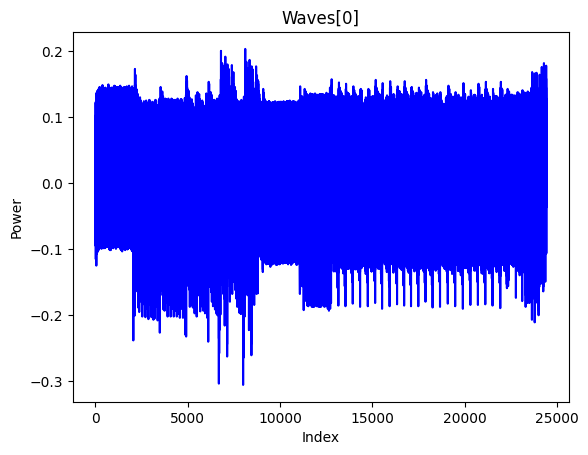

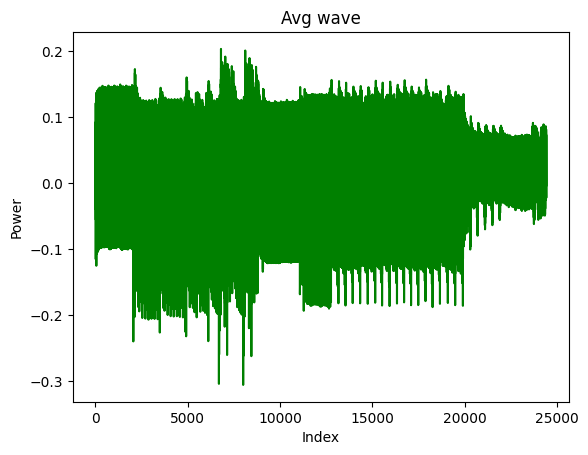

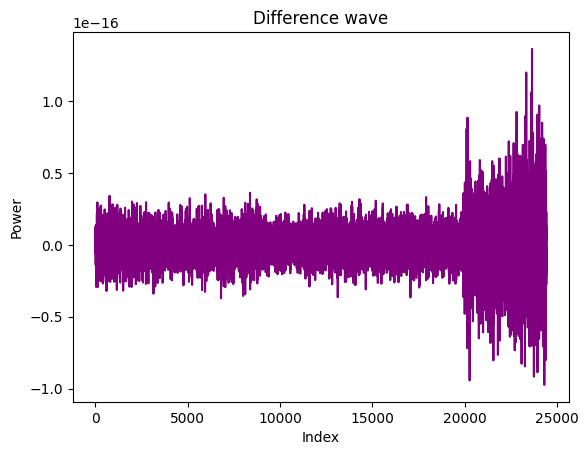

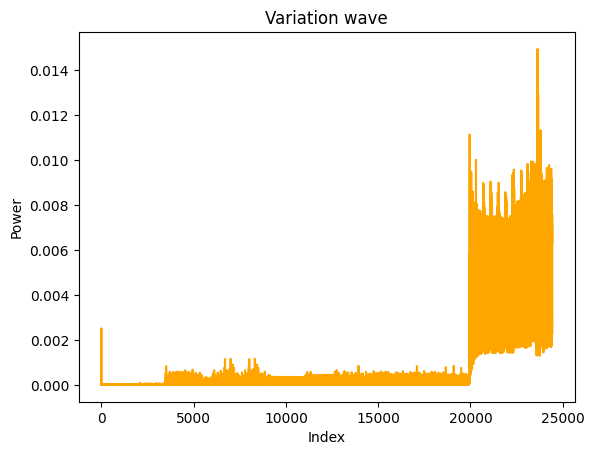

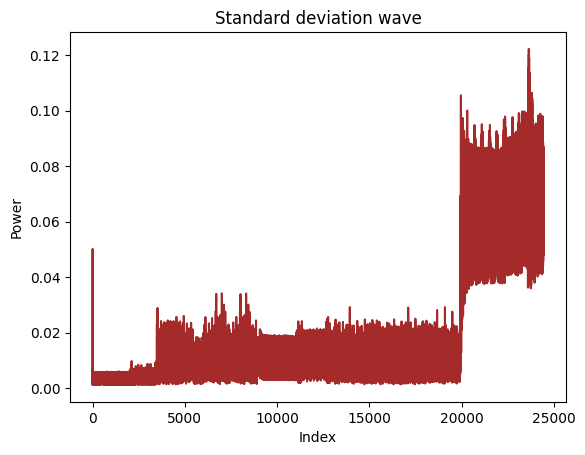

✔️ Scope disconnected.
✔️ Firmware disconnected.


In [54]:
scope, target, cw_setuper = setup("makefile_dir_basic_quantized2_MLP-Rand-2-VAR")
time.sleep(10)
rand_input, waves, out = capture_target(scope, epochs_list = [1000], ncorr_all1 = None, ncorr_all2 = None, decimate = 2, reverse = False, runName="_7222_BasicMLP")

#### 72222

⚠️ Changed, firmware config!!!
✔️ Firmware maked, with command cd %s | make CRYPTO_TARGET=%s PLATFORM=%s FIRMWAREPATH=%s SS_VER=%s TARGET=%s> output.txt 2>warnings_new.txt.
INFO: Found ChipWhisperer😍
✔️ INFO: Scope and Target, are set😍
❤️ Target hex: ./makefile_dir_basic_quantized2_MLP-Rand-2-VAR-72222/simpleserial-target-CWLITEARM.hex
Detected known STMF32: STM32F302xB(C)/303xB(C)
Extended erase (0x44), this can take ten seconds or more
Attempting to program 22683 bytes at 0x8000000
STM32F Programming flash...
STM32F Reading flash...
Verified flash OK, 22683 bytes
✔️ Setuper initiated.


Capturing and Analysing the traces::   0%|          | 0/1 [00:00<?, ?it/s]

⚠️ Generating rand_input..


                                Capturing traces:   0%|          | 0/1000 [00:00<?, ?it/s]

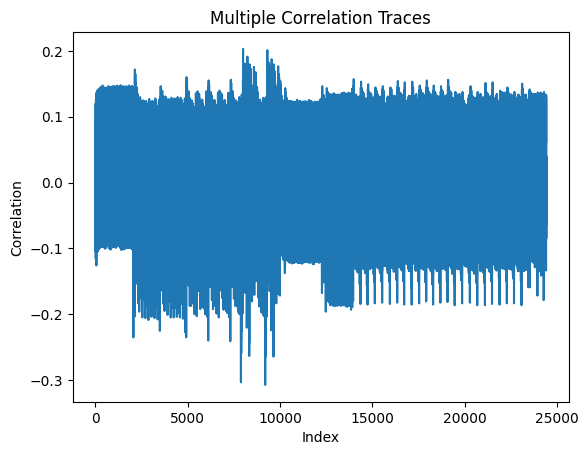

✔️ Saving Rand_input succesfull.
🌍 Saving Secret_weights succesfull.
CWbytearray(b'00 72 16 2d 46 04 78 68 ff 2b 00 cf 29 b4 d8 a7 3f f1 00 28 45 13 00 70 00 77 00')


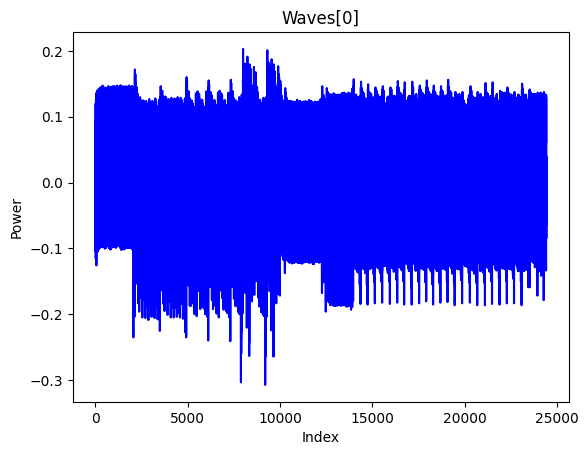

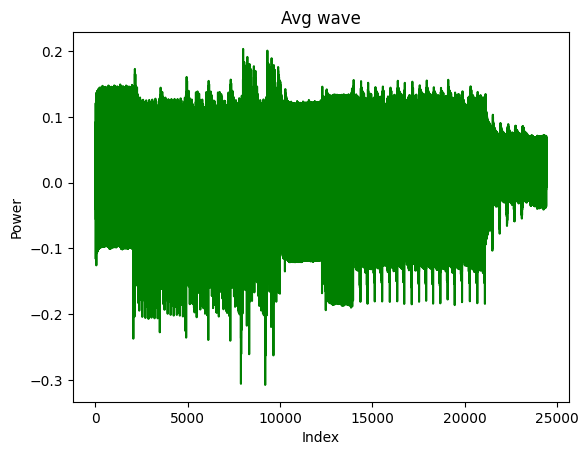

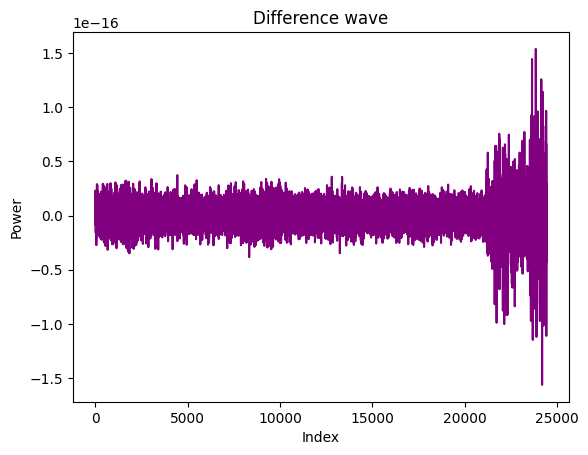

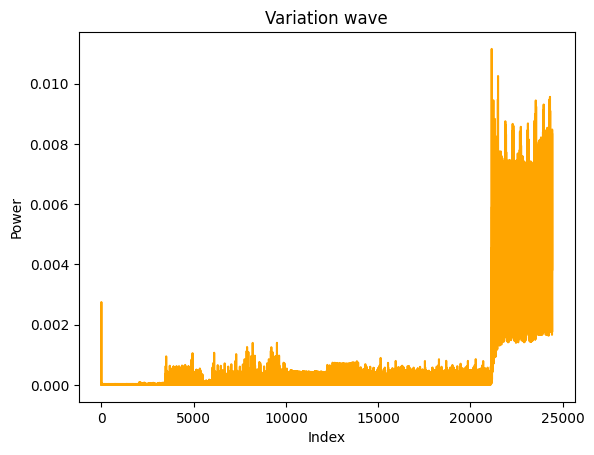

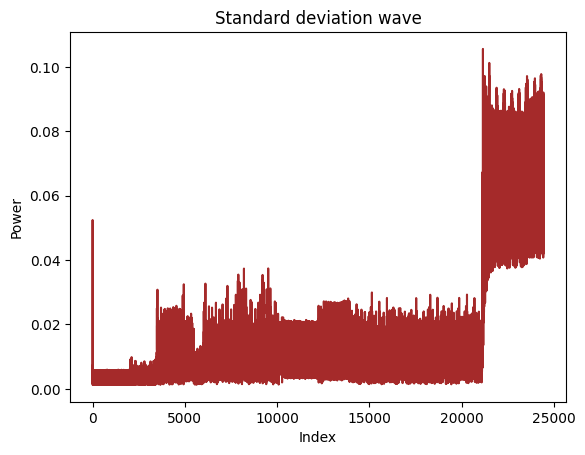

✔️ Scope disconnected.
✔️ Firmware disconnected.


In [51]:
scope, target, cw_setuper = setup("makefile_dir_basic_quantized2_MLP-Rand-2-VAR-72222")
time.sleep(10)
rand_input, waves, out = capture_target(scope, epochs_list = [1000], ncorr_all1 = None, ncorr_all2 = None, decimate = 2, reverse = False, runName="_72222_BasicMLP")

#### 75647

⚠️ Changed, firmware config!!!
✔️ Firmware maked, with command cd %s | make CRYPTO_TARGET=%s PLATFORM=%s FIRMWAREPATH=%s SS_VER=%s TARGET=%s> output.txt 2>warnings_new.txt.
INFO: Found ChipWhisperer😍
✔️ INFO: Scope and Target, are set😍
❤️ Target hex: ./makefile_dir_basic_quantized2_MLP-Rand-2-VAR-75647/simpleserial-target-CWLITEARM.hex
Detected known STMF32: STM32F302xB(C)/303xB(C)
Extended erase (0x44), this can take ten seconds or more
Attempting to program 22683 bytes at 0x8000000
STM32F Programming flash...
STM32F Reading flash...
Verified flash OK, 22683 bytes
✔️ Setuper initiated.


Capturing and Analysing the traces::   0%|          | 0/1 [00:00<?, ?it/s]

⚠️ Generating rand_input..


                                Capturing traces:   0%|          | 0/1000 [00:00<?, ?it/s]

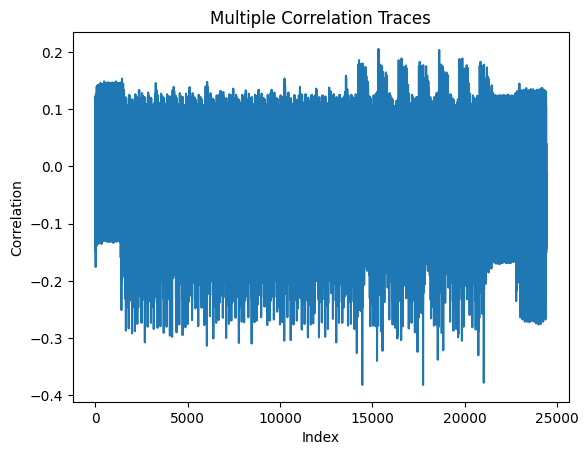

✔️ Saving Rand_input succesfull.
🌍 Saving Secret_weights succesfull.
CWbytearray(b'00 72 2b 2d b4 ff d9 a5 af 57 00 cf 78 3f 7a 57 15 db 00 46 d8 2b 96 74 28 5e 00 29 68 f1 09 64 a4 20 00 04 a7 fc 2c c4 e9 fb 00 97 51 00 4f 00')


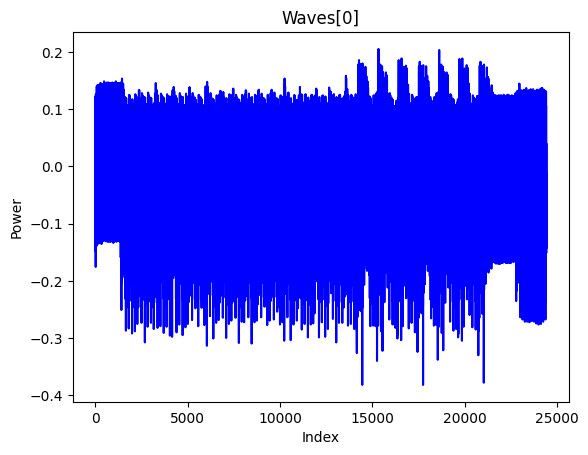

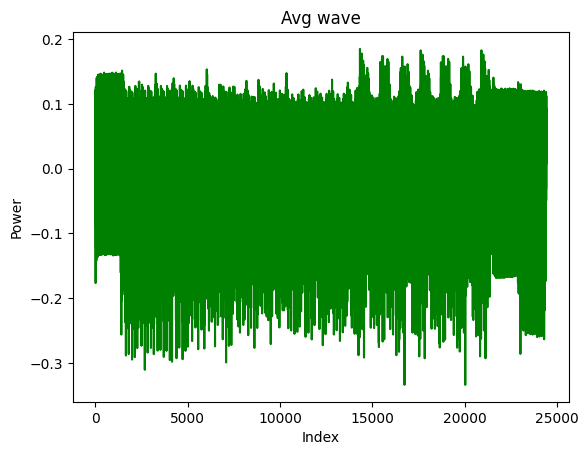

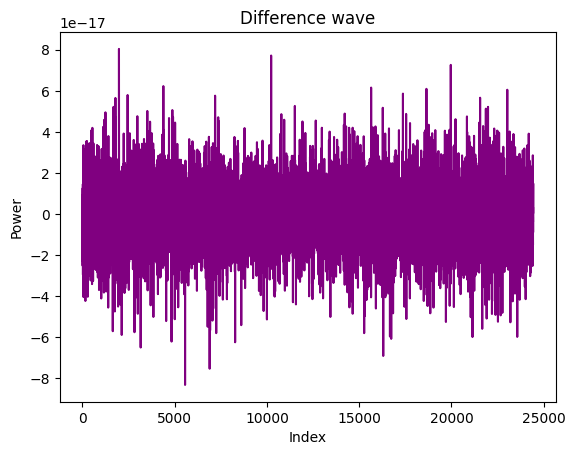

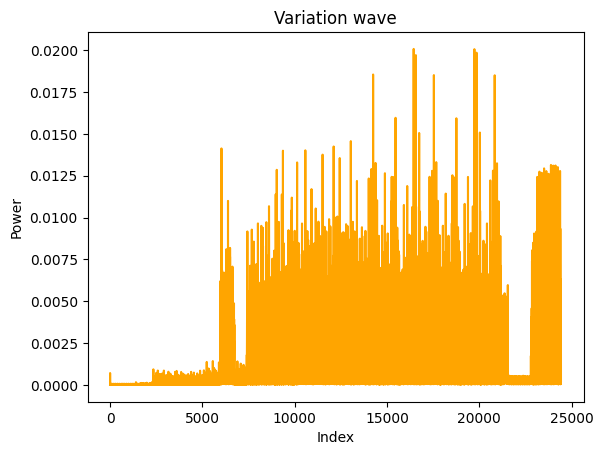

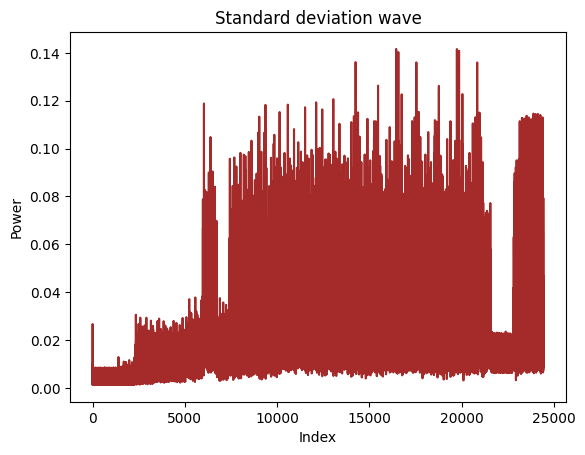

✔️ Scope disconnected.
✔️ Firmware disconnected.


In [58]:
scope, target, cw_setuper = setup("makefile_dir_basic_quantized2_MLP-Rand-2-VAR-75647")
time.sleep(10)
rand_input, waves, out = capture_target(scope, epochs_list = [1000], ncorr_all1 = None, ncorr_all2 = None,
                                        decimate = 3, reverse = False, runName="_75642_BasicMLP")

#### 756464

⚠️ Changed, firmware config!!!
✔️ Firmware maked, with command cd %s | make CRYPTO_TARGET=%s PLATFORM=%s FIRMWAREPATH=%s SS_VER=%s TARGET=%s> output.txt 2>warnings_new.txt.
INFO: Found ChipWhisperer😍
✔️ INFO: Scope and Target, are set😍
❤️ Target hex: ./makefile_dir_basic_quantized2_MLP-Rand-2-VAR-756464/simpleserial-target-CWLITEARM.hex
Detected known STMF32: STM32F302xB(C)/303xB(C)
Extended erase (0x44), this can take ten seconds or more
Attempting to program 22687 bytes at 0x8000000
STM32F Programming flash...
STM32F Reading flash...
Verified flash OK, 22687 bytes
✔️ Setuper initiated.


Capturing and Analysing the traces::   0%|          | 0/1 [00:00<?, ?it/s]

⚠️ Generating rand_input..


                                Capturing traces:   0%|          | 0/1000 [00:00<?, ?it/s]

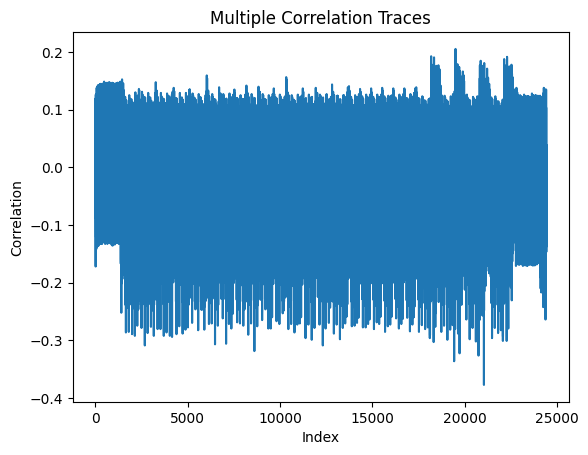

✔️ Saving Rand_input succesfull.
🌍 Saving Secret_weights succesfull.
CWbytearray(b'00 72 2b 2d b4 ff d9 a5 af 57 00 cf 78 3f 7a 57 15 db 00 46 d8 2b 96 74 28 5e 00 29 68 f1 09 64 a4 20 00 04 a7 fc 2c c4 e9 fb 00 b5 52 00 c6 00')


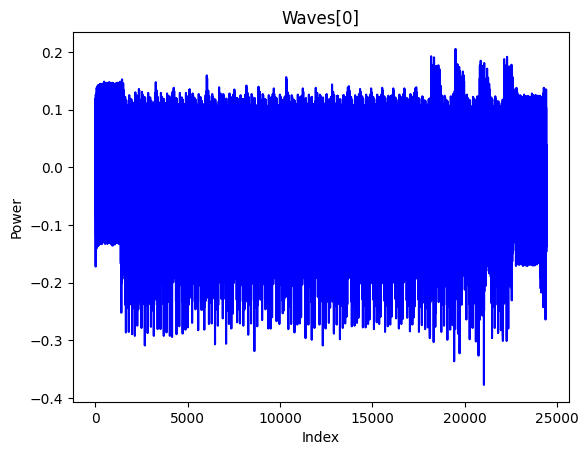

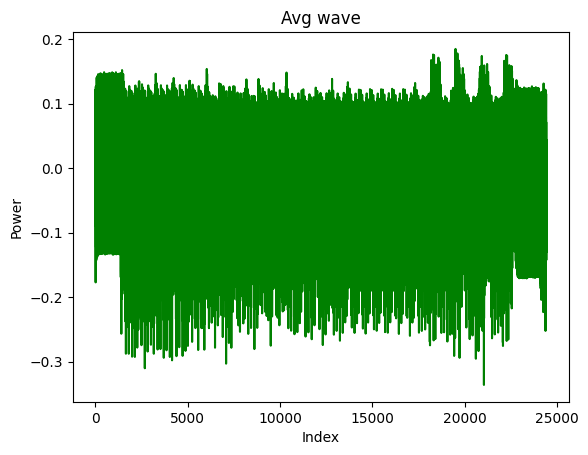

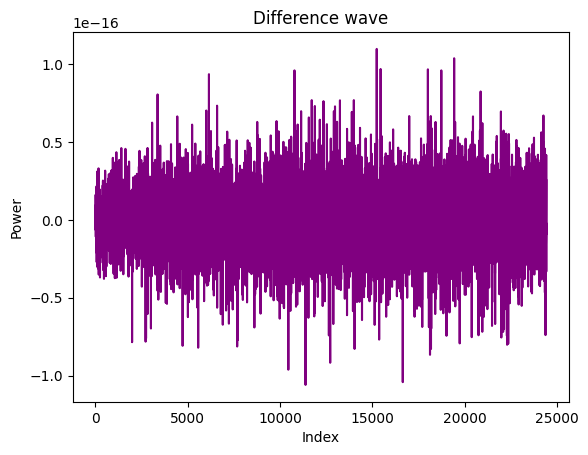

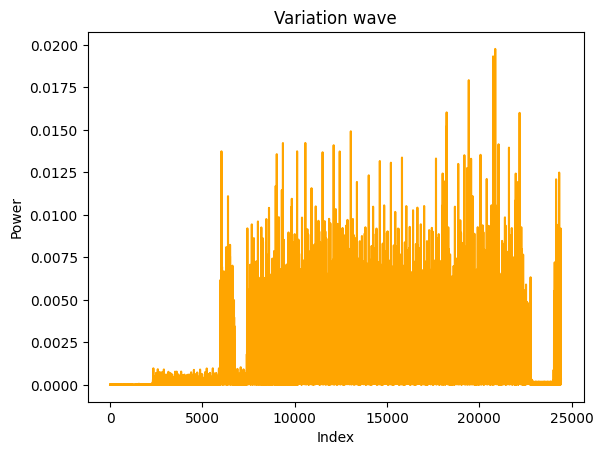

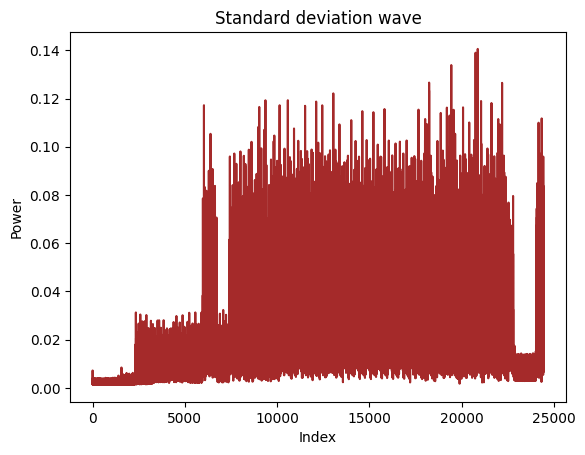

✔️ Scope disconnected.
✔️ Firmware disconnected.


In [59]:
scope, target, cw_setuper = setup("makefile_dir_basic_quantized2_MLP-Rand-2-VAR-756464")
time.sleep(10)
rand_input, waves, out = capture_target(scope, epochs_list = [1000], ncorr_all1 = None, ncorr_all2 = None,
                                        decimate = 3, reverse = False, runName="_756464_BasicMLP")